In [71]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import random
import os
from sklearn.cluster import MiniBatchKMeans
from imblearn.combine import SMOTETomek, SMOTEENN
from sklearn.model_selection import train_test_split, KFold
from sklearn.preprocessing import LabelBinarizer
from itertools import cycle
from imblearn.over_sampling import SMOTE, BorderlineSMOTE
from tensorflow.keras.regularizers import l2
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.optimizers import Adam
from keras.models import Model, Sequential
from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras.layers import Input, Embedding, Dense, Conv1D, Flatten, Concatenate, Dropout
from sklearn.metrics import roc_curve, roc_auc_score, confusion_matrix, classification_report, RocCurveDisplay

## Load Data

In [49]:
X_train = pd.read_pickle('X_train.pkl')
X_test = pd.read_pickle('X_test.pkl')
y_train = pd.read_pickle('y_train.pkl')
y_test = pd.read_pickle('y_test.pkl')

In [50]:
print(f"Training dataset size: {X_train.shape, y_train.shape}")
print(f"Test dataset size: {X_test.shape, y_test.shape}")

Training dataset size: ((1482243, 97), (1482243,))
Test dataset size: ((635247, 97), (635247,))


In [51]:
X_train = X_train.astype({col: 'float64' for col in X_train.select_dtypes(include=['boolean']).columns})
X_test = X_test.astype({col: 'float64' for col in X_test.select_dtypes(include=['boolean']).columns})

In [52]:
# mapping for y from data_preprocess notebook
class_mapping = {
    0: 'Backdoor',
    1: 'DDoS_HTTP',
    2: 'DDoS_ICMP',
    3: 'DDoS_TCP',
    4: 'Normal', 
    5: 'OS_Fingerprinting',
    6: 'Password',
    7: 'Port_Scanning',
    8: 'Ransomware',
    9: 'SQL_injection',
    10: 'Uploading',
    11: 'Vulnerability_scanner',
    12: 'XSS'
}

In [53]:
def hist(y):
    plt.figure(figsize=(10, 6))
    plt.hist(y, bins=np.arange(-0.5, len(class_mapping)))

    plt.xlabel('Classes', fontsize=14)
    plt.ylabel('Frequency', fontsize=14)

    plt.xticks(ticks=np.arange(len(class_mapping)), labels=list(class_mapping.values()), rotation=45)
    plt.xlim(-0.5, len(class_mapping) - 0.5)  

    plt.tight_layout()


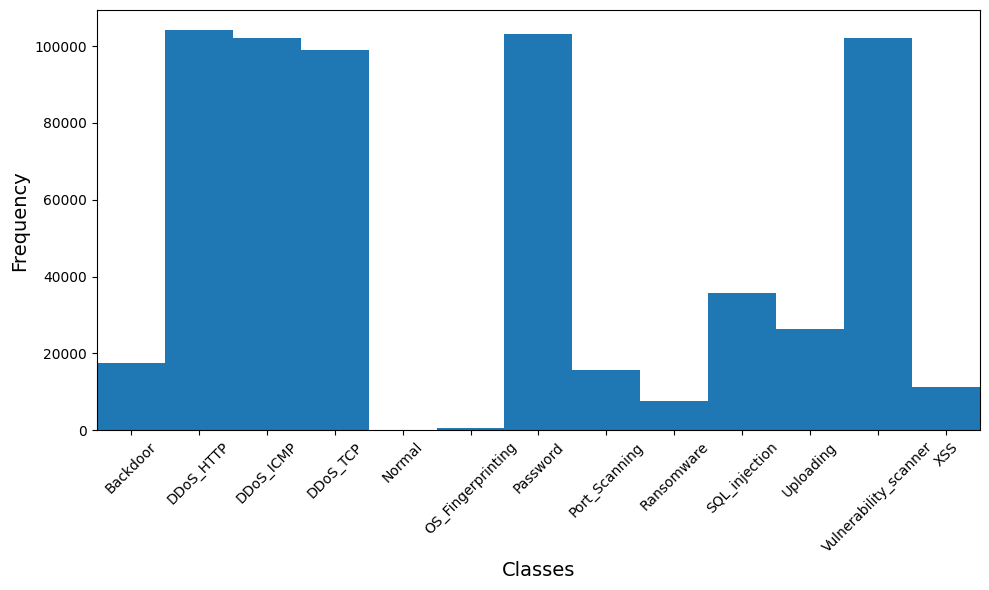

In [54]:
# for train set
# get attack classes only
y_train_df = pd.DataFrame(y_train, columns=['attack_label'])
df_train = pd.concat([pd.DataFrame(X_train), y_train_df], axis=1)
df_train = df_train[df_train['attack_label'] != 4]
X_train = df_train.drop('attack_label', axis=1)
y_train = df_train['attack_label']
hist(y_train)

In [55]:
# for test set
# get attack classes only
y_test_df = pd.DataFrame(y_test, columns=['attack_label'])
df_test = pd.concat([pd.DataFrame(X_test), y_test_df], axis=1)
df_test = df_test[df_test['attack_label'] != 4]
df_test['attack_label'].nunique()
X_test = df_test.drop('attack_label', axis=1)
y_test = df_test['attack_label']

In [56]:
print(f"Training dataset size for attack classes: {X_train.shape, y_train.shape}")
print(f"Test dataset size for attack classes: {X_test.shape, y_test.shape}")

Training dataset size for attack classes: ((625403, 97), (625403,))
Test dataset size for attack classes: ((268030, 97), (268030,))


In [57]:
# combine for aggregation
# y_train_df = pd.DataFrame(y_resampled, columns=['attack_label'])
# combined_df = pd.concat([X_resampled, y_train_df], axis=1)
# combine for aggregation
y_train_df = pd.DataFrame(y_train, columns=['attack_label'])
combined_df = pd.concat([X_train, y_train_df], axis=1)

In [58]:
combined_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 625403 entries, 1 to 1482242
Data columns (total 98 columns):
 #   Column                                                                                                Non-Null Count   Dtype  
---  ------                                                                                                --------------   -----  
 0   frame.time                                                                                            625403 non-null  int64  
 1   ip.src_host                                                                                           625403 non-null  float64
 2   ip.dst_host                                                                                           625403 non-null  float64
 3   arp.dst.proto_ipv4                                                                                    625403 non-null  float64
 4   arp.src.proto_ipv4                                                                              

In [59]:
X_test.drop(['frame.time', 'ip.dst_host'], axis=1, inplace=True)
X_test_cnn = np.array(X_test).reshape((X_test.shape[0], X_test.shape[1], 1))

## Group by time buckets & destination ip + aggregation

In [60]:
np.random.seed(4266)
def agg_cols(df):
    agg_dict = {}
    cols = df.columns.drop(['time_buckets', 'ip.dst_host'])
    
    for col in cols:
        if col == 'attack_label':
            agg_dict[col] = lambda x: handle_mode(x)
        else:
            agg_dict[col] = 'mean'  # Use mean for other columns
    return agg_dict

def handle_mode(x):
    modes = x.mode()
    if len(modes) == 1:
        return modes[0]  
    elif len(modes) > 1:
        return random.choice(modes)  
    else:
        return x.iloc[0]  # if mode is empty

In [61]:
def discretize_by_time_buckets(df, interval):
    # Create time buckets column based on the specified interval
    df['time_buckets'] = pd.cut(
        df['frame.time'],
        bins=range(int(df['frame.time'].min()), int(df['frame.time'].max()) + interval, interval)
    )
    
    # Drop the original 'frame.time' column
    df.drop('frame.time', axis=1, inplace=True)
    
    # Apply the aggregation function
    agg_dict = agg_cols(df)
    agg_df = df.groupby(['ip.dst_host', 'time_buckets'], observed=True).agg(agg_dict)
    
    print("Number of rows after aggregation: ", len(agg_df))
    # Separate features and labels
    X = np.array(agg_df.drop('attack_label', axis=1))
    y = np.array(agg_df['attack_label'])
    
    return X, y

## CNN with 5-fold CV + Evaluation metrics

In [62]:
def create_model(input_shape):
    model = Sequential([
        Input(shape=input_shape),
        Conv1D(filters=64, kernel_size=3, activation='relu', kernel_regularizer=l2(0.01)),
        Flatten(),
        Dense(64, activation='relu', kernel_regularizer=l2(0.01)),
        Dropout(0.5),
        Dense(128, activation='relu', kernel_regularizer=l2(0.01)),
        Dropout(0.5),
        Dense(13, activation='softmax')
    ])

    model.compile(optimizer=Adam(learning_rate=0.001),
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])
    return model

In [66]:
def conf_matrix(y_pred_classes):
    # Calculate the confusion matrix based on actual and predicted classes
    # Only include classes that are present in y_test and y_pred_classes
    present_classes = sorted(set(y_test) | set(y_pred_classes))
    conf_matrix = confusion_matrix(y_test, y_pred_classes, labels=present_classes, normalize="true")
    
    # Create a list of class names that are present
    present_class_names = [class_mapping[cls] for cls in present_classes]

    # Plot the confusion matrix
    plt.figure(figsize=(10, 10))
    sns.heatmap(conf_matrix, annot=True, fmt='.2f', cmap='Blues', 
                xticklabels=present_class_names, yticklabels=present_class_names)

    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title('Confusion Matrix of Model Attack Predictions')
    plt.xticks(rotation=45)
    plt.yticks(rotation=45)
    plt.tight_layout()
    plt.show()


In [67]:
def auc_roc_curve(y_score):
    # see sklearn documentation OvR ROC
    lb = LabelBinarizer()
    y_test_onehot = lb.fit_transform(y_test)
    
    # Adjust y_score to match the classes in `y_test` as identified by LabelBinarizer
    existing_classes = lb.classes_
    y_score_existing = y_score[:, existing_classes]  # Use only the columns for the existing classes

    # Compute macro-average AUC
    roc_auc = {"macro": roc_auc_score(y_test_onehot, y_score_existing, multi_class='ovr')}

    fig, ax = plt.subplots(figsize=(12, 12))

    # Plot macro-average ROC curve
    fpr_macro, tpr_macro, _ = roc_curve(y_test_onehot.ravel(), y_score_existing.ravel())
    plt.plot(
        fpr_macro,
        tpr_macro,
        label=f"Macro-average ROC curve (AUC = {roc_auc['macro']:.2f})",
        color="navy",
        linestyle=":",
        linewidth=4,
    )

    # Plot ROC curve for each class using RocCurveDisplay
    colors = cycle(["aqua", "darkorange", "cornflowerblue", "green", "red", "purple", "yellow", "pink", "grey", "brown", "olive", "blue"])
    for class_id, (cls, color) in enumerate(zip(existing_classes, colors)):
        RocCurveDisplay.from_predictions(
            y_test_onehot[:, class_id],
            y_score[:, cls],
            name=f"ROC curve for {class_mapping[cls]}",
            color=color,
            ax=ax,
            plot_chance_level = (class_id==0)
        )

    ax.set(
        xlabel="False Positive Rate",
        ylabel="True Positive Rate",
        title="Receiver Operating Characteristic\nOne-vs-Rest Multiclass",
    )
    plt.legend(loc="lower right", fontsize=10)
    plt.show()



Processing interval: 10s
Number of rows after aggregation:  7181


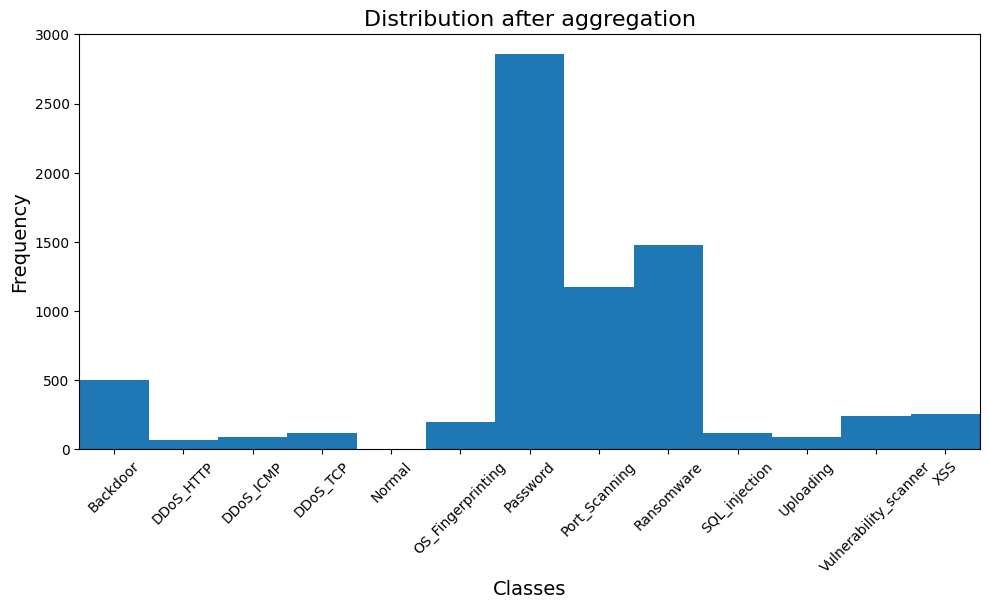

Resampled dataset size: ((34320, 95), (34320,))


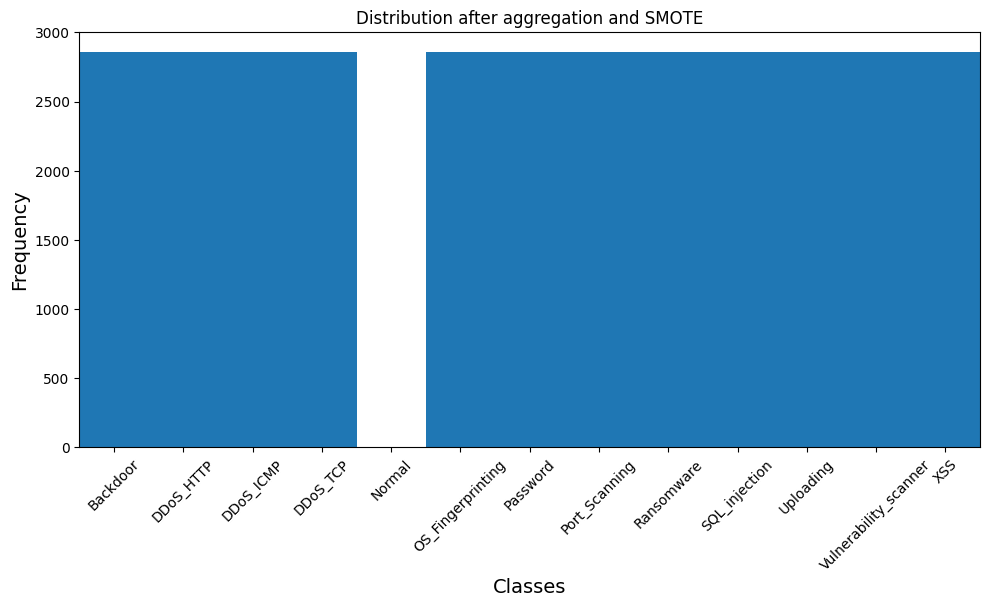

Fold 1
Epoch 1/50
215/215 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.3329 - loss: 2.8631 - val_accuracy: 0.6684 - val_loss: 1.4804
Epoch 2/50
215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - accuracy: 0.5974 - loss: 1.6005 - val_accuracy: 0.7372 - val_loss: 1.2560
Epoch 3/50
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.6617 - loss: 1.4063 - val_accuracy: 0.7455 - val_loss: 1.1942
Epoch 4/50
215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.6945 - loss: 1.3220 - val_accuracy: 0.7638 - val_loss: 1.1445
Epoch 5/50
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.7047 - loss: 1.2859 - val_accuracy: 0.7617 - val_loss: 1.1007
Epoch 6/50
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.7089 - loss: 1.2590 - val_accuracy: 0.7730 - val_loss: 1.0871
Epoch 7/50
215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.7185 - loss: 1.2267 - val_accuracy: 0.7686 - val_loss: 1.0685
Epoch 8/50
215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.7181 - loss: 1.2265 - val_accur

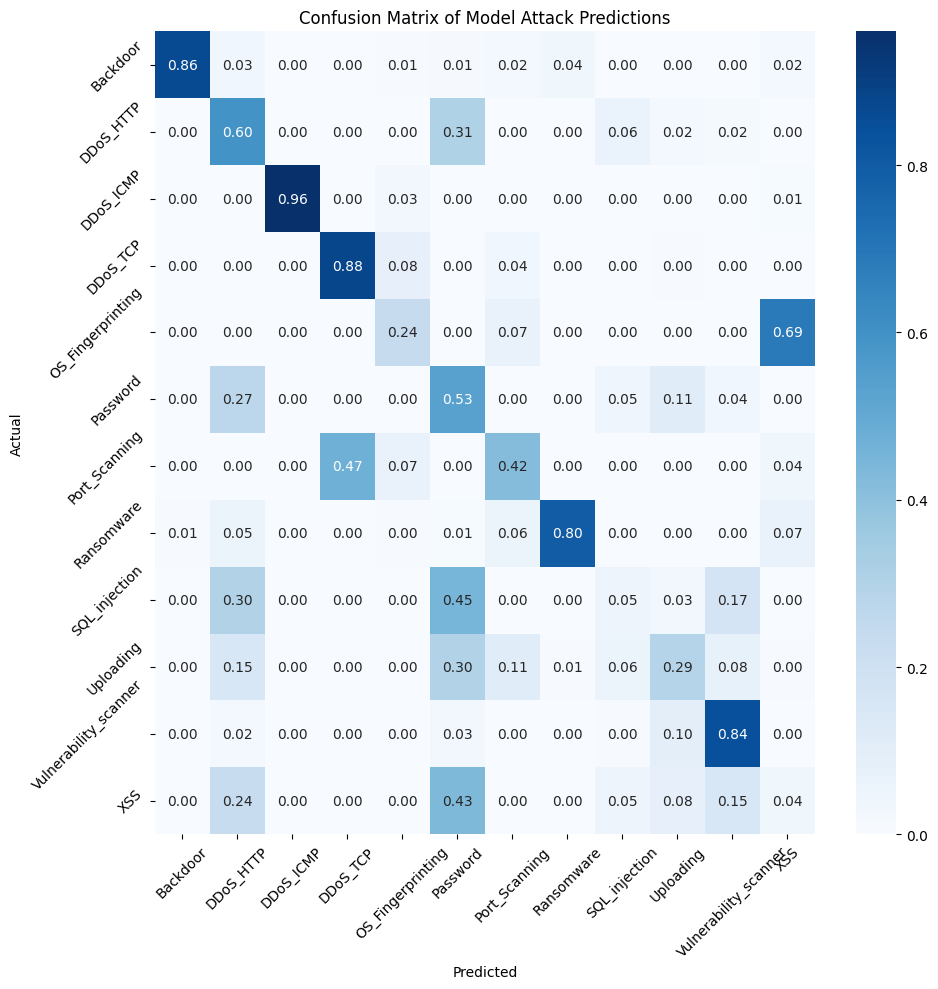

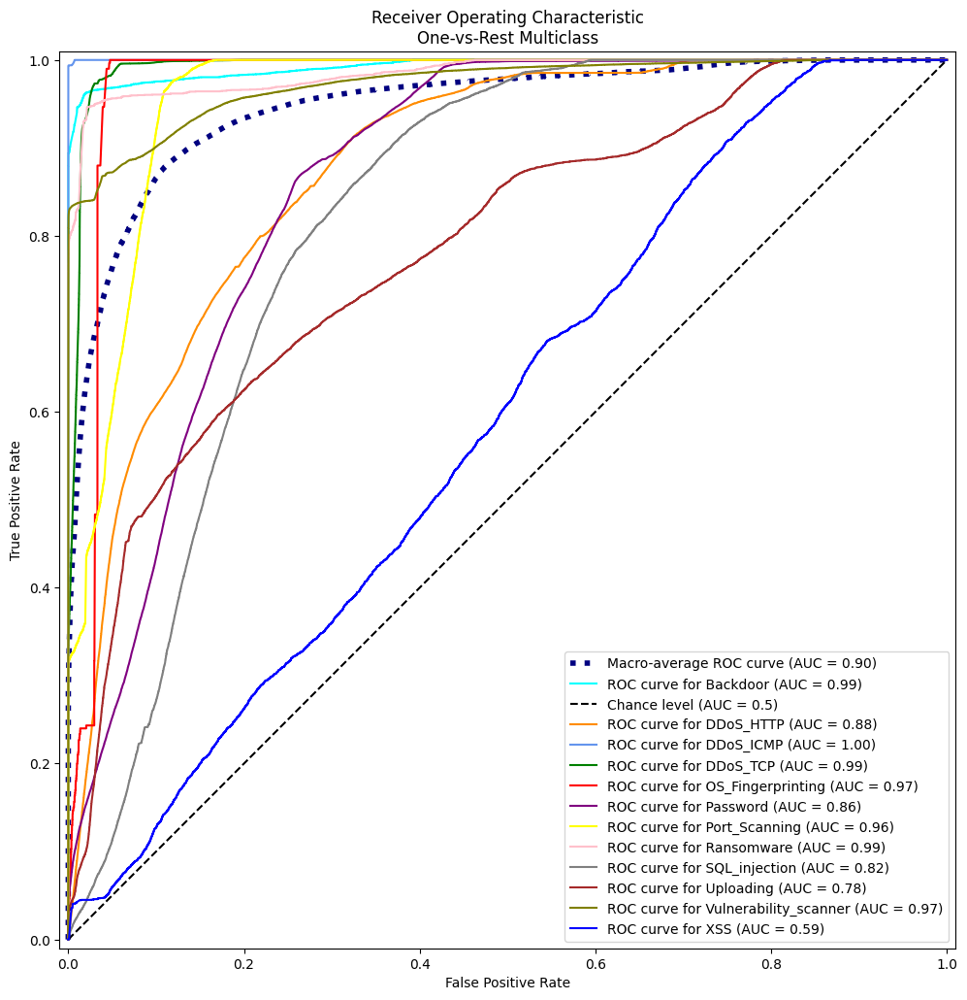

Processing interval: 5s
Number of rows after aggregation:  12716


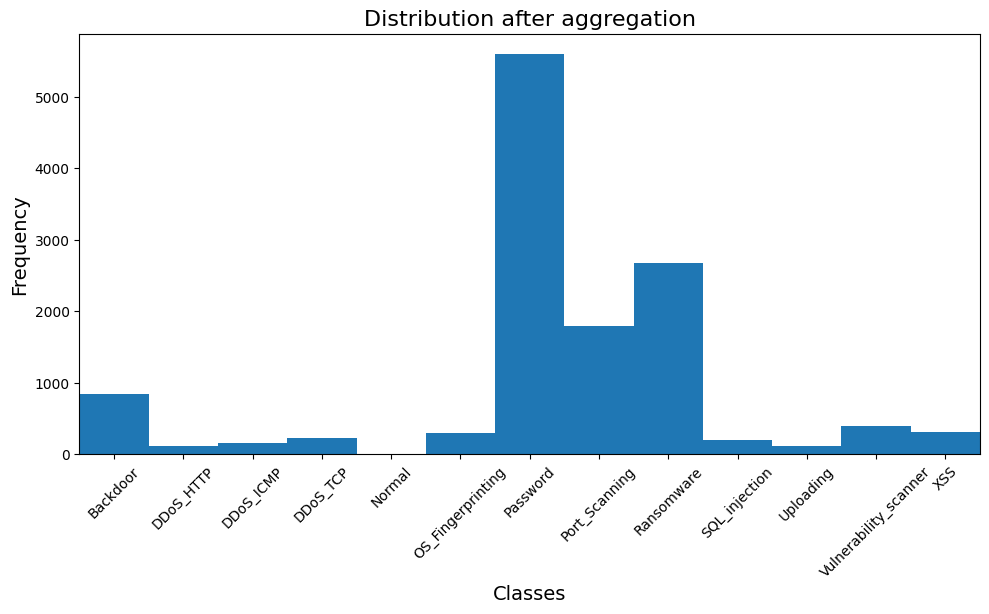

Resampled dataset size: ((67200, 95), (67200,))


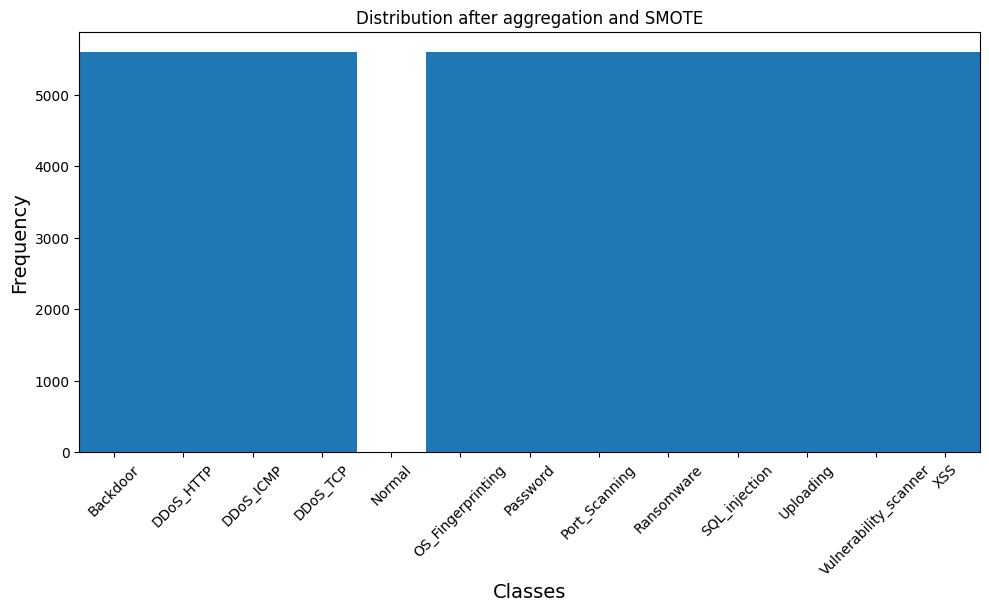

Fold 1
Epoch 1/50
420/420 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.4372 - loss: 2.4323 - val_accuracy: 0.7577 - val_loss: 1.1829
Epoch 2/50
420/420 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - accuracy: 0.6937 - loss: 1.3387 - val_accuracy: 0.7792 - val_loss: 1.0536
Epoch 3/50
420/420 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.7251 - loss: 1.2263 - val_accuracy: 0.8007 - val_loss: 1.0007
Epoch 4/50
420/420 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.7365 - loss: 1.1757 - val_accuracy: 0.7974 - val_loss: 1.0177
Epoch 5/50
420/420 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.7409 - loss: 1.1444 - val_accuracy: 0.8017 - val_loss: 0.9502
Epoch 6/50
420/420 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - accuracy: 0.7518 - loss: 1.1027 - val_accuracy: 0.7906 - val_loss: 0.9342
Epoch 7/50
420/420 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - accuracy: 0.7542 - loss: 1.0795 - val_accuracy: 0.7891 - val_loss: 0.9154
Epoch 8/50
420/420 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.7517 - loss: 1.0784 - val_accur

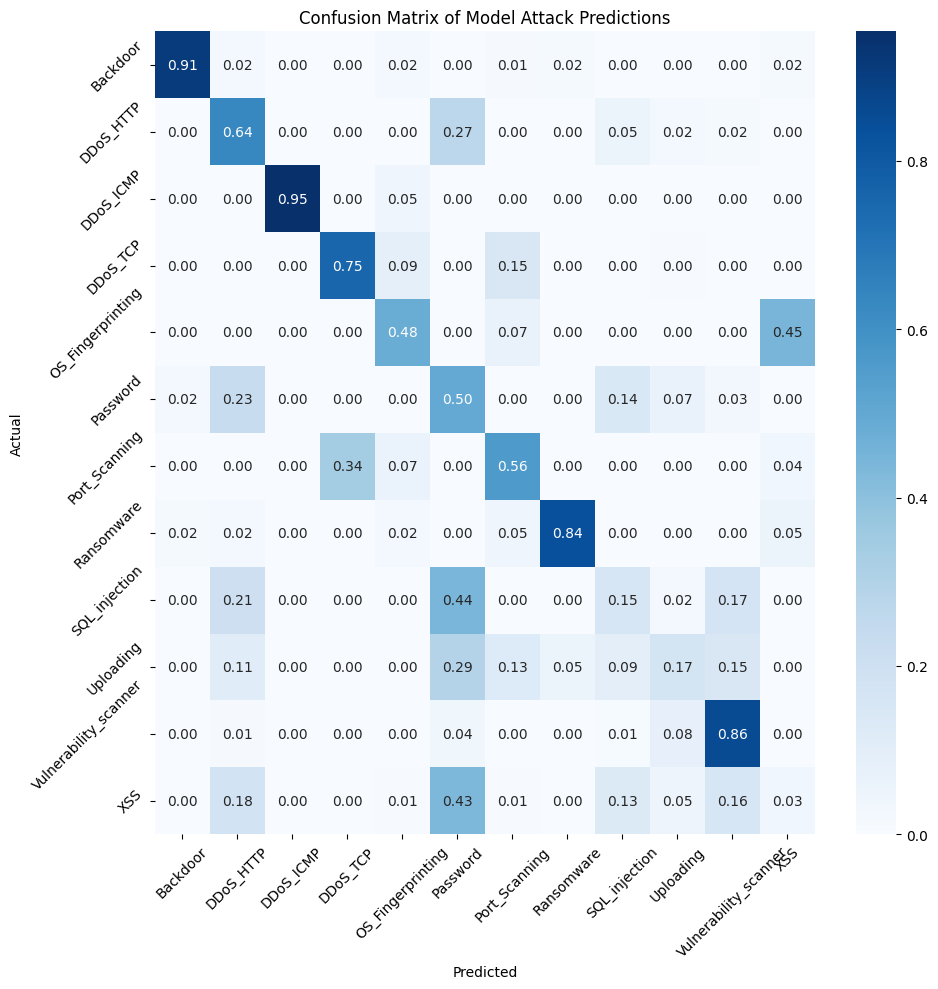

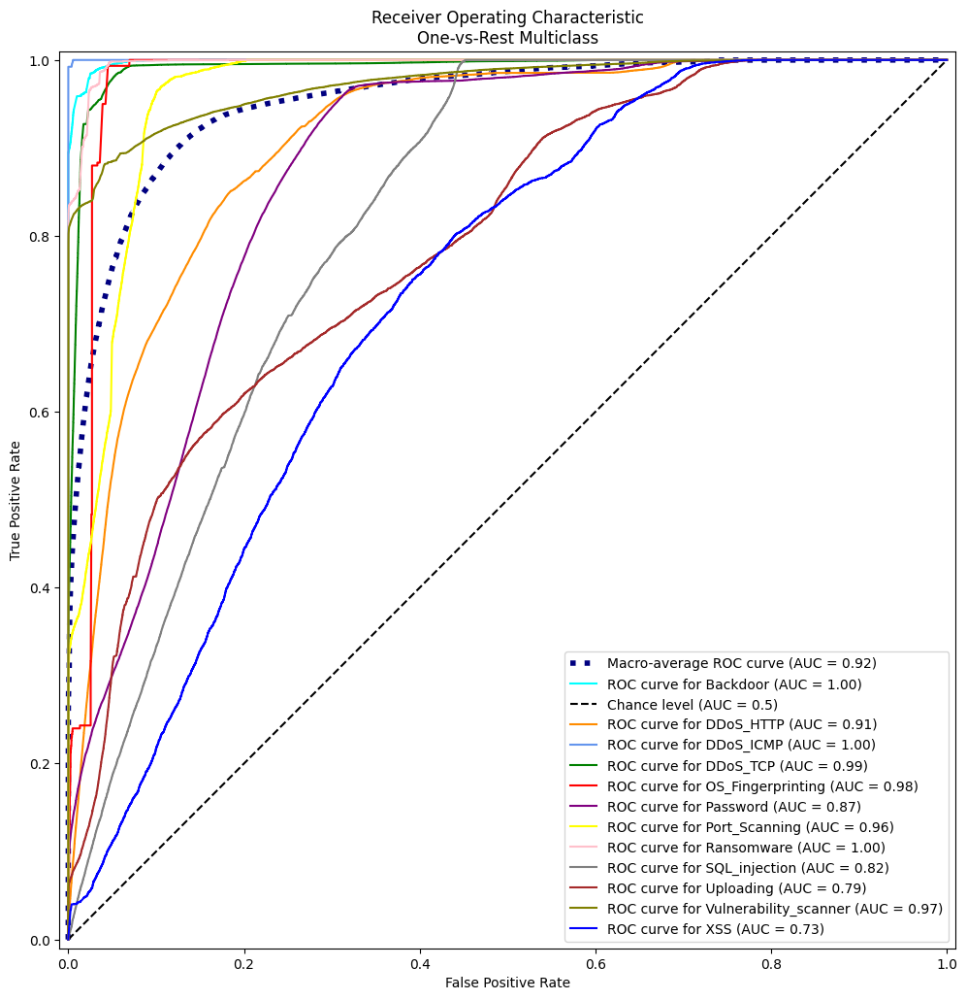

Processing interval: 3s
Number of rows after aggregation:  19504


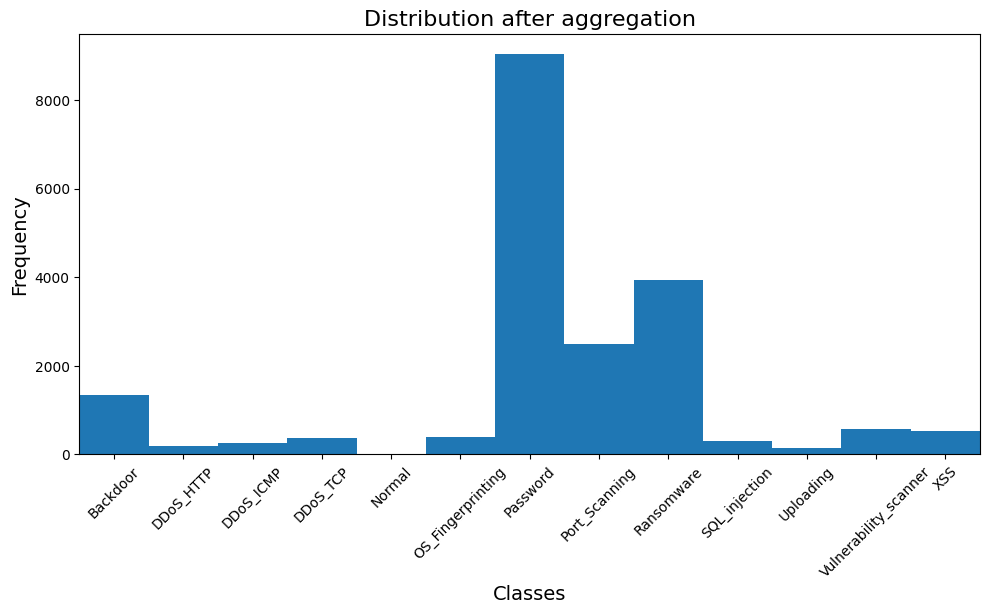

Resampled dataset size: ((108456, 95), (108456,))


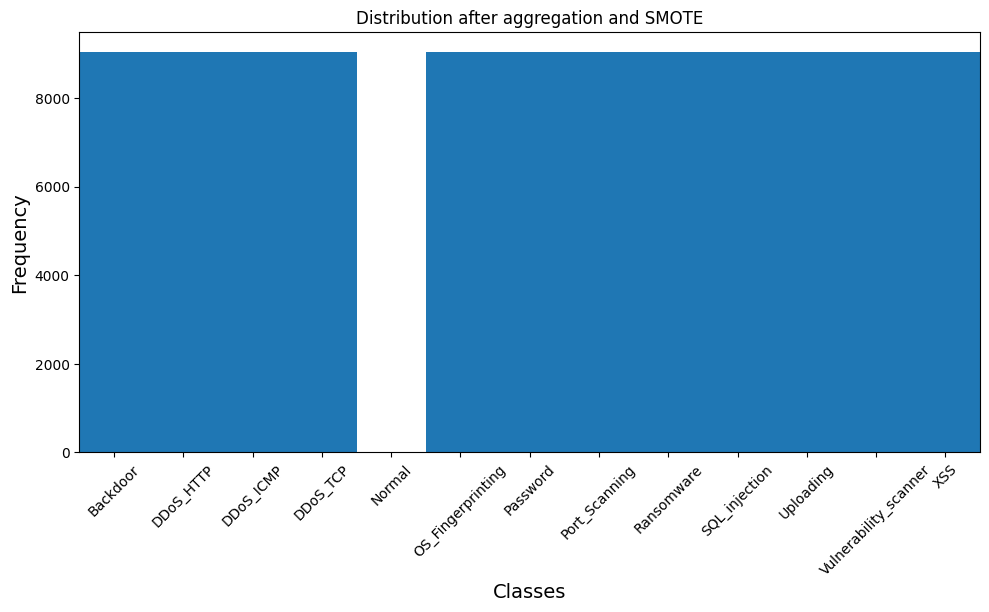

Fold 1
Epoch 1/50
678/678 ━━━━━━━━━━━━━━━━━━━━ 6s 6ms/step - accuracy: 0.5053 - loss: 2.1469 - val_accuracy: 0.7756 - val_loss: 1.0662
Epoch 2/50
678/678 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - accuracy: 0.7242 - loss: 1.2206 - val_accuracy: 0.8062 - val_loss: 0.9800
Epoch 3/50
678/678 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - accuracy: 0.7442 - loss: 1.1309 - val_accuracy: 0.8123 - val_loss: 0.9293
Epoch 4/50
678/678 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.7538 - loss: 1.0897 - val_accuracy: 0.8057 - val_loss: 0.8989
Epoch 5/50
678/678 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.7581 - loss: 1.0564 - val_accuracy: 0.8112 - val_loss: 0.8760
Epoch 6/50
678/678 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - accuracy: 0.7662 - loss: 1.0280 - val_accuracy: 0.8152 - val_loss: 0.8461
Epoch 7/50
678/678 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.7685 - loss: 1.0015 - val_accuracy: 0.8110 - val_loss: 0.8485
Epoch 8/50
678/678 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - accuracy: 0.7749 - loss: 0.9741 - val_accur

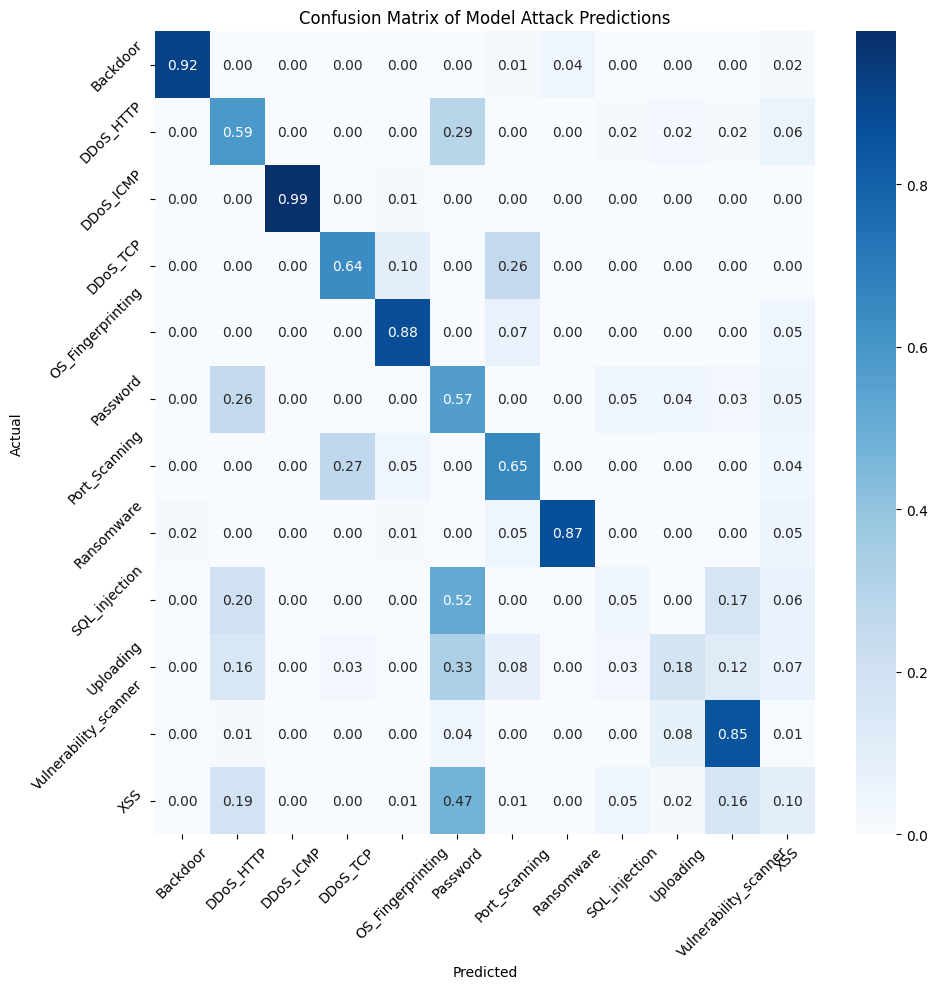

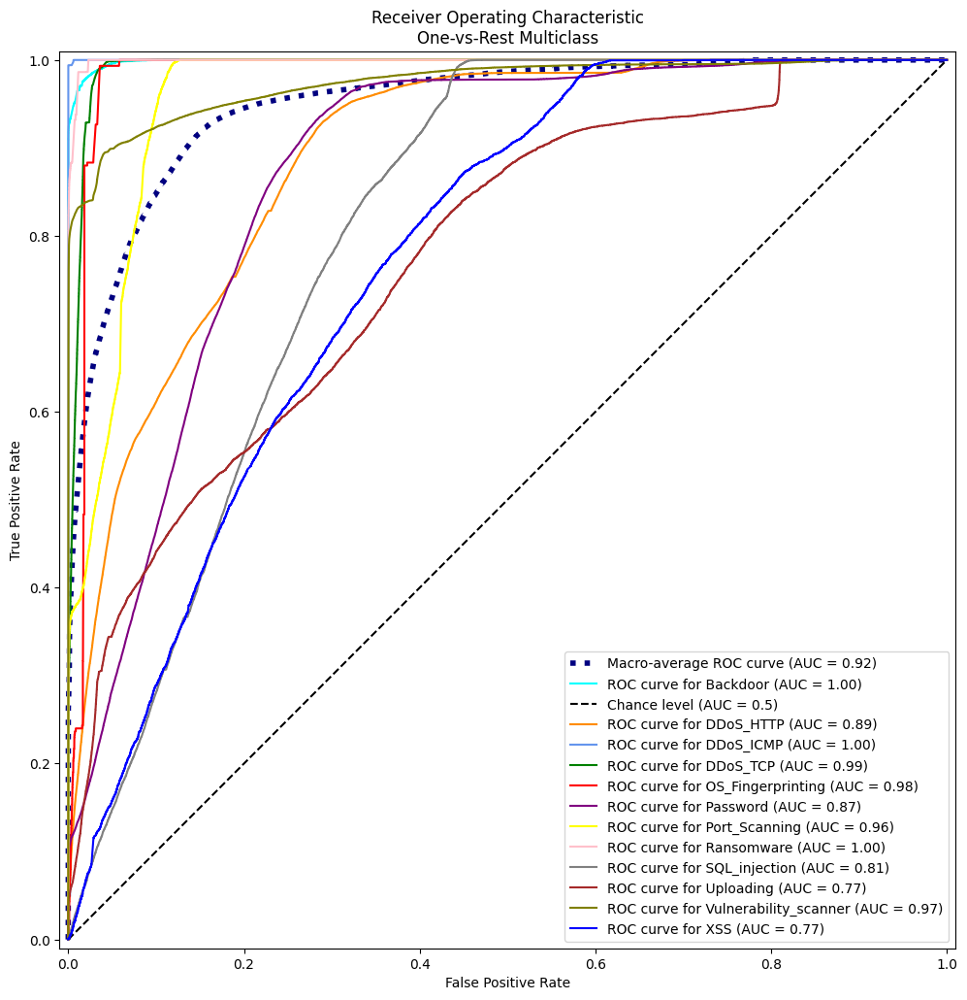

Processing interval: 2s
Number of rows after aggregation:  27337


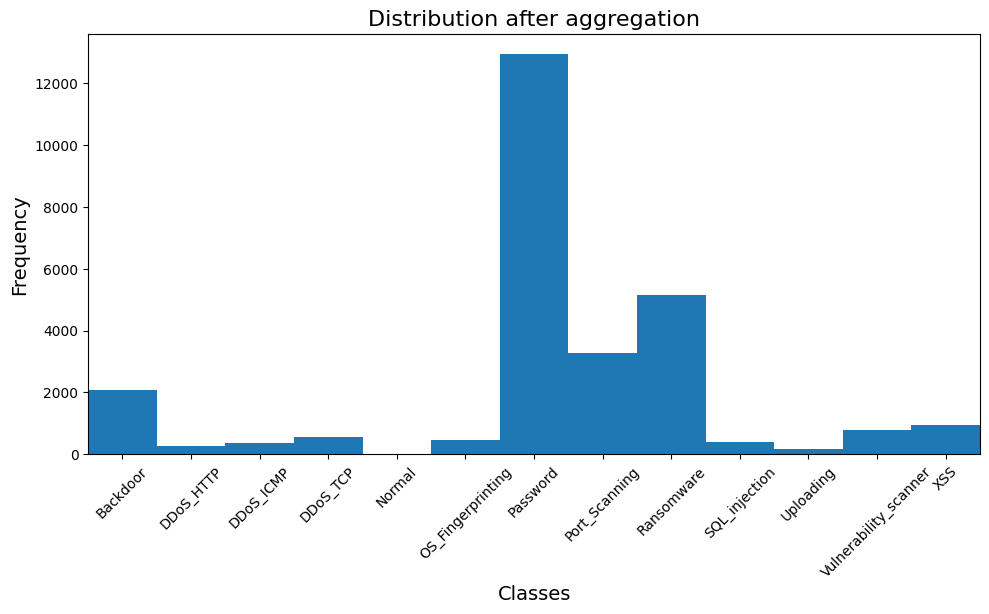

Resampled dataset size: ((155328, 95), (155328,))


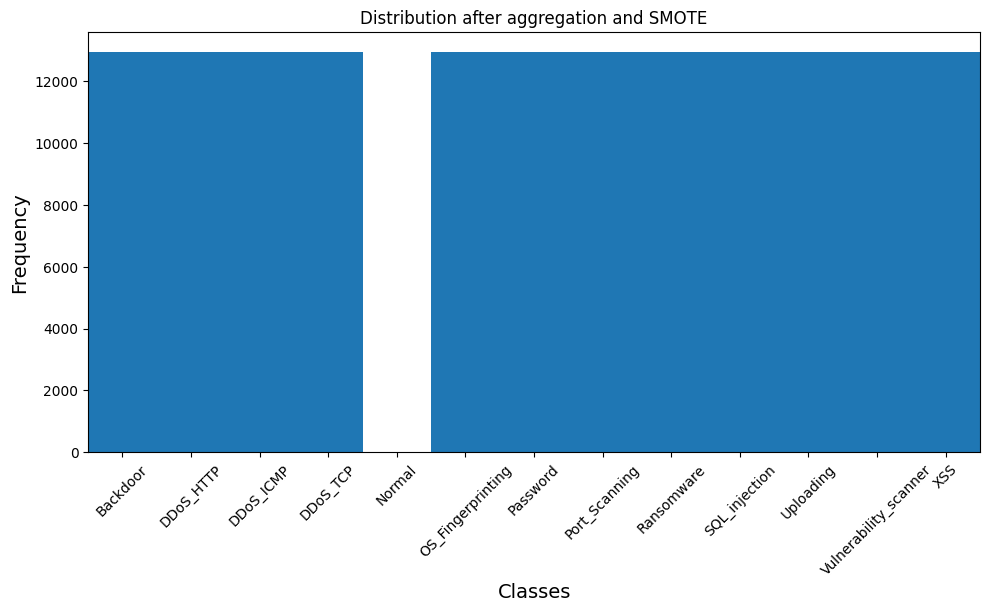

Fold 1
Epoch 1/50
971/971 ━━━━━━━━━━━━━━━━━━━━ 8s 7ms/step - accuracy: 0.5370 - loss: 1.9591 - val_accuracy: 0.7768 - val_loss: 1.0037
Epoch 2/50
971/971 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - accuracy: 0.7290 - loss: 1.1654 - val_accuracy: 0.8060 - val_loss: 0.9153
Epoch 3/50
971/971 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - accuracy: 0.7521 - loss: 1.0756 - val_accuracy: 0.8157 - val_loss: 0.8672
Epoch 4/50
971/971 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - accuracy: 0.7644 - loss: 1.0197 - val_accuracy: 0.8112 - val_loss: 0.8329
Epoch 5/50
971/971 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - accuracy: 0.7700 - loss: 0.9834 - val_accuracy: 0.8244 - val_loss: 0.8120
Epoch 6/50
971/971 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - accuracy: 0.7789 - loss: 0.9442 - val_accuracy: 0.8308 - val_loss: 0.7786
Epoch 7/50
971/971 ━━━━━━━━━━━━━━━━━━━━ 9s 6ms/step - accuracy: 0.7816 - loss: 0.9252 - val_accuracy: 0.8352 - val_loss: 0.7699
Epoch 8/50
971/971 ━━━━━━━━━━━━━━━━━━━━ 9s 9ms/step - accuracy: 0.7855 - loss: 0.9038 - val_accur

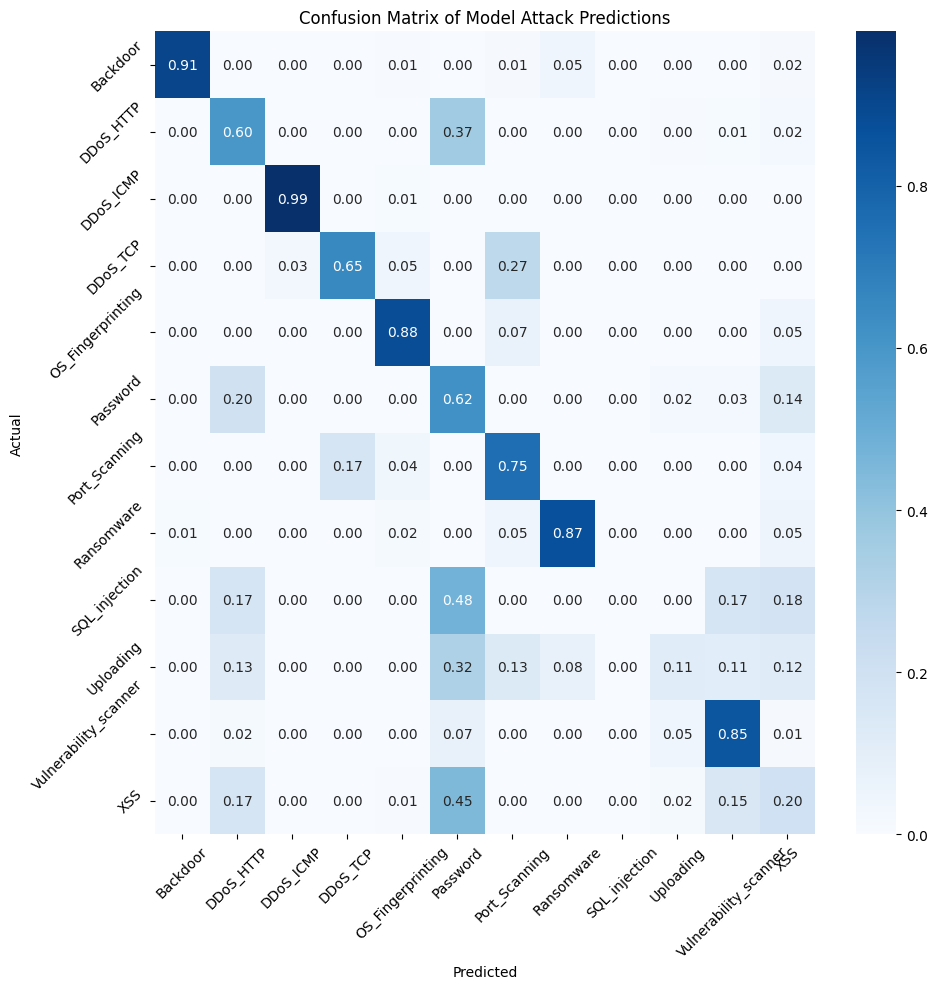

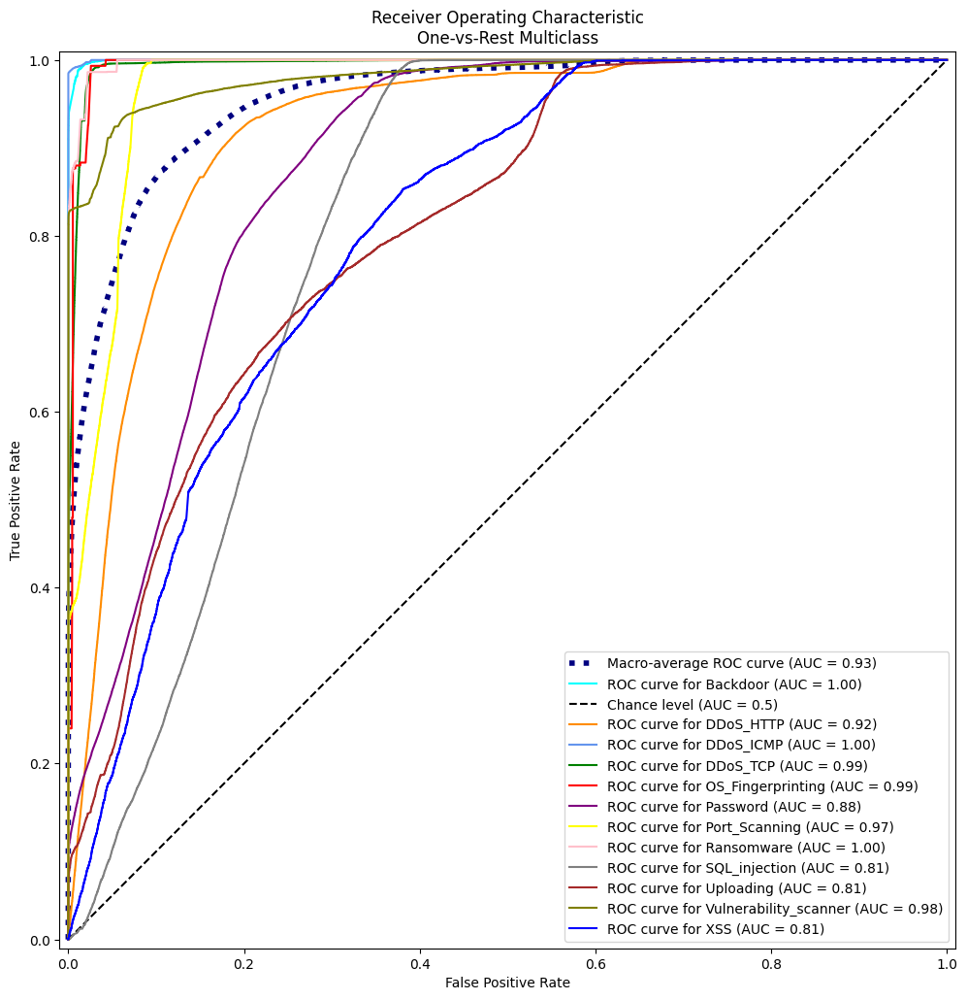

Processing interval: 1s
Number of rows after aggregation:  46426


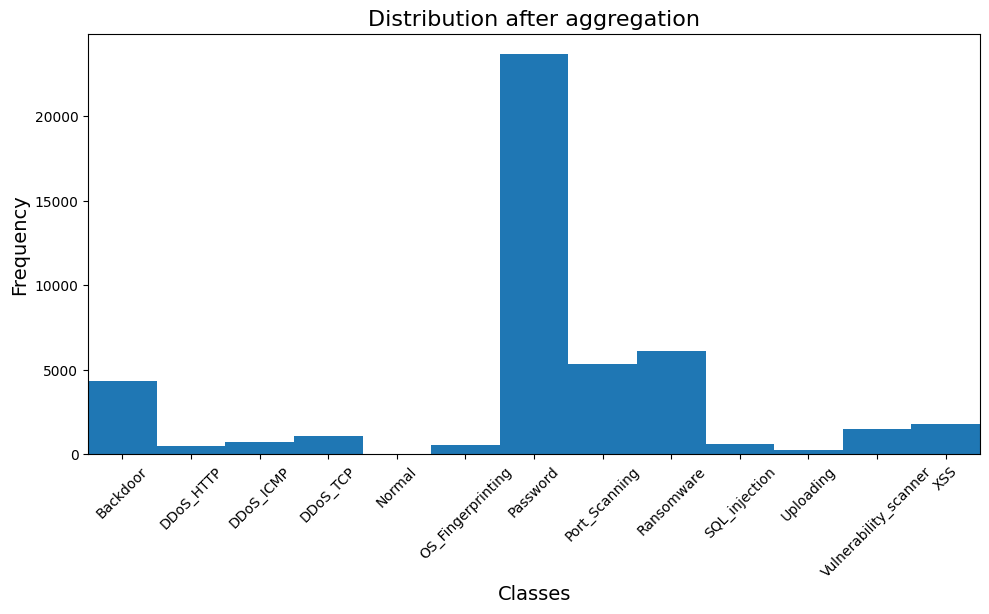

Resampled dataset size: ((284388, 95), (284388,))


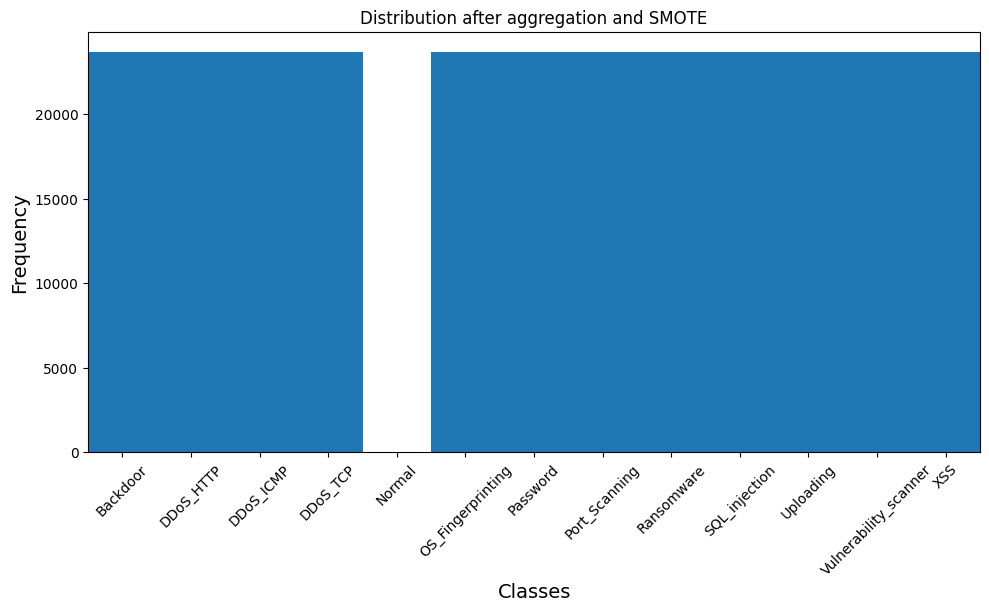

Fold 1
Epoch 1/50
1778/1778 ━━━━━━━━━━━━━━━━━━━━ 14s 7ms/step - accuracy: 0.6201 - loss: 1.6554 - val_accuracy: 0.8103 - val_loss: 0.8813
Epoch 2/50
1778/1778 ━━━━━━━━━━━━━━━━━━━━ 12s 7ms/step - accuracy: 0.7700 - loss: 1.0162 - val_accuracy: 0.8359 - val_loss: 0.7889
Epoch 3/50
1778/1778 ━━━━━━━━━━━━━━━━━━━━ 13s 7ms/step - accuracy: 0.7890 - loss: 0.9297 - val_accuracy: 0.8366 - val_loss: 0.7487
Epoch 4/50
1778/1778 ━━━━━━━━━━━━━━━━━━━━ 13s 7ms/step - accuracy: 0.7992 - loss: 0.8741 - val_accuracy: 0.8492 - val_loss: 0.7072
Epoch 5/50
1778/1778 ━━━━━━━━━━━━━━━━━━━━ 17s 5ms/step - accuracy: 0.8068 - loss: 0.8382 - val_accuracy: 0.8445 - val_loss: 0.6920
Epoch 6/50
1778/1778 ━━━━━━━━━━━━━━━━━━━━ 10s 6ms/step - accuracy: 0.8113 - loss: 0.8093 - val_accuracy: 0.8647 - val_loss: 0.6629
Epoch 7/50
1778/1778 ━━━━━━━━━━━━━━━━━━━━ 12s 7ms/step - accuracy: 0.8146 - loss: 0.7874 - val_accuracy: 0.8627 - val_loss: 0.6390
Epoch 8/50
1778/1778 ━━━━━━━━━━━━━━━━━━━━ 13s 7ms/step - accuracy: 0.8182 - 

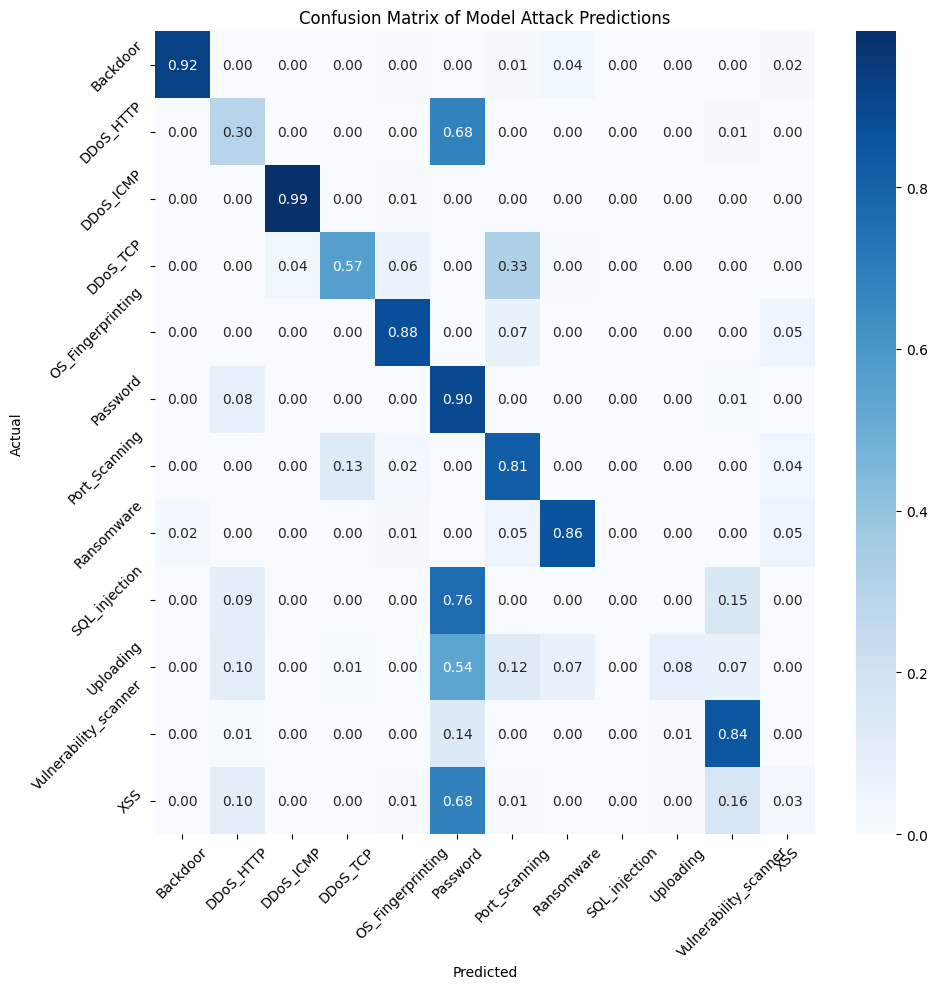

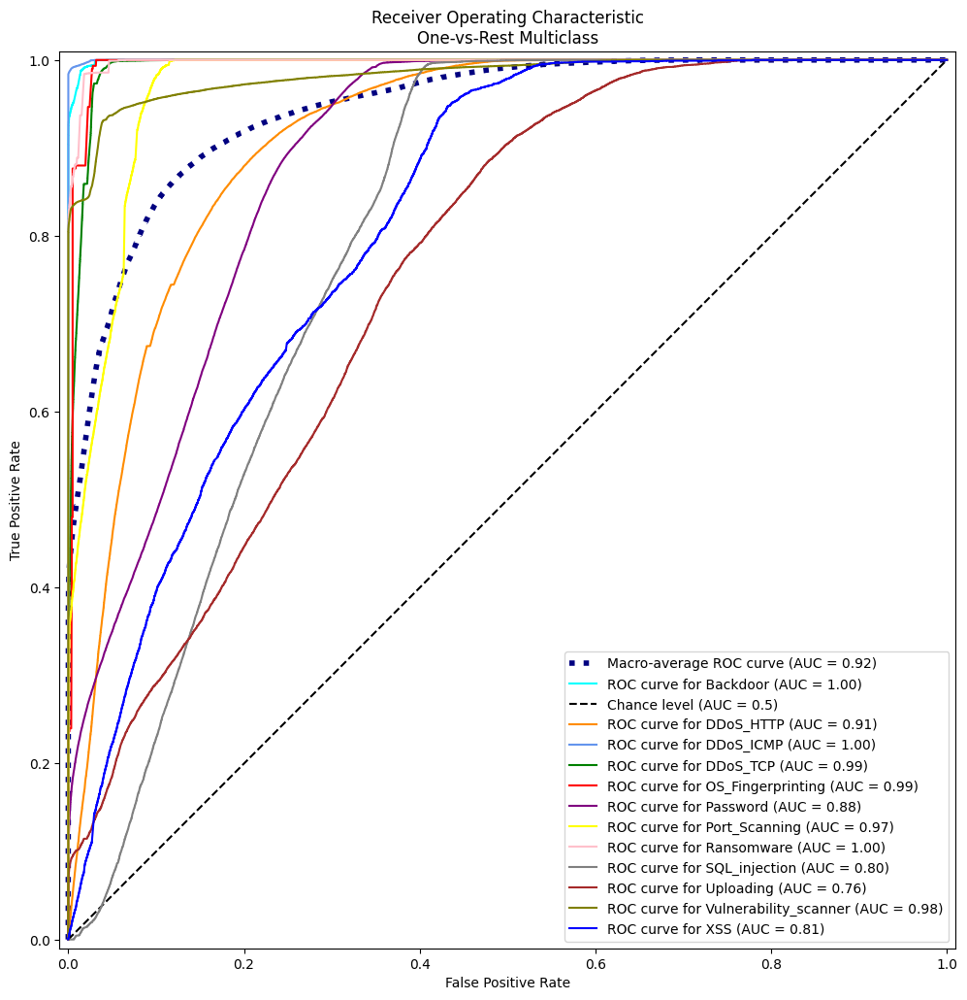

In [68]:
# Training with different time buckets
intervals = [10,5,3,2,1]  # in seconds
checkpoint_dir = './checkpoints_sm_aft/'

for interval in intervals:
    print(f"Processing interval: {interval}s")
    os.makedirs(f"{checkpoint_dir}/{interval}s/", exist_ok=True)
    
    # Load and discretize data
    X_train, y_train = discretize_by_time_buckets(combined_df.copy(), interval)

    # Check distribution after aggregation
    hist(y_train)
    plt.title('Distribution after aggregation', fontsize=16)
    plt.show()

    # handle class imbalance for training set
    smote = SMOTE(random_state=4266)
    X_train, y_train = smote.fit_resample(X_train, y_train)
    print(f"Resampled dataset size: {X_train.shape, y_train.shape}")
    
    X_cnn = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))

    # Check distribution after aggregation and SMOTE
    hist(y_train)
    plt.title('Distribution after aggregation and SMOTE')
    plt.show()
    
    # 5-Fold Cross-Validation
    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    input_shape = (X_cnn.shape[1], 1)
    all_scores = []
    
    for fold, (train_index, val_index) in enumerate(kf.split(X_cnn)):
        print(f"Fold {fold+1}")
        
        X_train_fold, X_val_fold = X_cnn[train_index], X_cnn[val_index]
        y_train_fold, y_val_fold = y_train[train_index], y_train[val_index]
        
        # Create a new model for each fold
        model = create_model(input_shape)
        
        # Model checkpointing for each fold
        checkpoint_filepath = f"{checkpoint_dir}/{interval}s/fold_{fold+1}_cnn_checkpoint.model.keras"
        checkpoint = ModelCheckpoint(
            filepath=checkpoint_filepath,
            monitor='val_accuracy',
            mode='max',
            save_best_only=True
        )
        
        # Early stopping
        early_stopping = EarlyStopping(patience=5, restore_best_weights=True)
        
        # Train the model
        model.fit(X_train_fold, y_train_fold, epochs=50, batch_size=128,
                  validation_data=(X_val_fold, y_val_fold), callbacks=[checkpoint, early_stopping])
        
        # Evaluate the model on the validation set
        score = model.evaluate(X_val_fold, y_val_fold, verbose=0)
        all_scores.append(score)

    # Print cross-validation results
    mean_score = np.mean(all_scores, axis=0)
    std_score = np.std(all_scores, axis=0)
    print(f'Interval {interval}s - Mean Validation Loss: {mean_score[0]:.4f}, Mean Validation Accuracy: {mean_score[1]:.4f}')
    print(f'Interval {interval}s - Std Dev Loss: {std_score[0]:.4f}, Std Dev Accuracy: {std_score[1]:.4f}')

    # classification report
    y_pred = model.predict(X_test_cnn)
    y_pred_classes = np.argmax(y_pred, axis=1)

    print(classification_report(y_test, y_pred_classes))

    conf_matrix(y_pred_classes)

    auc_roc_curve(y_pred)


### Test other possible resampling methods

Processing interval: 10s
SMOTE used: BorderlineSMOTE(random_state=4266)
Number of rows after aggregation:  7181


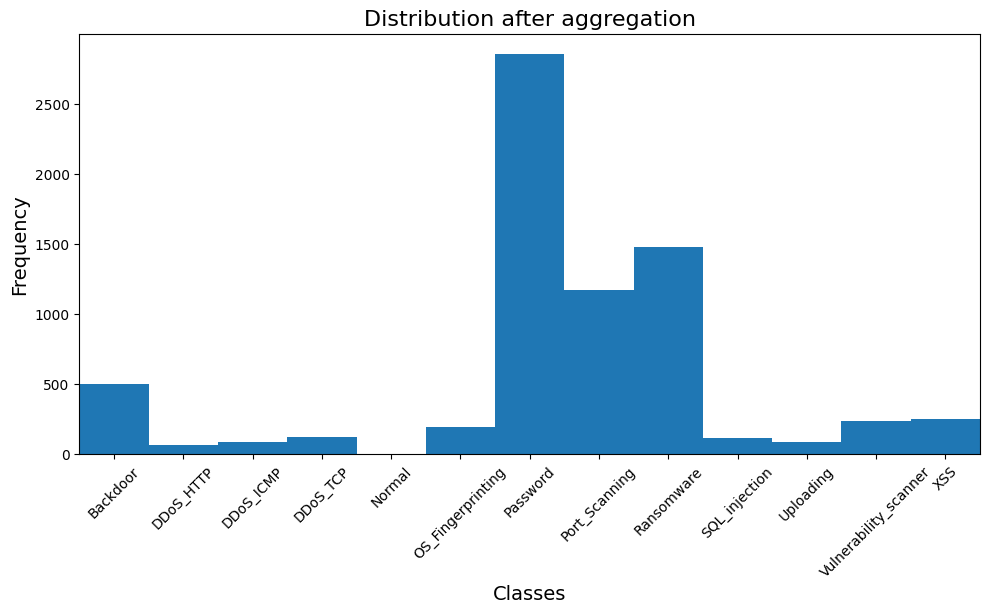

Resampled dataset size: ((34284, 95), (34284,))


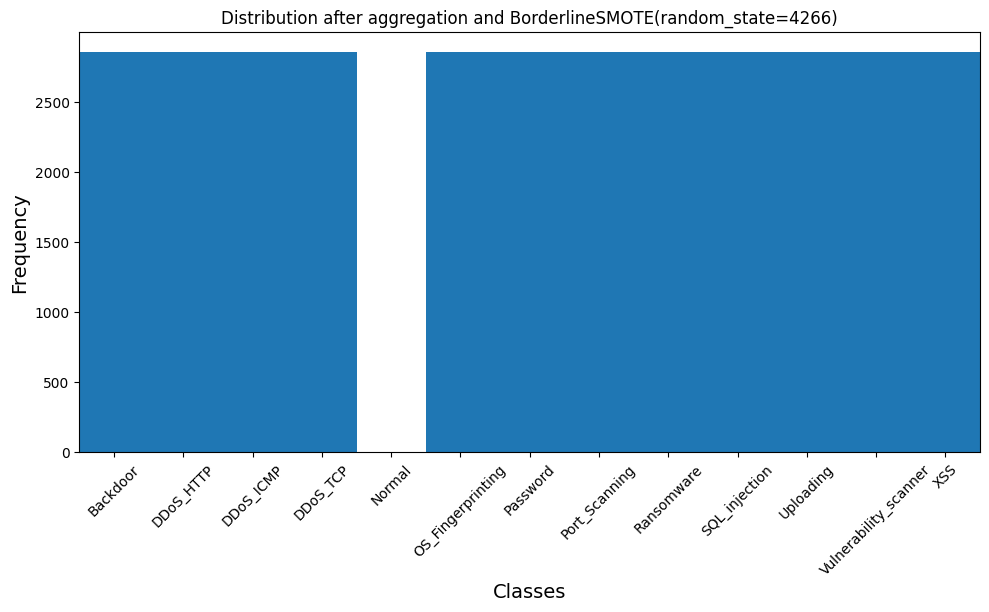

Fold 1
Epoch 1/100
215/215 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.2478 - loss: 3.0389 - val_accuracy: 0.5749 - val_loss: 1.6781
Epoch 2/100
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.4712 - loss: 1.8800 - val_accuracy: 0.6055 - val_loss: 1.4905
Epoch 3/100
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.5334 - loss: 1.6786 - val_accuracy: 0.6469 - val_loss: 1.3931
Epoch 4/100
215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.5497 - loss: 1.6018 - val_accuracy: 0.6574 - val_loss: 1.3251
Epoch 5/100
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.5684 - loss: 1.5421 - val_accuracy: 0.6541 - val_loss: 1.2954
Epoch 6/100
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.5756 - loss: 1.5211 - val_accuracy: 0.6443 - val_loss: 1.2902
Epoch 7/100
215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.5777 - loss: 1.4982 - val_accuracy: 0.6698 - val_loss: 1.2491
Epoch 8/100
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.5905 - loss: 1.4766 - v

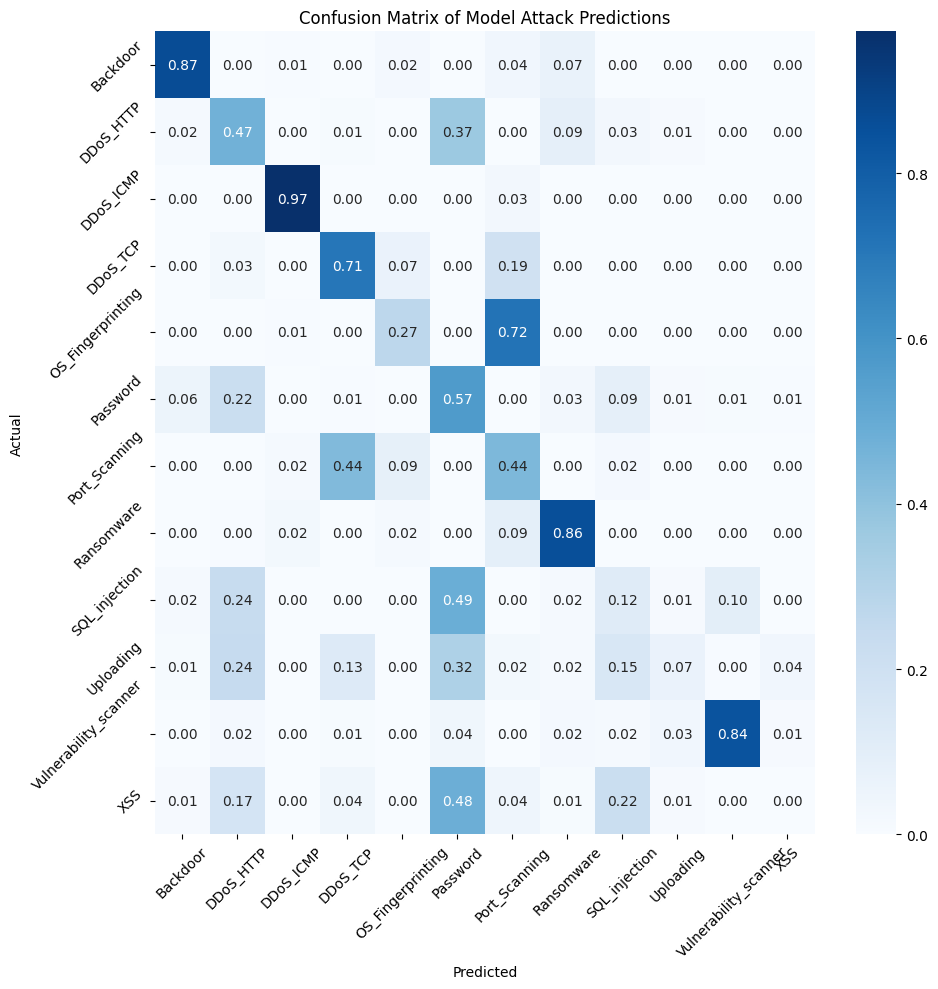

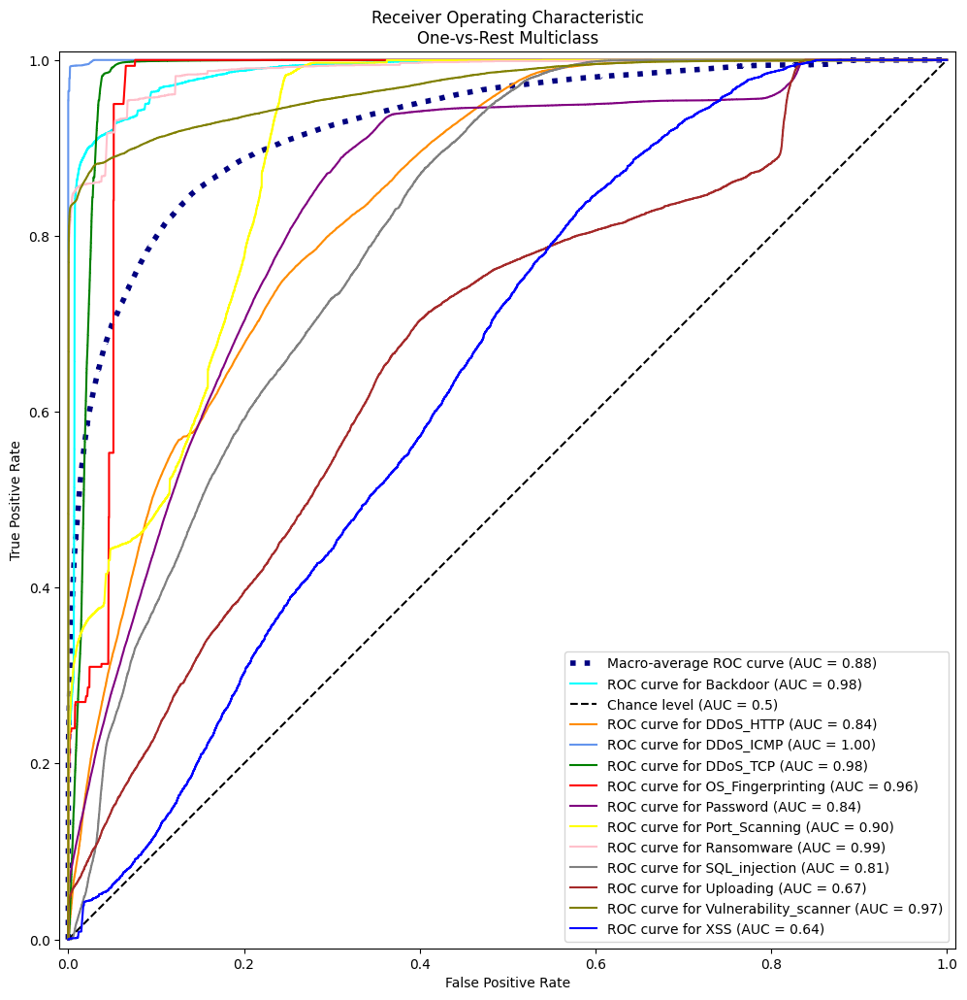

Processing interval: 10s
SMOTE used: SMOTEENN(random_state=4266)
Number of rows after aggregation:  7181


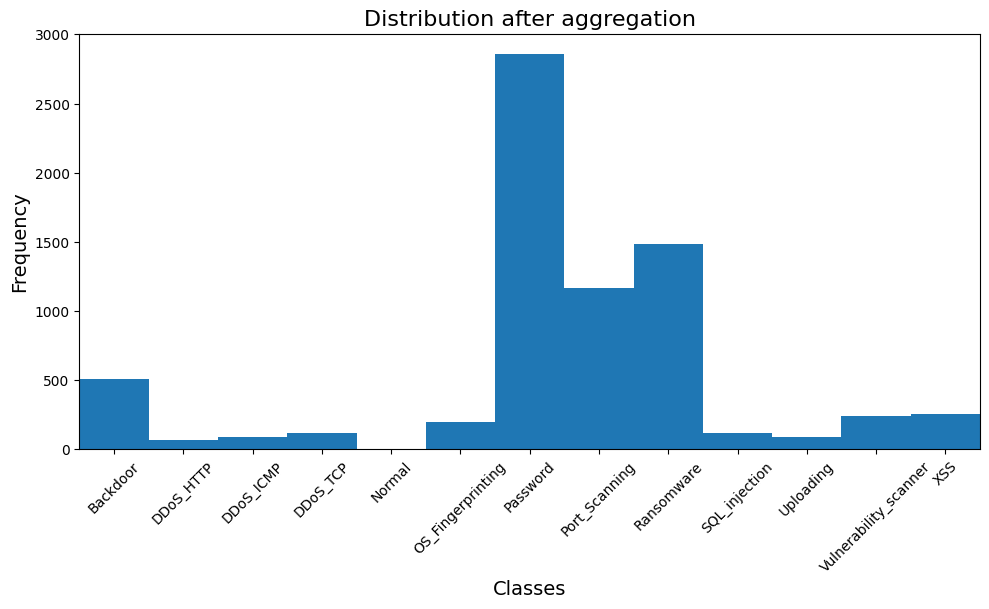

Resampled dataset size: ((25985, 95), (25985,))


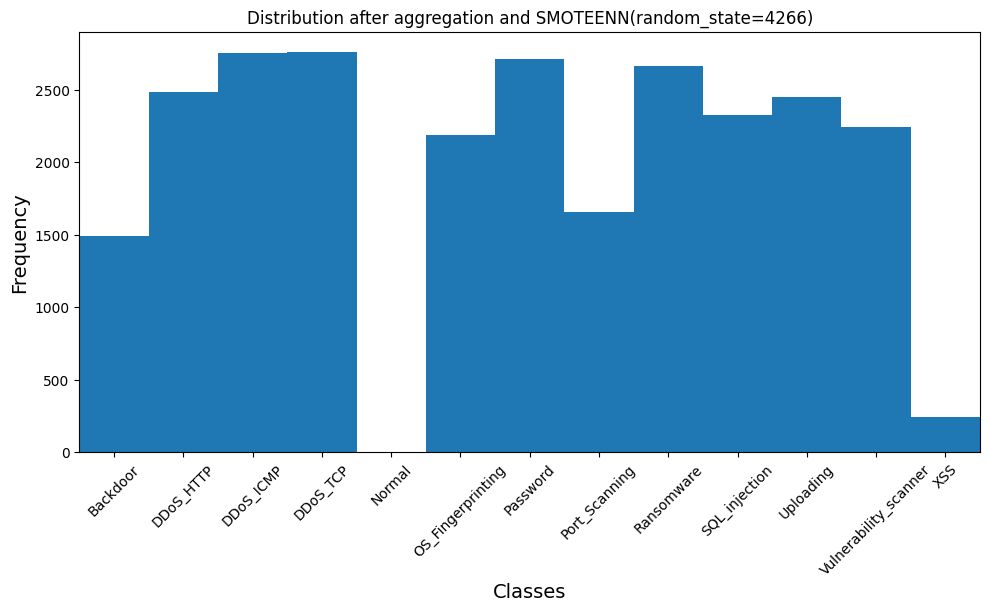

Fold 1
Epoch 1/100
163/163 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.3784 - loss: 2.8342 - val_accuracy: 0.8262 - val_loss: 1.1193
Epoch 2/100
163/163 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.7492 - loss: 1.2578 - val_accuracy: 0.8976 - val_loss: 0.8552
Epoch 3/100
163/163 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accuracy: 0.8272 - loss: 1.0125 - val_accuracy: 0.9099 - val_loss: 0.7276
Epoch 4/100
163/163 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accuracy: 0.8465 - loss: 0.9086 - val_accuracy: 0.9213 - val_loss: 0.6664
Epoch 5/100
163/163 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.8690 - loss: 0.8447 - val_accuracy: 0.9200 - val_loss: 0.6438
Epoch 6/100
163/163 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.8725 - loss: 0.8217 - val_accuracy: 0.9201 - val_loss: 0.6284
Epoch 7/100
163/163 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.8783 - loss: 0.7879 - val_accuracy: 0.9278 - val_loss: 0.5978
Epoch 8/100
163/163 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.8794 - loss: 0.7680 - 

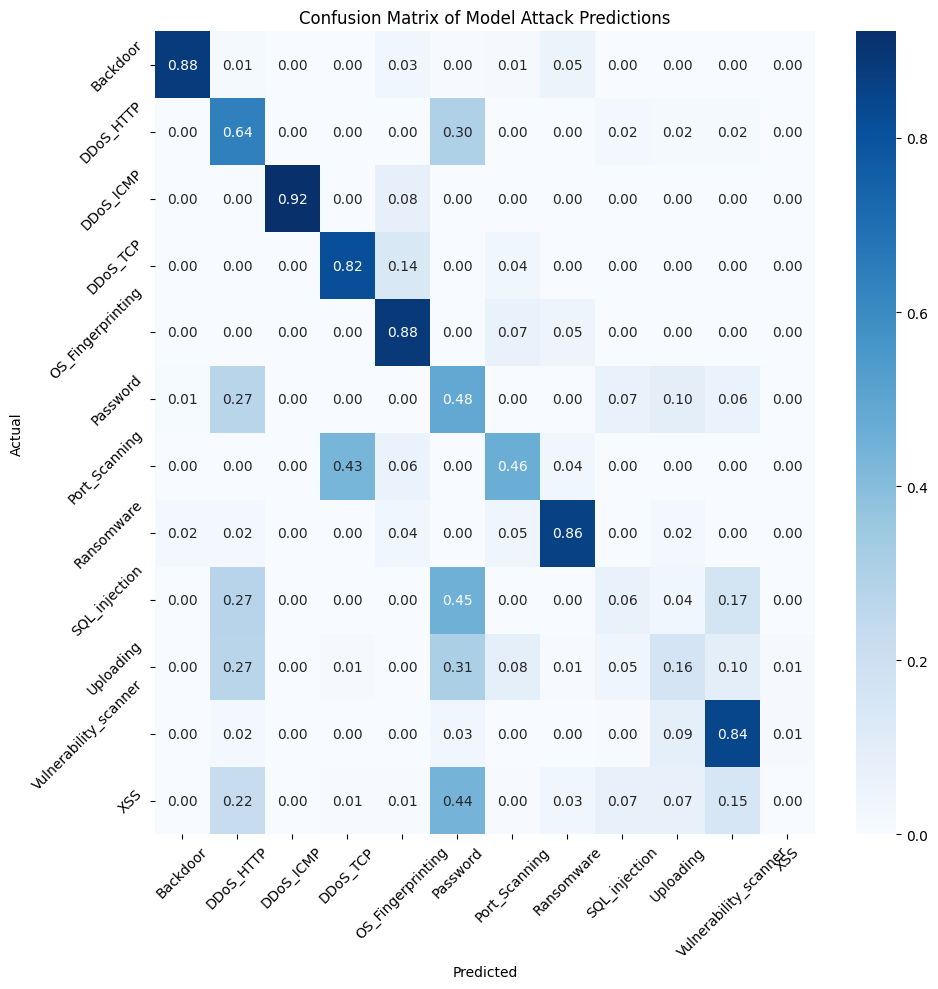

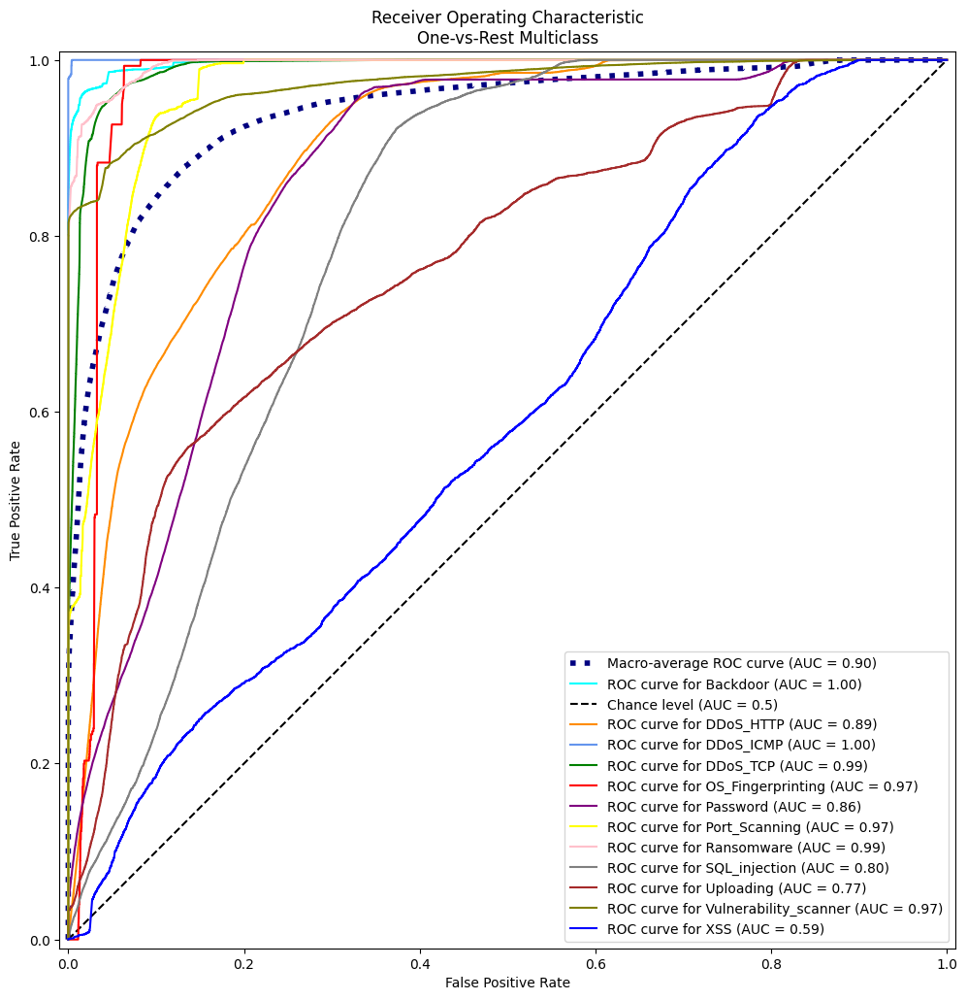

Processing interval: 10s
SMOTE used: SMOTETomek(random_state=4266)
Number of rows after aggregation:  7181


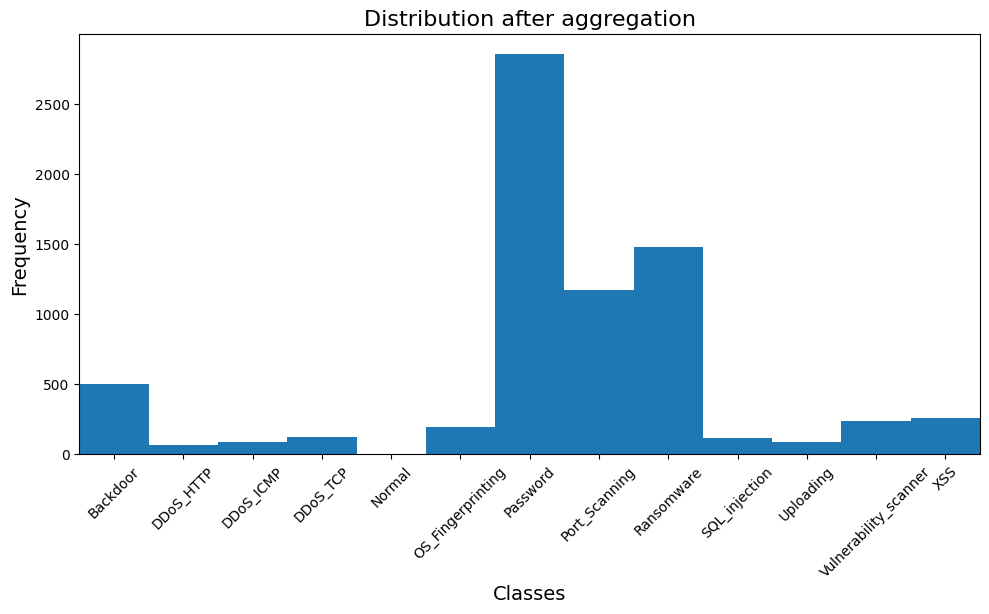

Resampled dataset size: ((33846, 95), (33846,))


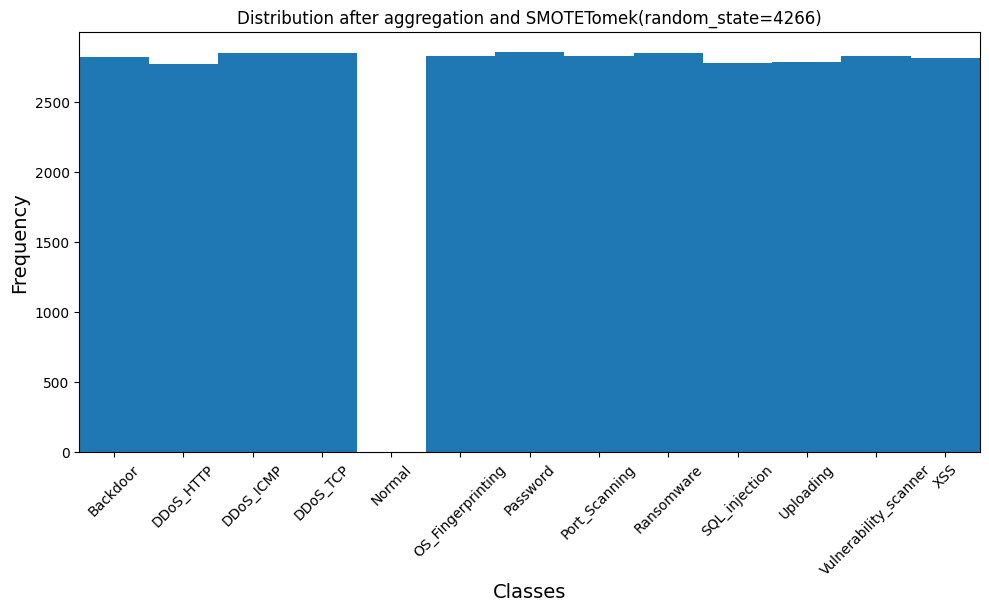

Fold 1
Epoch 1/100
212/212 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - accuracy: 0.3580 - loss: 2.8542 - val_accuracy: 0.7292 - val_loss: 1.4435
Epoch 2/100
212/212 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.6158 - loss: 1.5690 - val_accuracy: 0.7682 - val_loss: 1.2170
Epoch 3/100
212/212 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accuracy: 0.6824 - loss: 1.3846 - val_accuracy: 0.7777 - val_loss: 1.1352
Epoch 4/100
212/212 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accuracy: 0.7030 - loss: 1.3134 - val_accuracy: 0.7783 - val_loss: 1.1011
Epoch 5/100
212/212 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - accuracy: 0.7135 - loss: 1.2639 - val_accuracy: 0.7824 - val_loss: 1.0821
Epoch 6/100
212/212 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accuracy: 0.7243 - loss: 1.2297 - val_accuracy: 0.7833 - val_loss: 1.0414
Epoch 7/100
212/212 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accuracy: 0.7264 - loss: 1.2092 - val_accuracy: 0.7662 - val_loss: 1.0369
Epoch 8/100
212/212 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.7353 - loss: 1.1749 

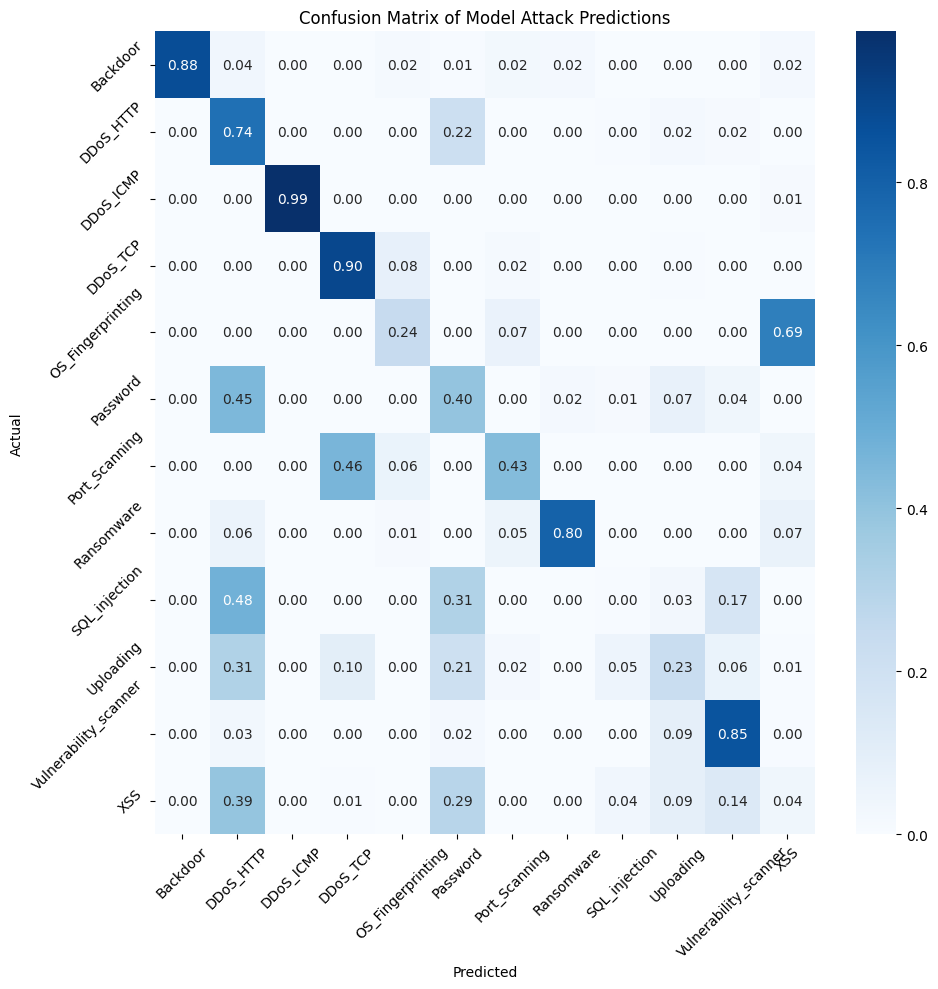

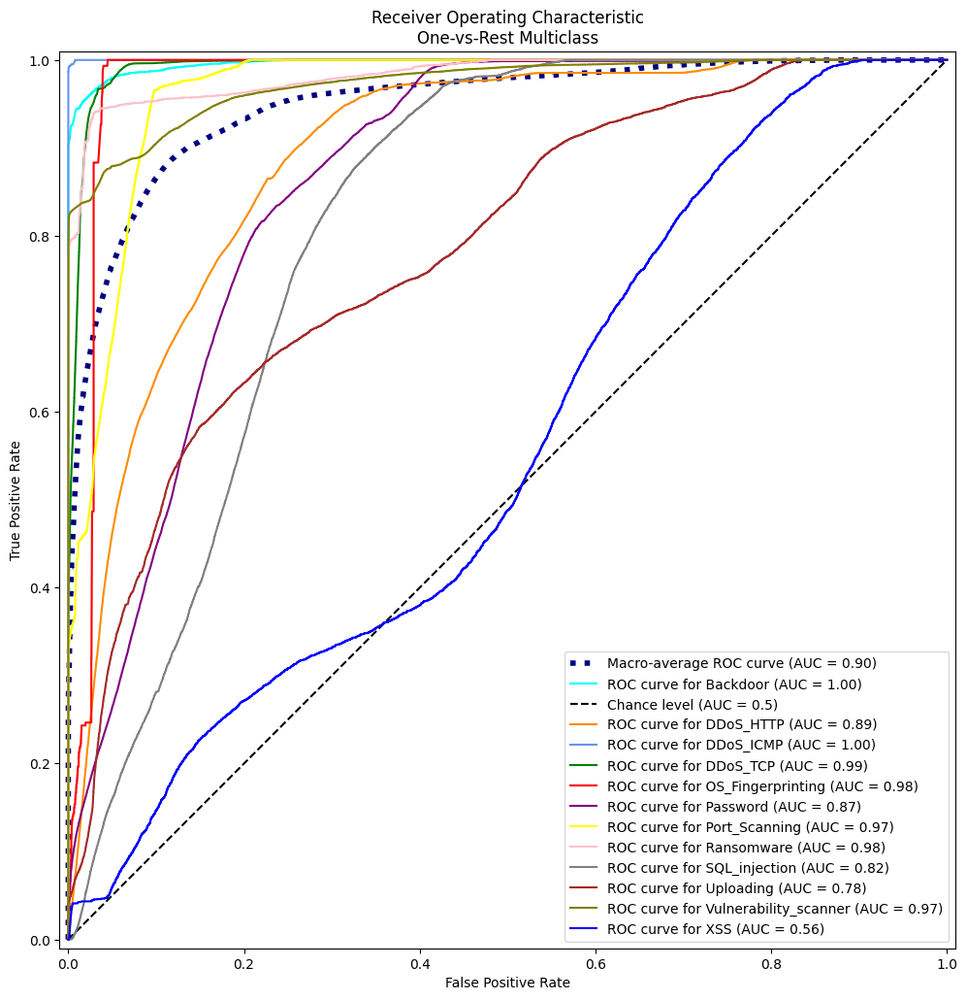

Processing interval: 5s
SMOTE used: BorderlineSMOTE(random_state=4266)
Number of rows after aggregation:  12716


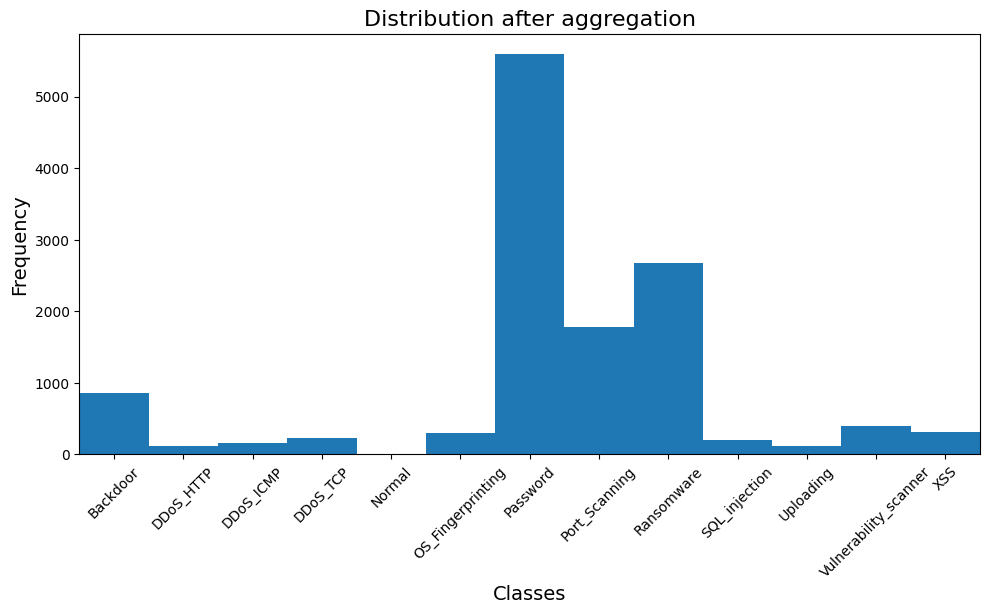

Resampled dataset size: ((67152, 95), (67152,))


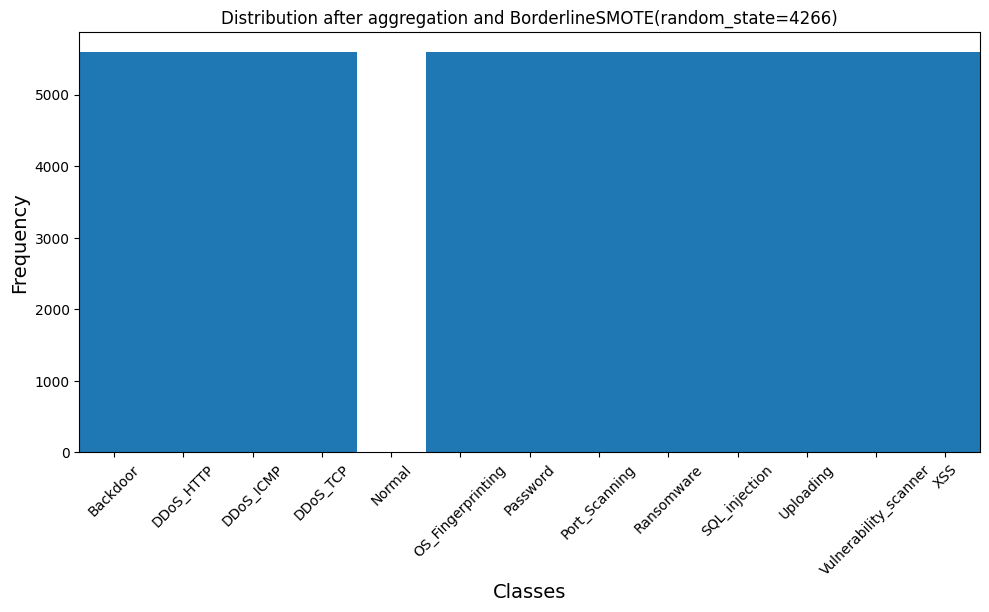

Fold 1
Epoch 1/100
420/420 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.3636 - loss: 2.5574 - val_accuracy: 0.6826 - val_loss: 1.3606
Epoch 2/100
420/420 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.6041 - loss: 1.5126 - val_accuracy: 0.7225 - val_loss: 1.1902
Epoch 3/100
420/420 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.6477 - loss: 1.3992 - val_accuracy: 0.7434 - val_loss: 1.1335
Epoch 4/100
420/420 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.6686 - loss: 1.3218 - val_accuracy: 0.7525 - val_loss: 1.1035
Epoch 5/100
420/420 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.6827 - loss: 1.2797 - val_accuracy: 0.7539 - val_loss: 1.0704
Epoch 6/100
420/420 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.6916 - loss: 1.2515 - val_accuracy: 0.7505 - val_loss: 1.0310
Epoch 7/100
420/420 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.6995 - loss: 1.2149 - val_accuracy: 0.7739 - val_loss: 1.0081
Epoch 8/100
420/420 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.7082 - loss: 1.1870 - v

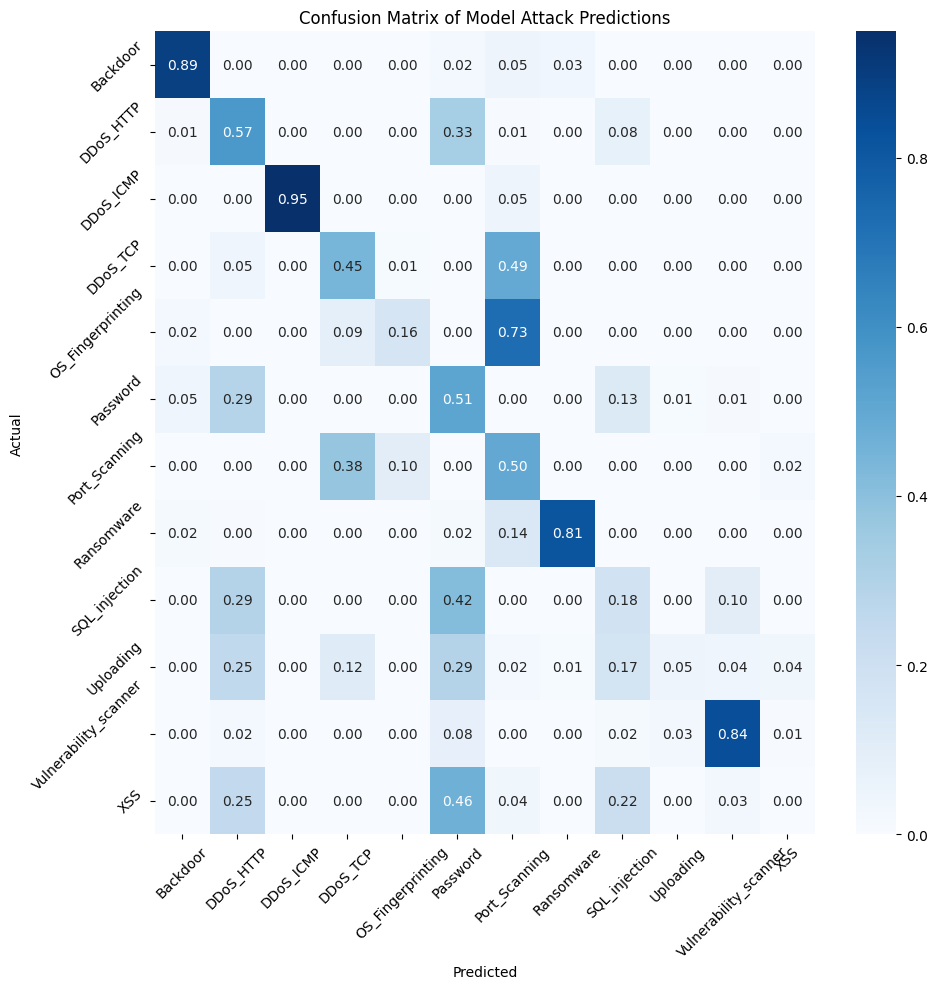

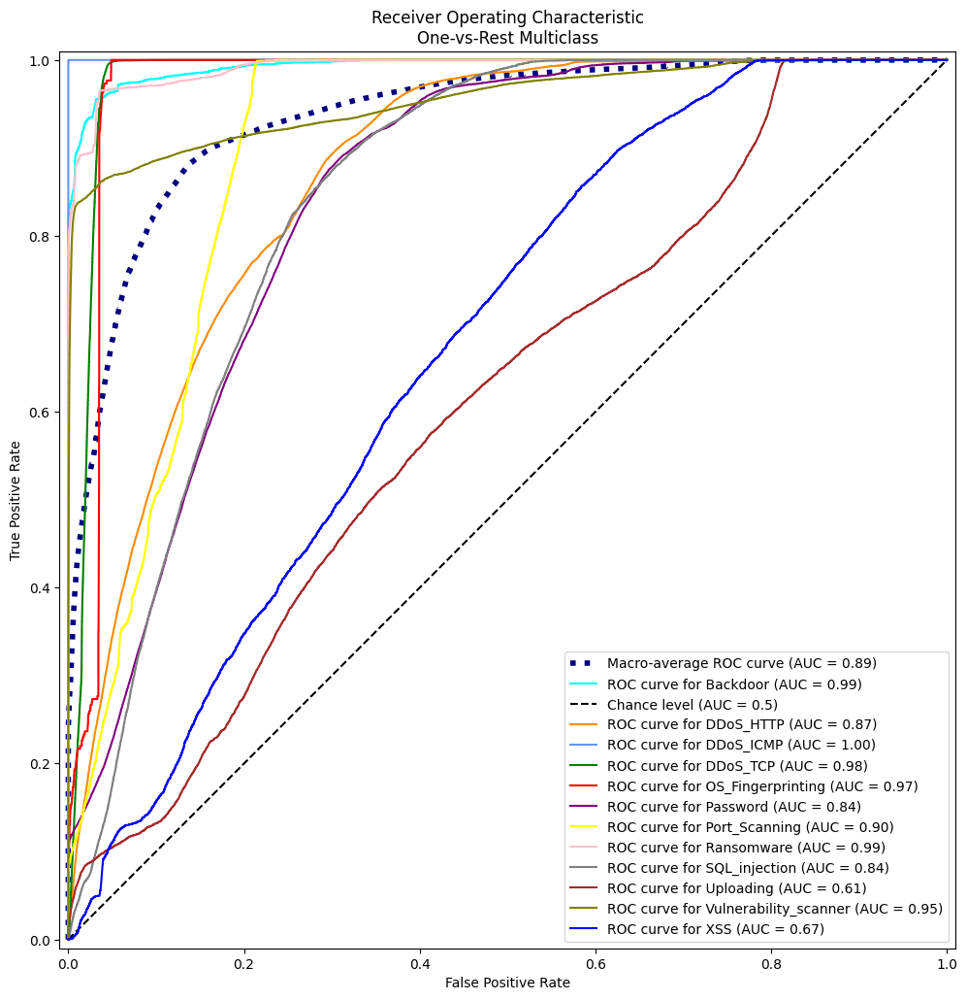

Processing interval: 5s
SMOTE used: SMOTEENN(random_state=4266)
Number of rows after aggregation:  12716


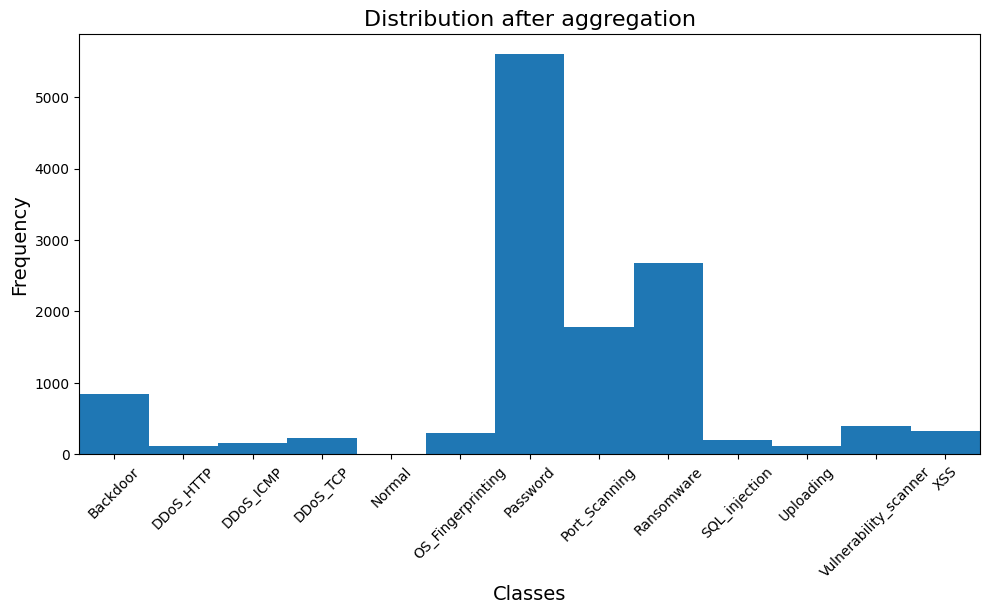

Resampled dataset size: ((53073, 95), (53073,))


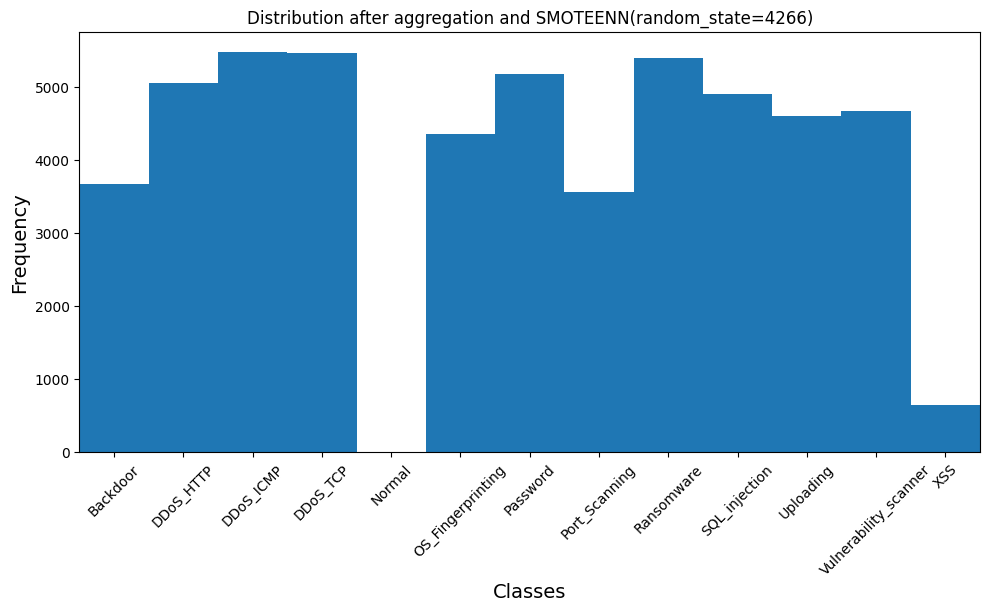

Fold 1
Epoch 1/100
332/332 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.4937 - loss: 2.3208 - val_accuracy: 0.8893 - val_loss: 0.8481
Epoch 2/100
332/332 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.8245 - loss: 0.9956 - val_accuracy: 0.9195 - val_loss: 0.7152
Epoch 3/100
332/332 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.8618 - loss: 0.8508 - val_accuracy: 0.9223 - val_loss: 0.6567
Epoch 4/100
332/332 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.8692 - loss: 0.8014 - val_accuracy: 0.9228 - val_loss: 0.6053
Epoch 5/100
332/332 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.8792 - loss: 0.7605 - val_accuracy: 0.9310 - val_loss: 0.5667
Epoch 6/100
332/332 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.8865 - loss: 0.7197 - val_accuracy: 0.9303 - val_loss: 0.5604
Epoch 7/100
332/332 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.8894 - loss: 0.7006 - val_accuracy: 0.9254 - val_loss: 0.5418
Epoch 8/100
332/332 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.8943 - loss: 0.6652 - v

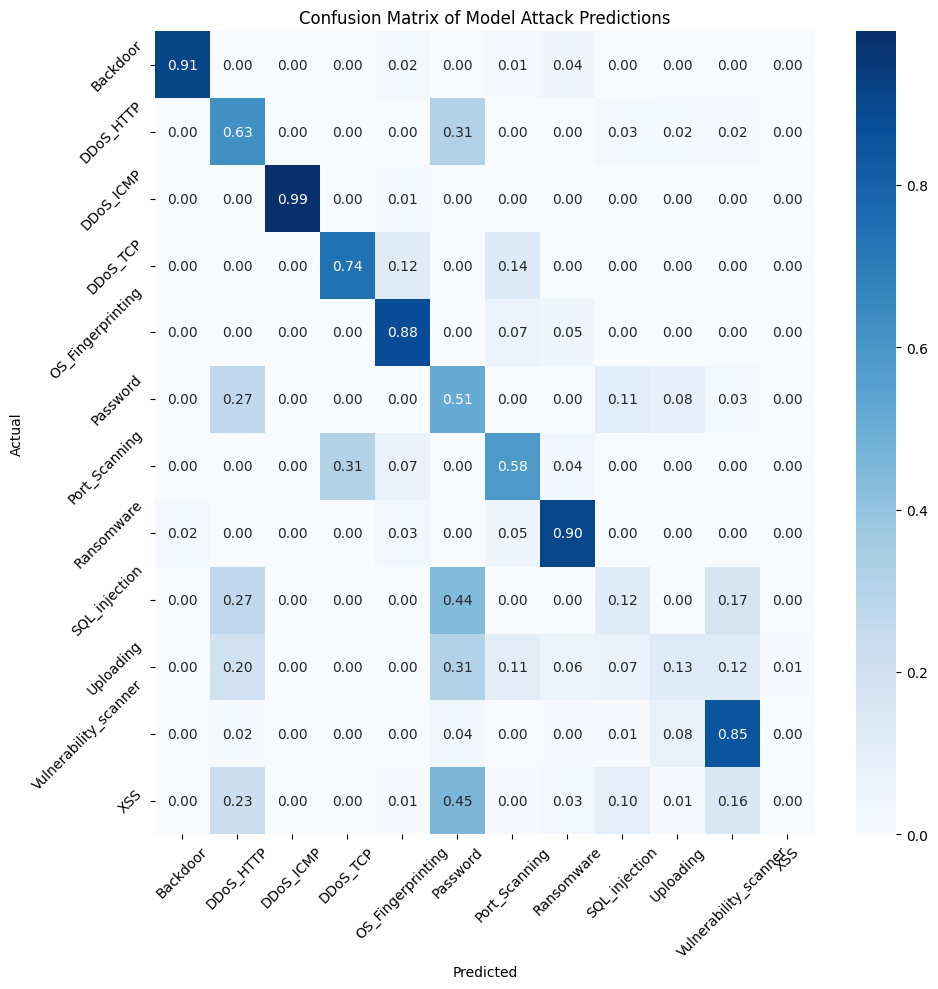

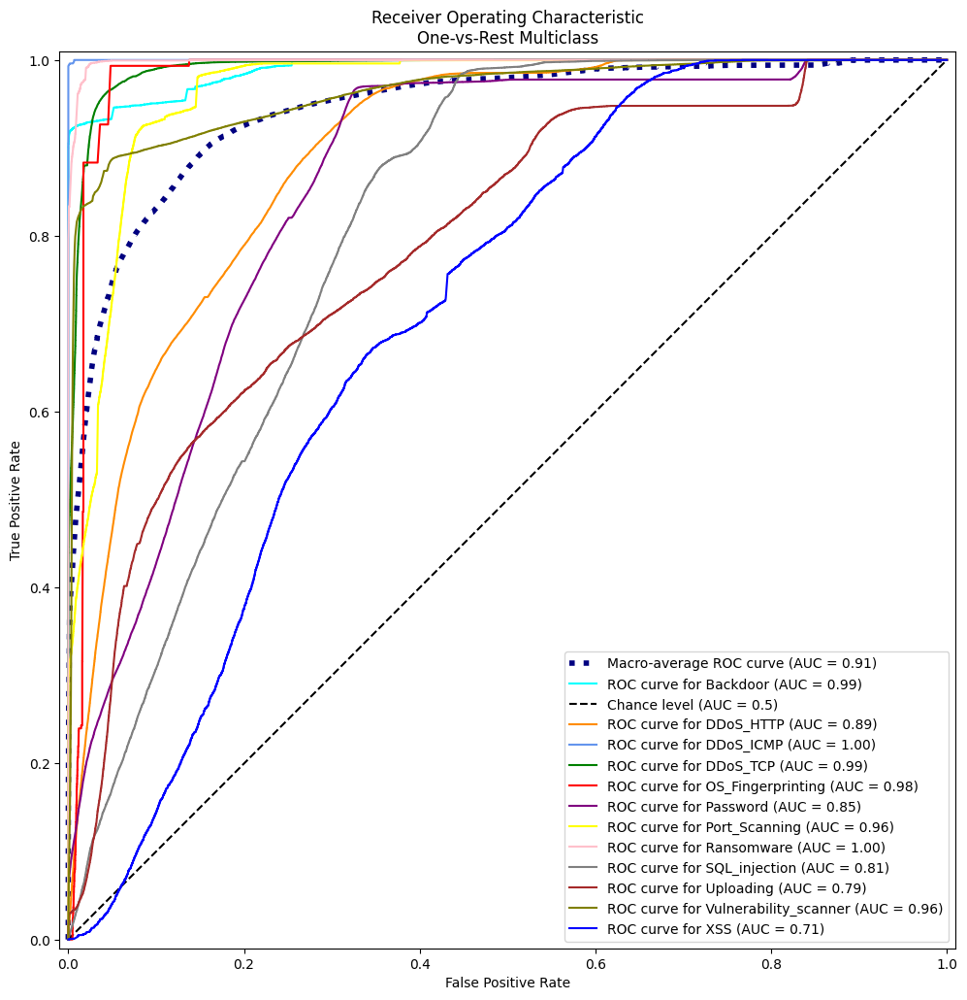

Processing interval: 5s
SMOTE used: SMOTETomek(random_state=4266)
Number of rows after aggregation:  12716


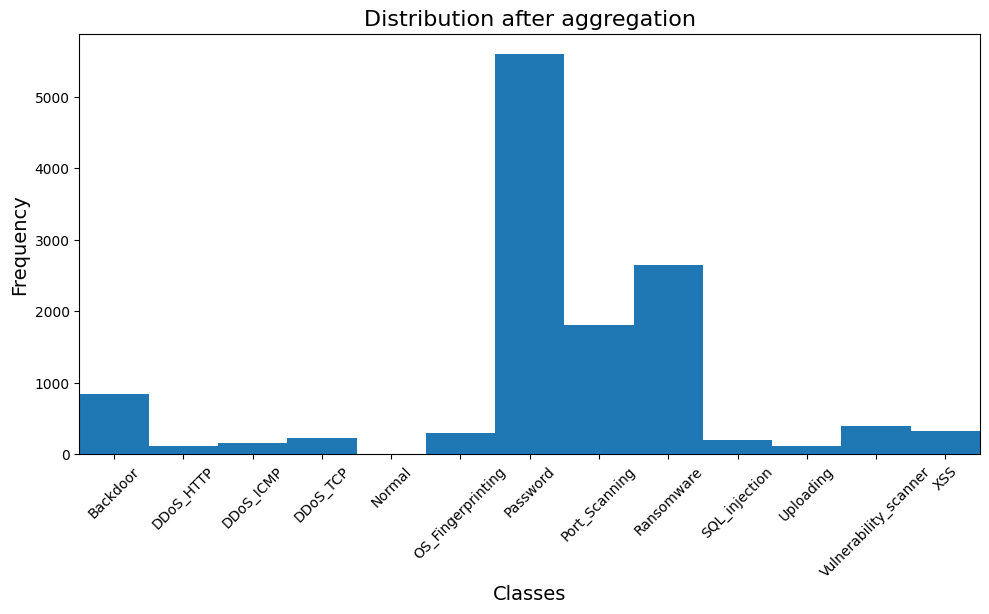

Resampled dataset size: ((66688, 95), (66688,))


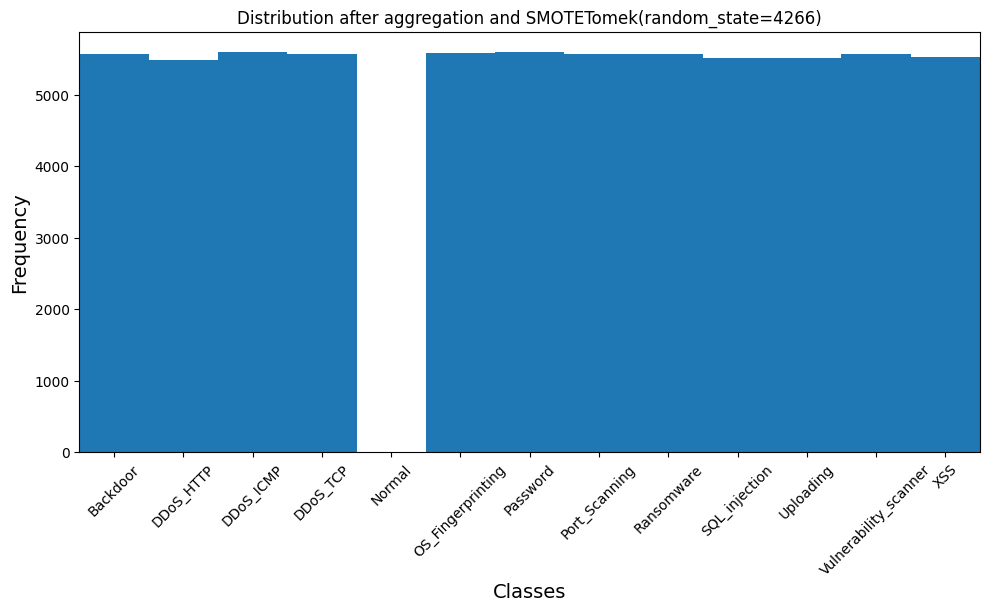

Fold 1
Epoch 1/100
417/417 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.4327 - loss: 2.4003 - val_accuracy: 0.7753 - val_loss: 1.1750
Epoch 2/100
417/417 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.7011 - loss: 1.3115 - val_accuracy: 0.7836 - val_loss: 1.0670
Epoch 3/100
417/417 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.7324 - loss: 1.1948 - val_accuracy: 0.7862 - val_loss: 1.0075
Epoch 4/100
417/417 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.7438 - loss: 1.1529 - val_accuracy: 0.7883 - val_loss: 0.9918
Epoch 5/100
417/417 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.7470 - loss: 1.1198 - val_accuracy: 0.8001 - val_loss: 0.9574
Epoch 6/100
417/417 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.7586 - loss: 1.0733 - val_accuracy: 0.8046 - val_loss: 0.9269
Epoch 7/100
417/417 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - accuracy: 0.7599 - loss: 1.0547 - val_accuracy: 0.8004 - val_loss: 0.9119
Epoch 8/100
417/417 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.7617 - loss: 1.0407 - v

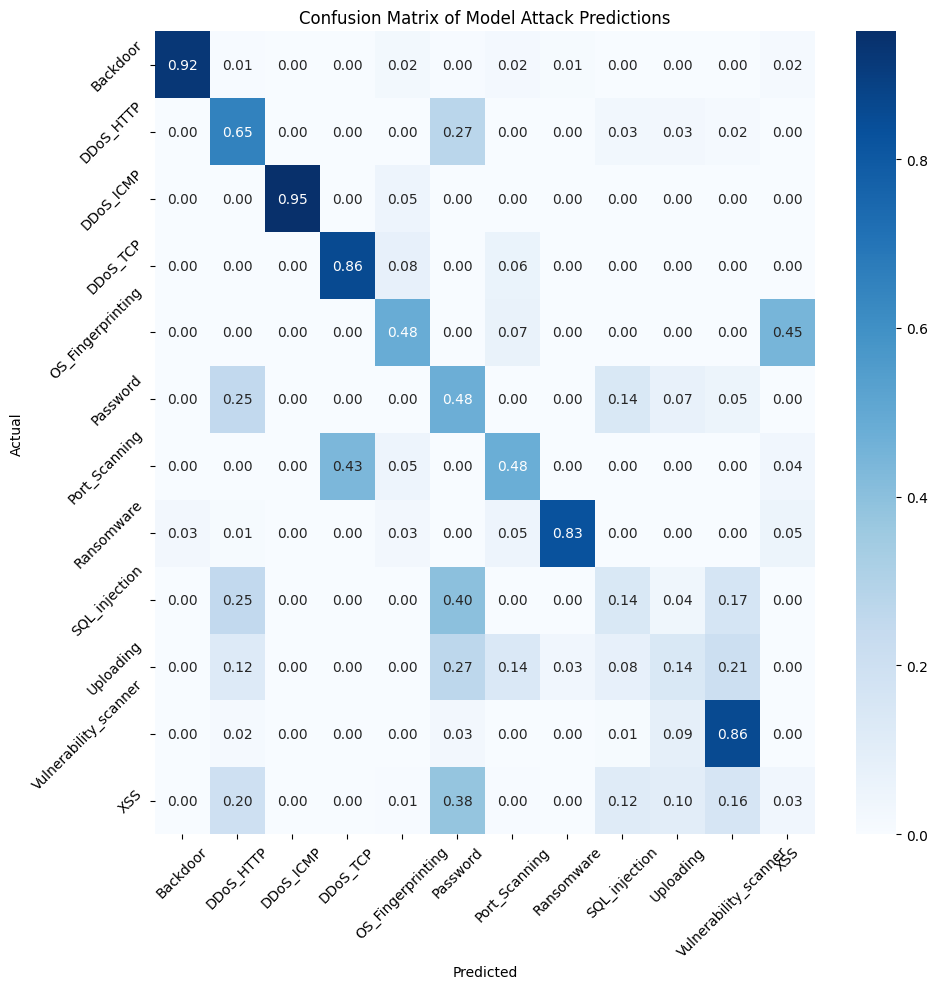

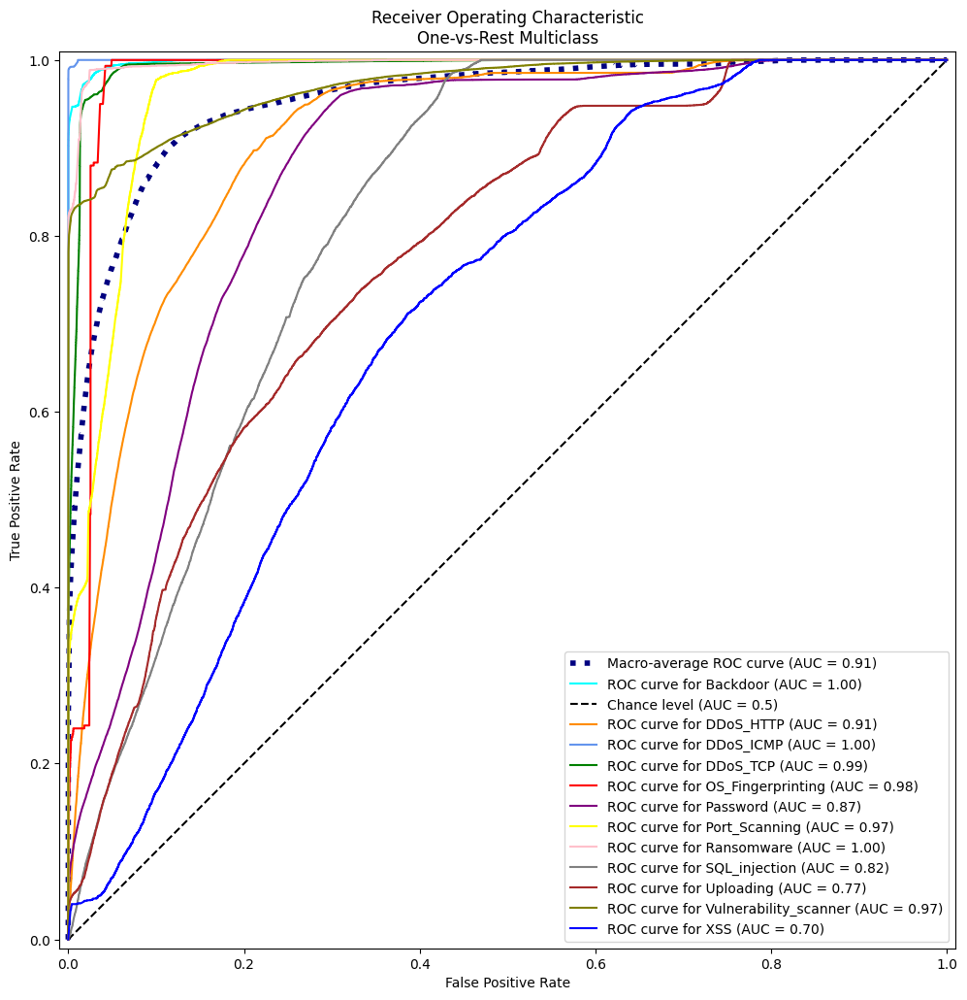

Processing interval: 3s
SMOTE used: BorderlineSMOTE(random_state=4266)
Number of rows after aggregation:  19504


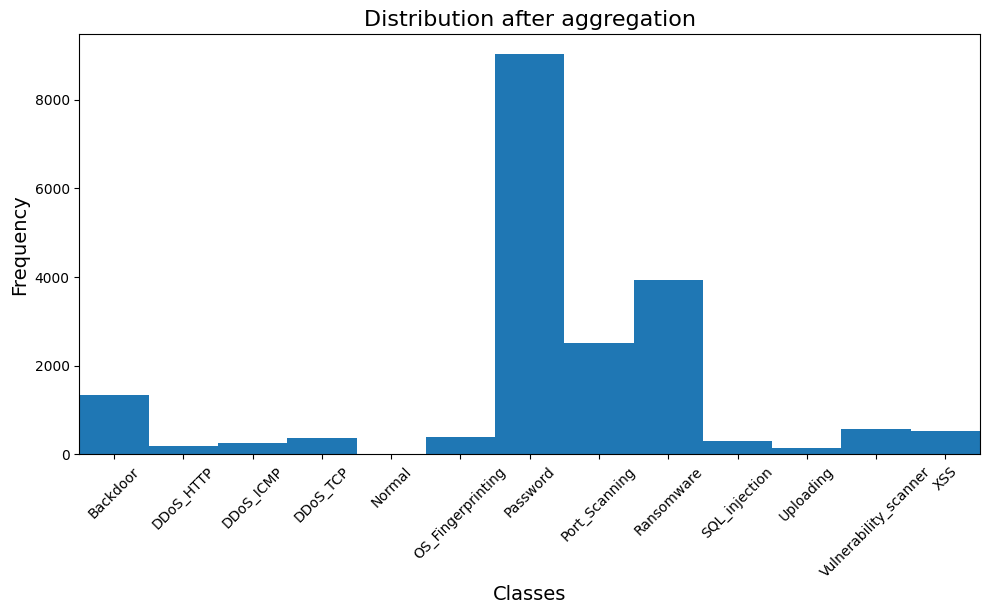

Resampled dataset size: ((108336, 95), (108336,))


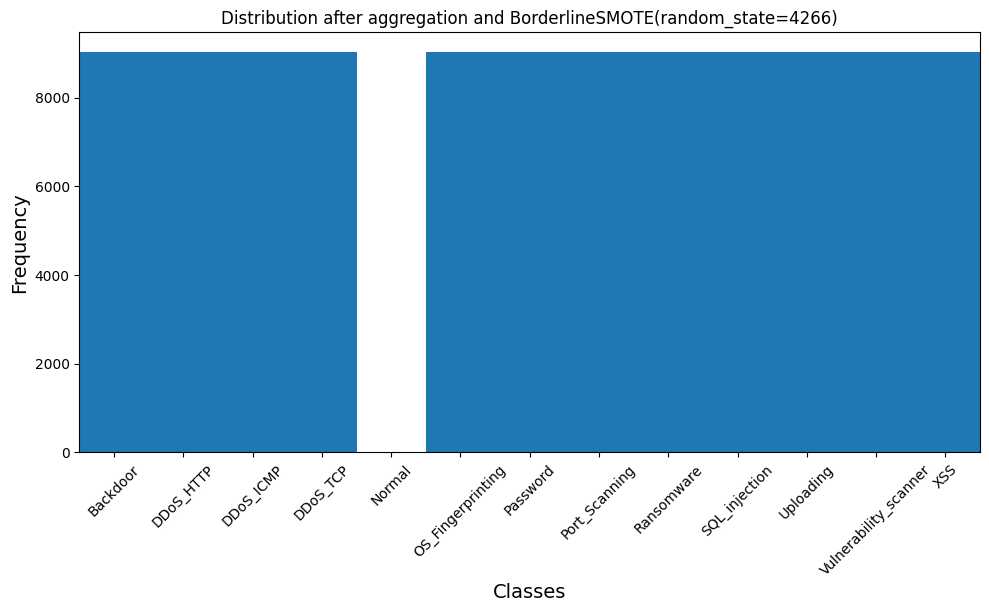

Fold 1
Epoch 1/100
678/678 ━━━━━━━━━━━━━━━━━━━━ 9s 9ms/step - accuracy: 0.4279 - loss: 2.2936 - val_accuracy: 0.7117 - val_loss: 1.2128
Epoch 2/100
678/678 ━━━━━━━━━━━━━━━━━━━━ 7s 10ms/step - accuracy: 0.6537 - loss: 1.3853 - val_accuracy: 0.7442 - val_loss: 1.0814
Epoch 3/100
678/678 ━━━━━━━━━━━━━━━━━━━━ 7s 10ms/step - accuracy: 0.6869 - loss: 1.2738 - val_accuracy: 0.7676 - val_loss: 1.0377
Epoch 4/100
678/678 ━━━━━━━━━━━━━━━━━━━━ 7s 11ms/step - accuracy: 0.6986 - loss: 1.2174 - val_accuracy: 0.7664 - val_loss: 0.9906
Epoch 5/100
678/678 ━━━━━━━━━━━━━━━━━━━━ 7s 10ms/step - accuracy: 0.7108 - loss: 1.1689 - val_accuracy: 0.7949 - val_loss: 0.9454
Epoch 6/100
678/678 ━━━━━━━━━━━━━━━━━━━━ 8s 12ms/step - accuracy: 0.7198 - loss: 1.1393 - val_accuracy: 0.8008 - val_loss: 0.9123
Epoch 7/100
678/678 ━━━━━━━━━━━━━━━━━━━━ 9s 13ms/step - accuracy: 0.7254 - loss: 1.1097 - val_accuracy: 0.7955 - val_loss: 0.9000
Epoch 8/100
678/678 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step - accuracy: 0.7362 - loss: 1.0

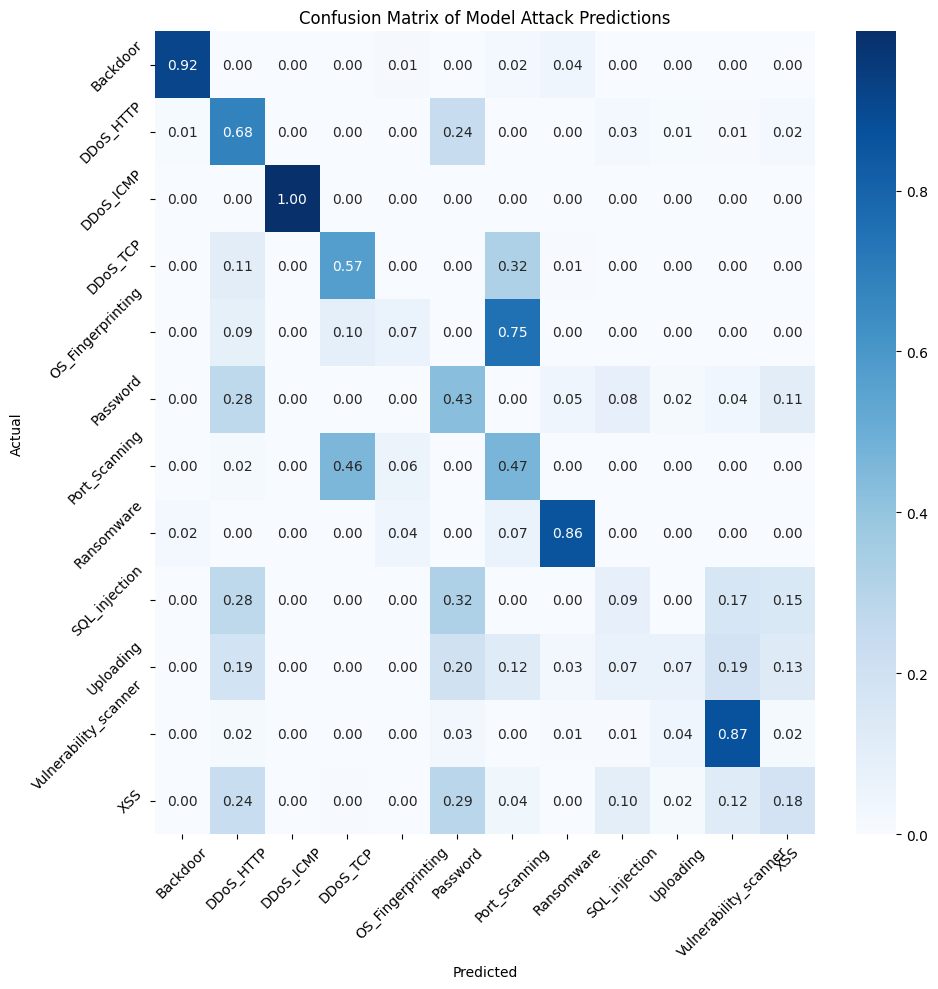

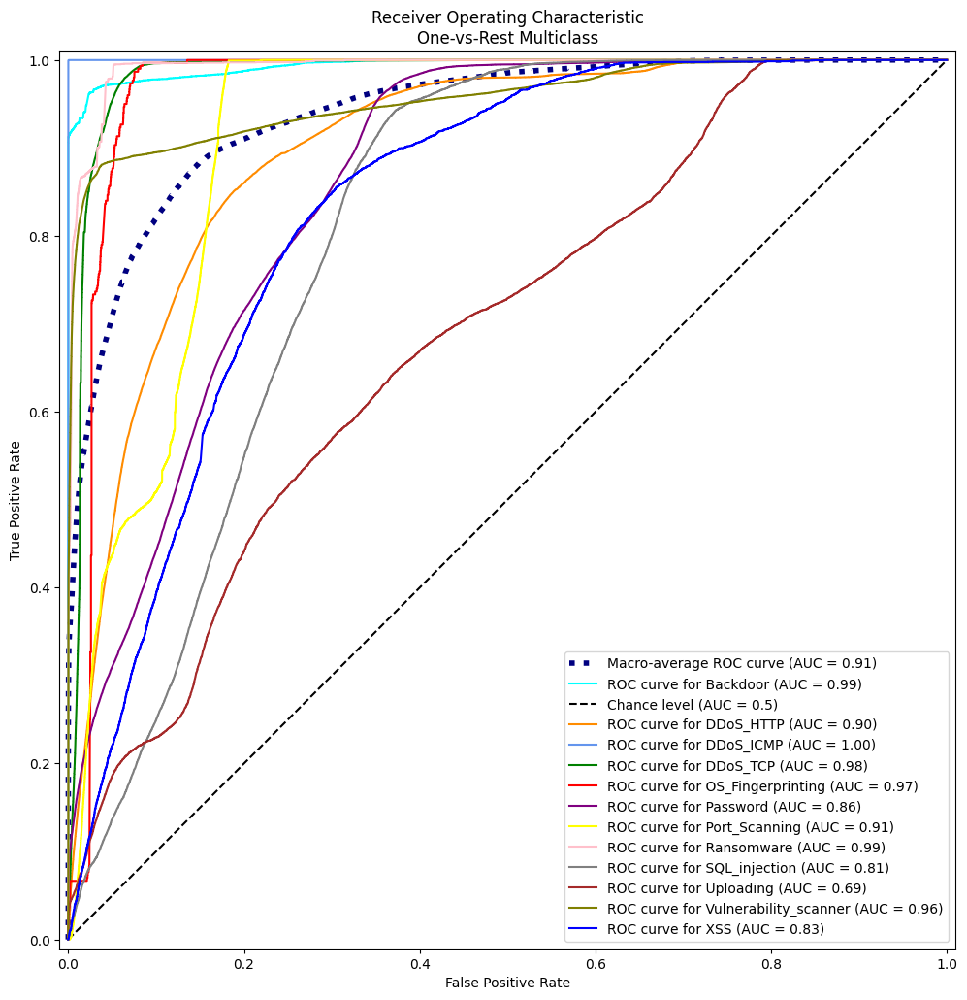

Processing interval: 3s
SMOTE used: SMOTEENN(random_state=4266)
Number of rows after aggregation:  19504


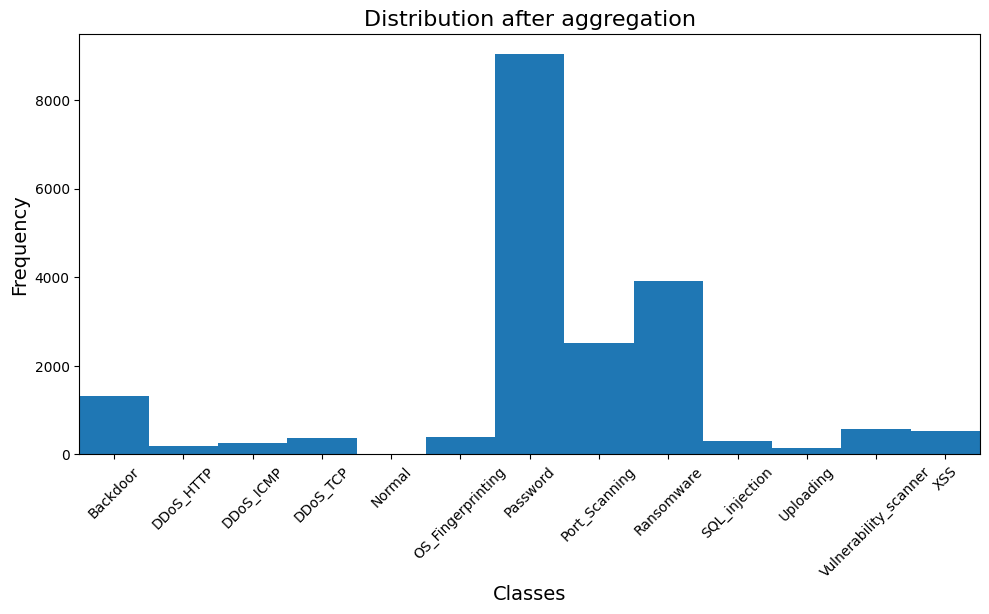

Resampled dataset size: ((89048, 95), (89048,))


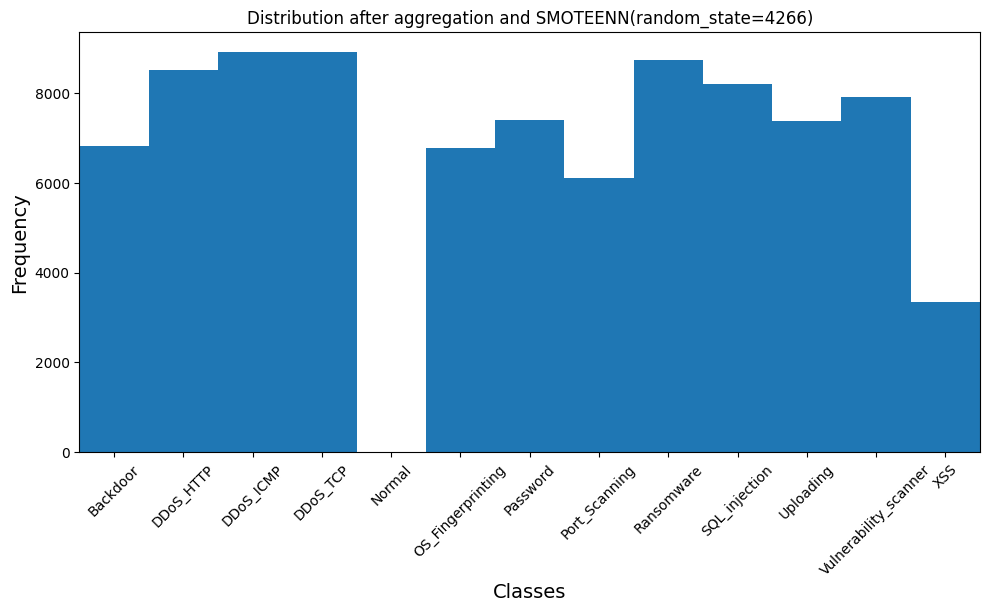

Fold 1
Epoch 1/100
557/557 ━━━━━━━━━━━━━━━━━━━━ 8s 10ms/step - accuracy: 0.5564 - loss: 2.0157 - val_accuracy: 0.8857 - val_loss: 0.7757
Epoch 2/100
557/557 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - accuracy: 0.8235 - loss: 0.9407 - val_accuracy: 0.8924 - val_loss: 0.6689
Epoch 3/100
557/557 ━━━━━━━━━━━━━━━━━━━━ 6s 11ms/step - accuracy: 0.8492 - loss: 0.8304 - val_accuracy: 0.8933 - val_loss: 0.6304
Epoch 4/100
557/557 ━━━━━━━━━━━━━━━━━━━━ 7s 13ms/step - accuracy: 0.8587 - loss: 0.7730 - val_accuracy: 0.9014 - val_loss: 0.5869
Epoch 5/100
557/557 ━━━━━━━━━━━━━━━━━━━━ 8s 9ms/step - accuracy: 0.8631 - loss: 0.7382 - val_accuracy: 0.9089 - val_loss: 0.5580
Epoch 6/100
557/557 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - accuracy: 0.8685 - loss: 0.7024 - val_accuracy: 0.9066 - val_loss: 0.5448
Epoch 7/100
557/557 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - accuracy: 0.8742 - loss: 0.6716 - val_accuracy: 0.9102 - val_loss: 0.5181
Epoch 8/100
557/557 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - accuracy: 0.8770 - loss: 0.6501 

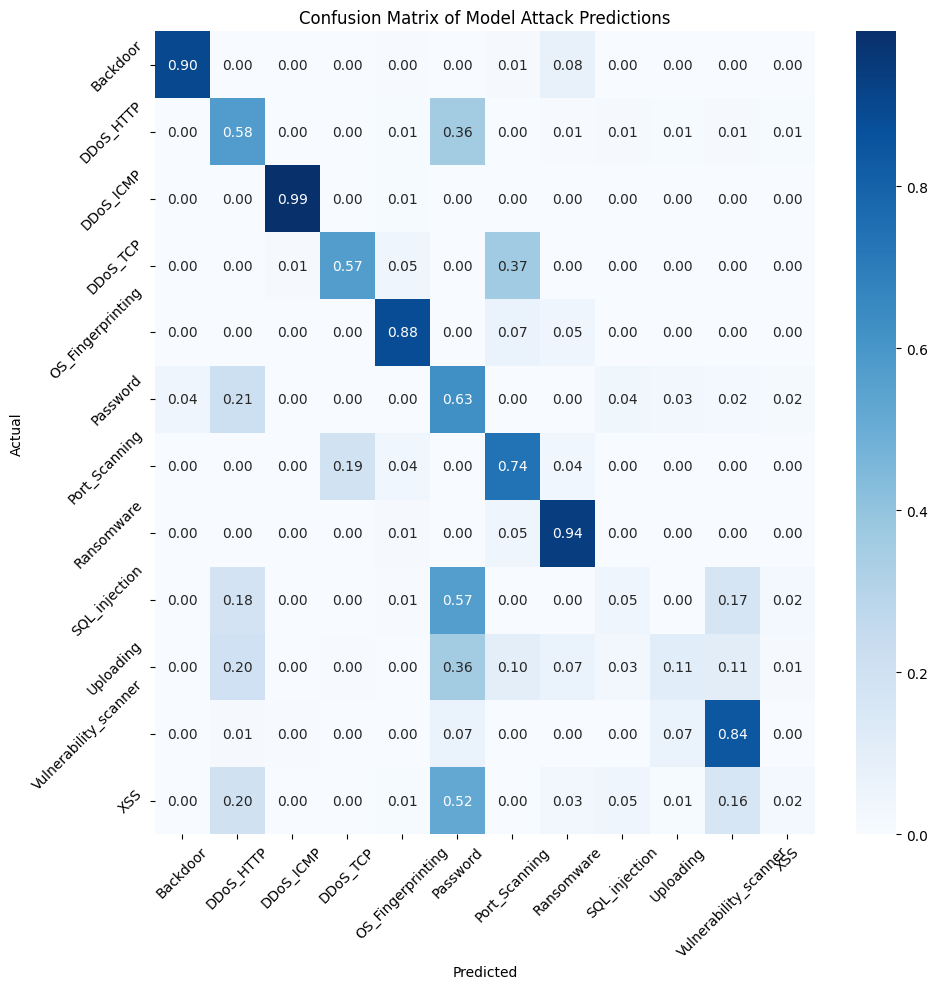

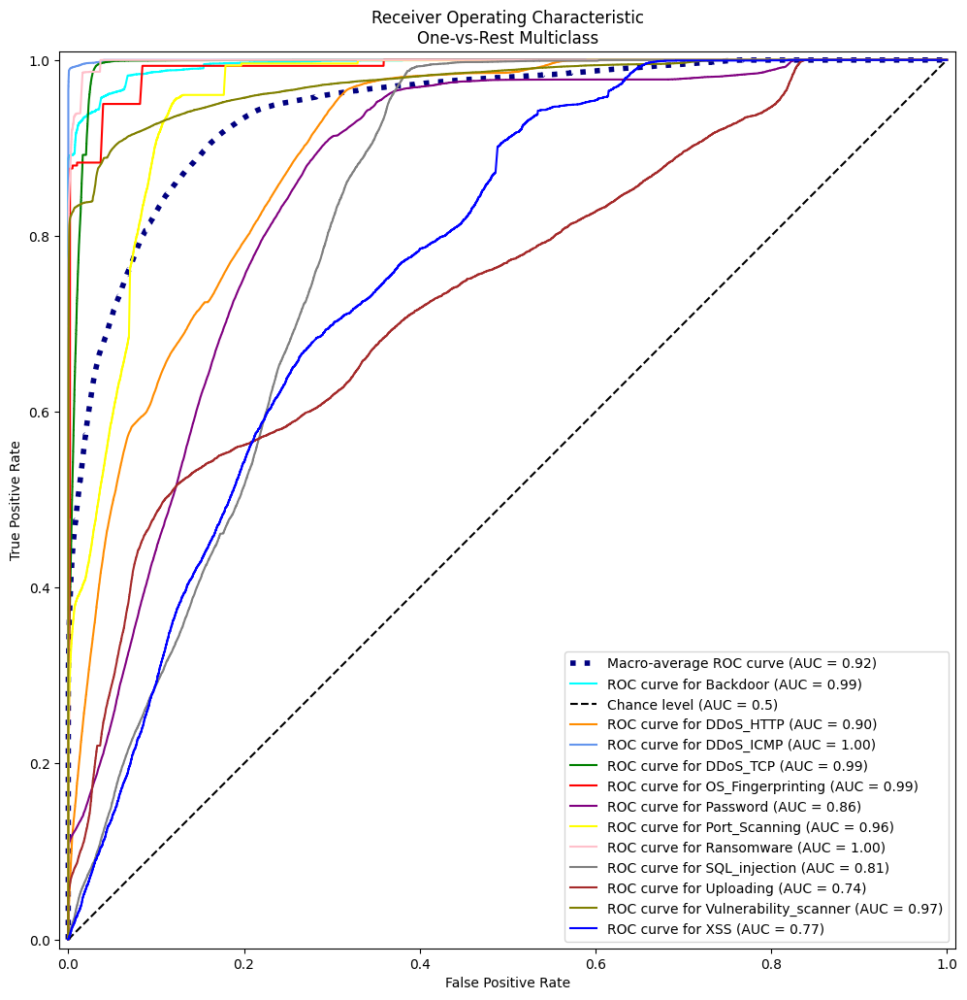

Processing interval: 3s
SMOTE used: SMOTETomek(random_state=4266)
Number of rows after aggregation:  19504


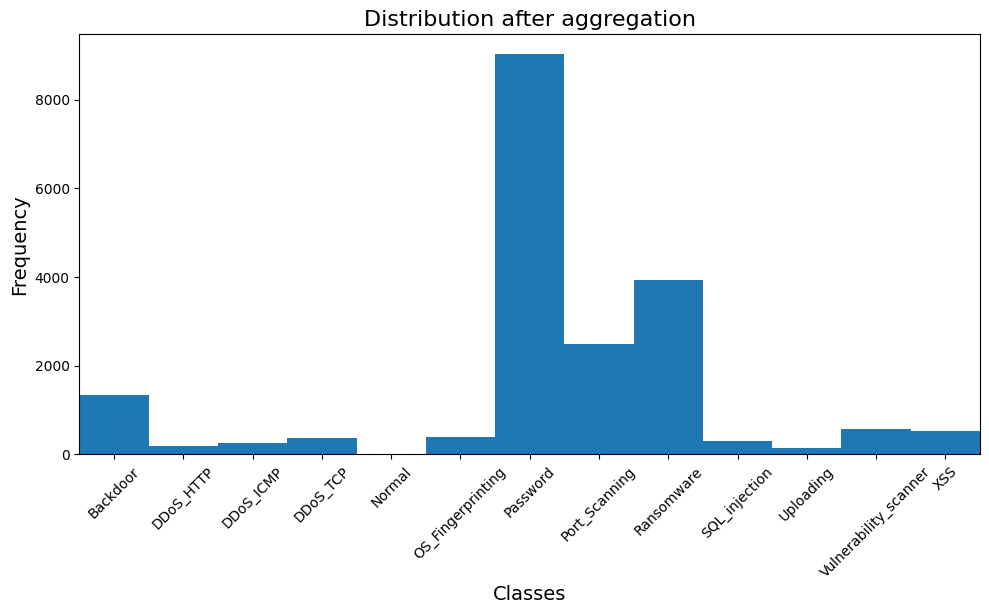

Resampled dataset size: ((107718, 95), (107718,))


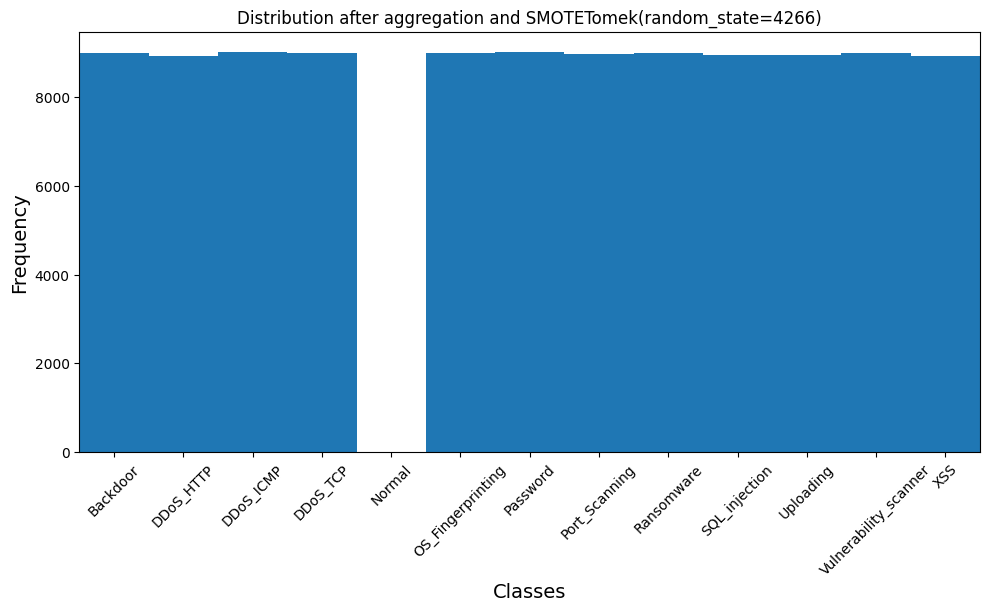

Fold 1
Epoch 1/100
674/674 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step - accuracy: 0.4946 - loss: 2.1456 - val_accuracy: 0.7878 - val_loss: 1.0808
Epoch 2/100
674/674 ━━━━━━━━━━━━━━━━━━━━ 10s 15ms/step - accuracy: 0.7236 - loss: 1.2221 - val_accuracy: 0.8078 - val_loss: 0.9655
Epoch 3/100
674/674 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step - accuracy: 0.7445 - loss: 1.1308 - val_accuracy: 0.8155 - val_loss: 0.9100
Epoch 4/100
674/674 ━━━━━━━━━━━━━━━━━━━━ 9s 13ms/step - accuracy: 0.7638 - loss: 1.0592 - val_accuracy: 0.8192 - val_loss: 0.8814
Epoch 5/100
674/674 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step - accuracy: 0.7639 - loss: 1.0368 - val_accuracy: 0.8174 - val_loss: 0.8500
Epoch 6/100
674/674 ━━━━━━━━━━━━━━━━━━━━ 12s 17ms/step - accuracy: 0.7732 - loss: 1.0021 - val_accuracy: 0.8160 - val_loss: 0.8380
Epoch 7/100
674/674 ━━━━━━━━━━━━━━━━━━━━ 11s 16ms/step - accuracy: 0.7802 - loss: 0.9647 - val_accuracy: 0.8233 - val_loss: 0.8176
Epoch 8/100
674/674 ━━━━━━━━━━━━━━━━━━━━ 11s 16ms/step - accuracy: 0.7832 - lo

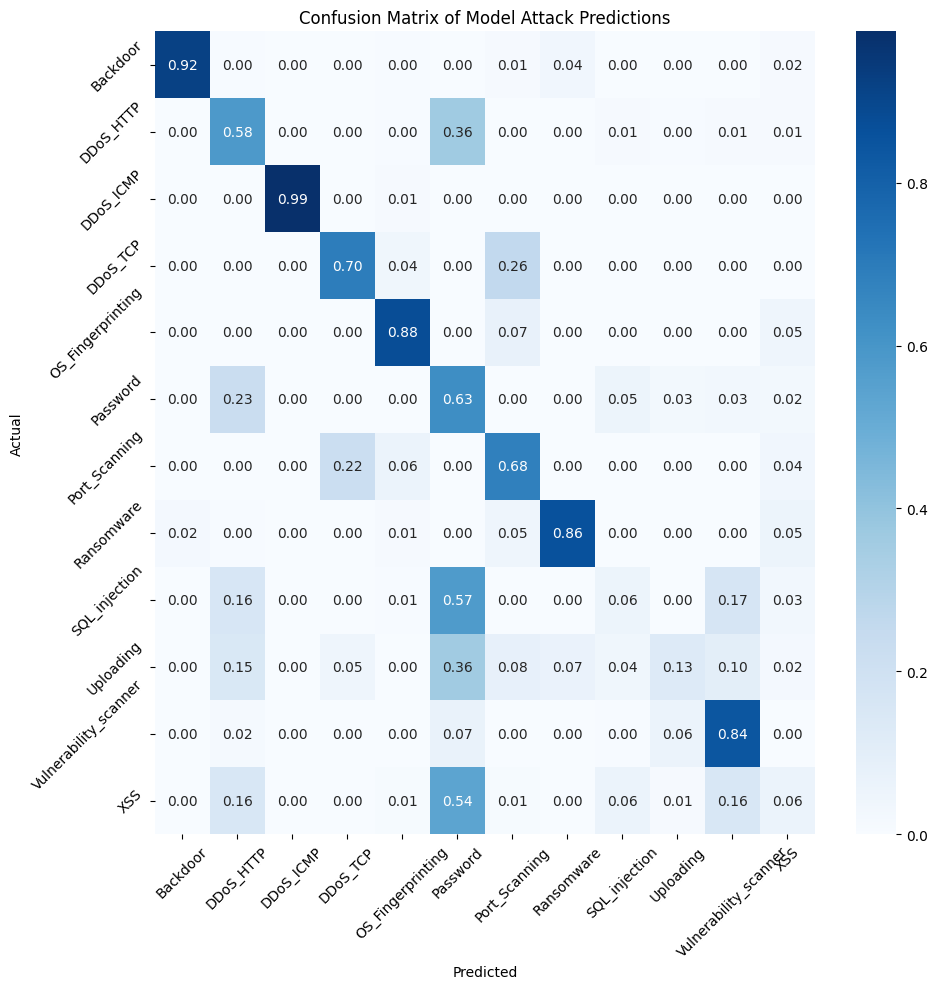

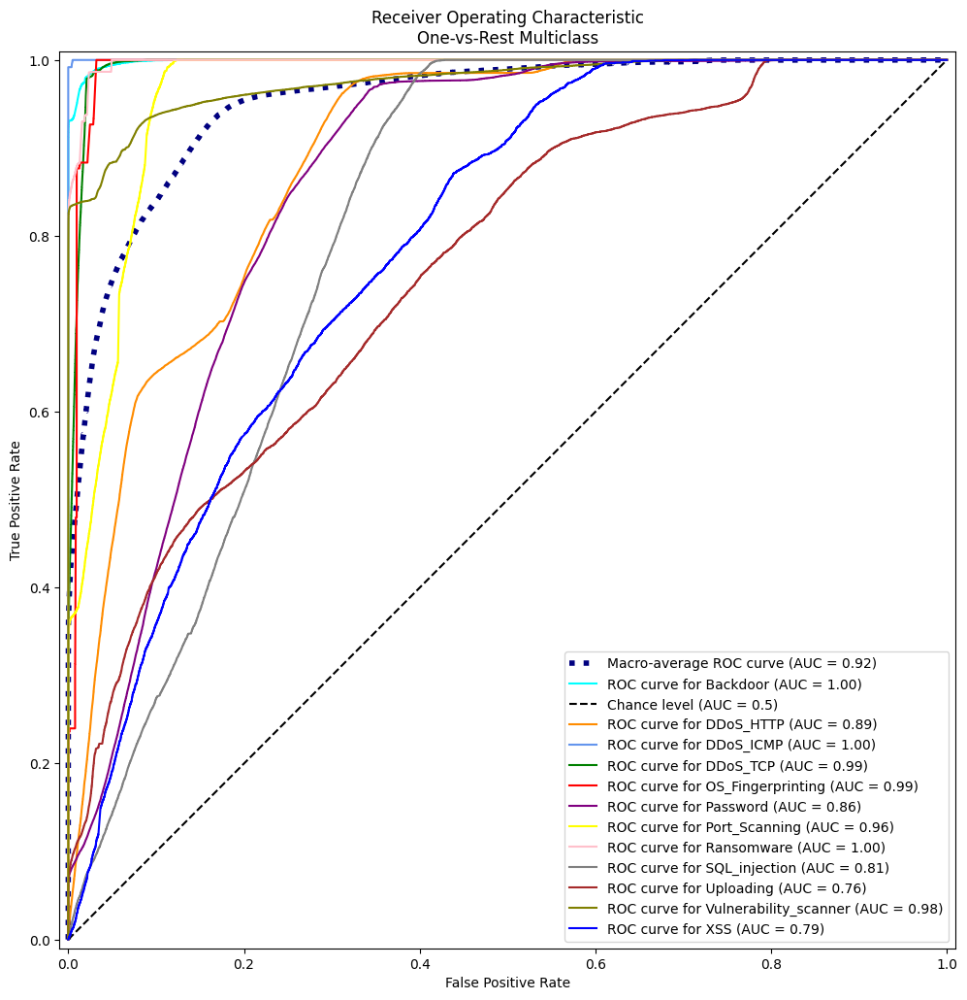

Processing interval: 2s
SMOTE used: BorderlineSMOTE(random_state=4266)
Number of rows after aggregation:  27337


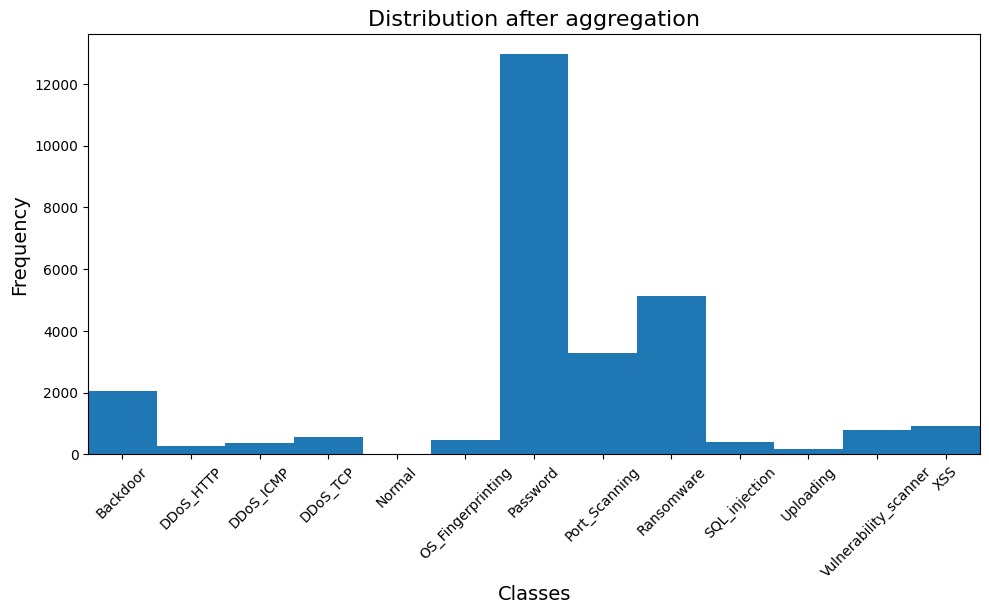

Resampled dataset size: ((143025, 95), (143025,))


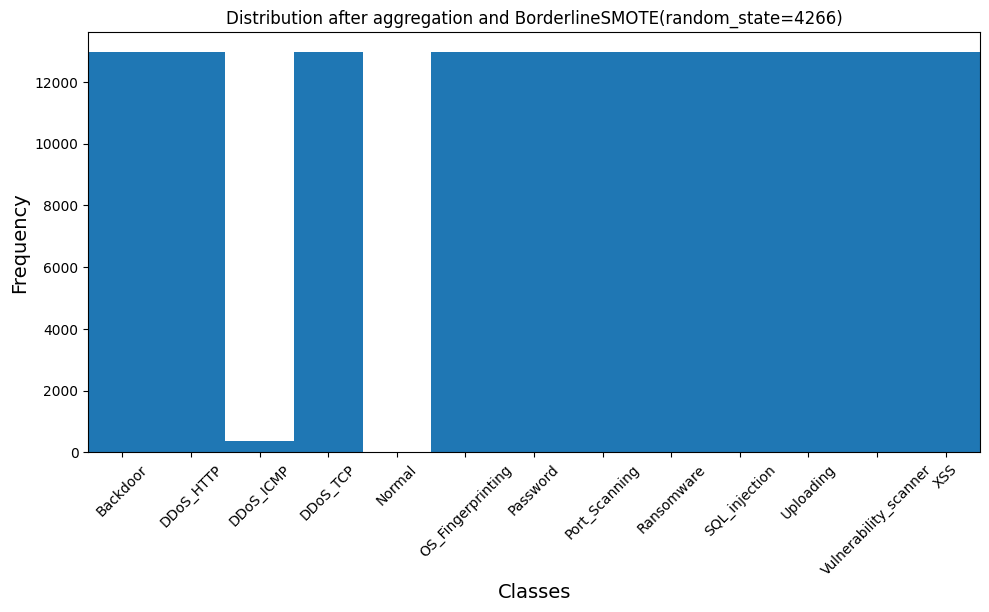

Fold 1
Epoch 1/100
894/894 ━━━━━━━━━━━━━━━━━━━━ 8s 7ms/step - accuracy: 0.4518 - loss: 2.1250 - val_accuracy: 0.7219 - val_loss: 1.1524
Epoch 2/100
894/894 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - accuracy: 0.6567 - loss: 1.3098 - val_accuracy: 0.7495 - val_loss: 1.0456
Epoch 3/100
894/894 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - accuracy: 0.6872 - loss: 1.2086 - val_accuracy: 0.7566 - val_loss: 0.9775
Epoch 4/100
894/894 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - accuracy: 0.7053 - loss: 1.1448 - val_accuracy: 0.7780 - val_loss: 0.9425
Epoch 5/100
894/894 ━━━━━━━━━━━━━━━━━━━━ 9s 10ms/step - accuracy: 0.7175 - loss: 1.0991 - val_accuracy: 0.7576 - val_loss: 0.8990
Epoch 6/100
894/894 ━━━━━━━━━━━━━━━━━━━━ 8s 9ms/step - accuracy: 0.7287 - loss: 1.0615 - val_accuracy: 0.7775 - val_loss: 0.8973
Epoch 7/100
894/894 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - accuracy: 0.7331 - loss: 1.0376 - val_accuracy: 0.8056 - val_loss: 0.8506
Epoch 8/100
894/894 ━━━━━━━━━━━━━━━━━━━━ 8s 9ms/step - accuracy: 0.7401 - loss: 1.0085 - 

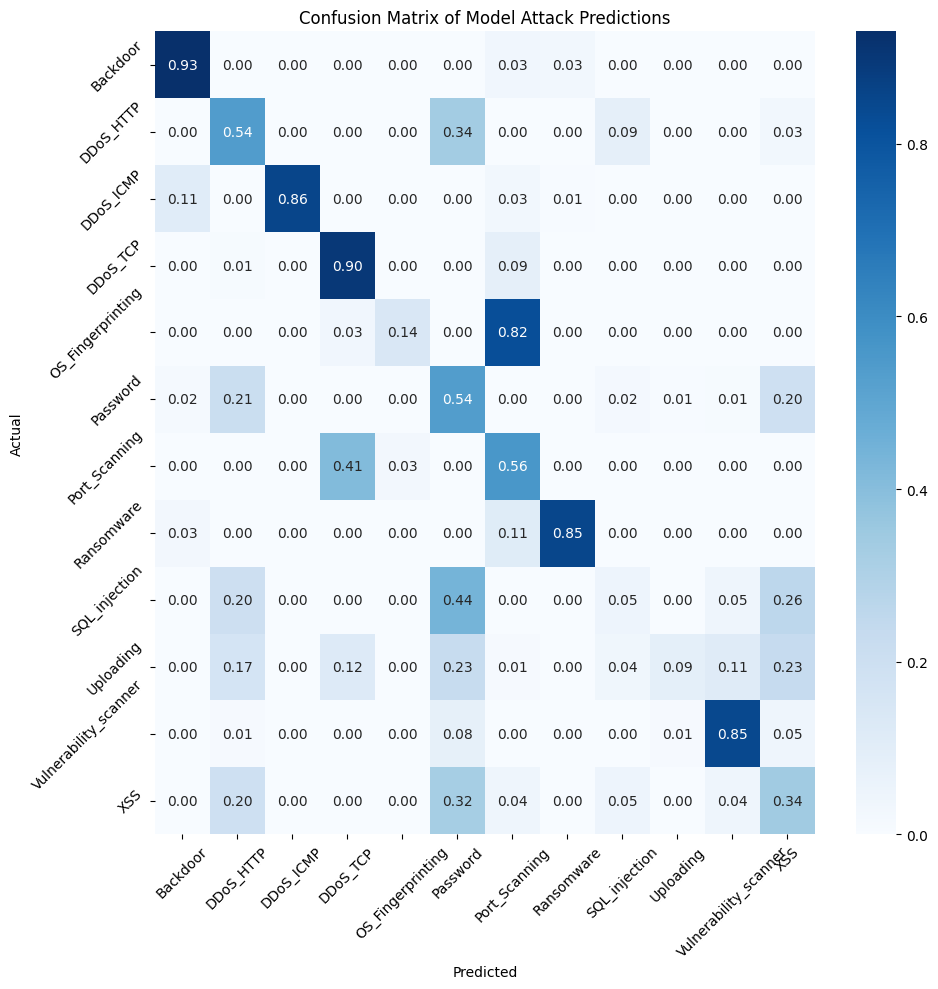

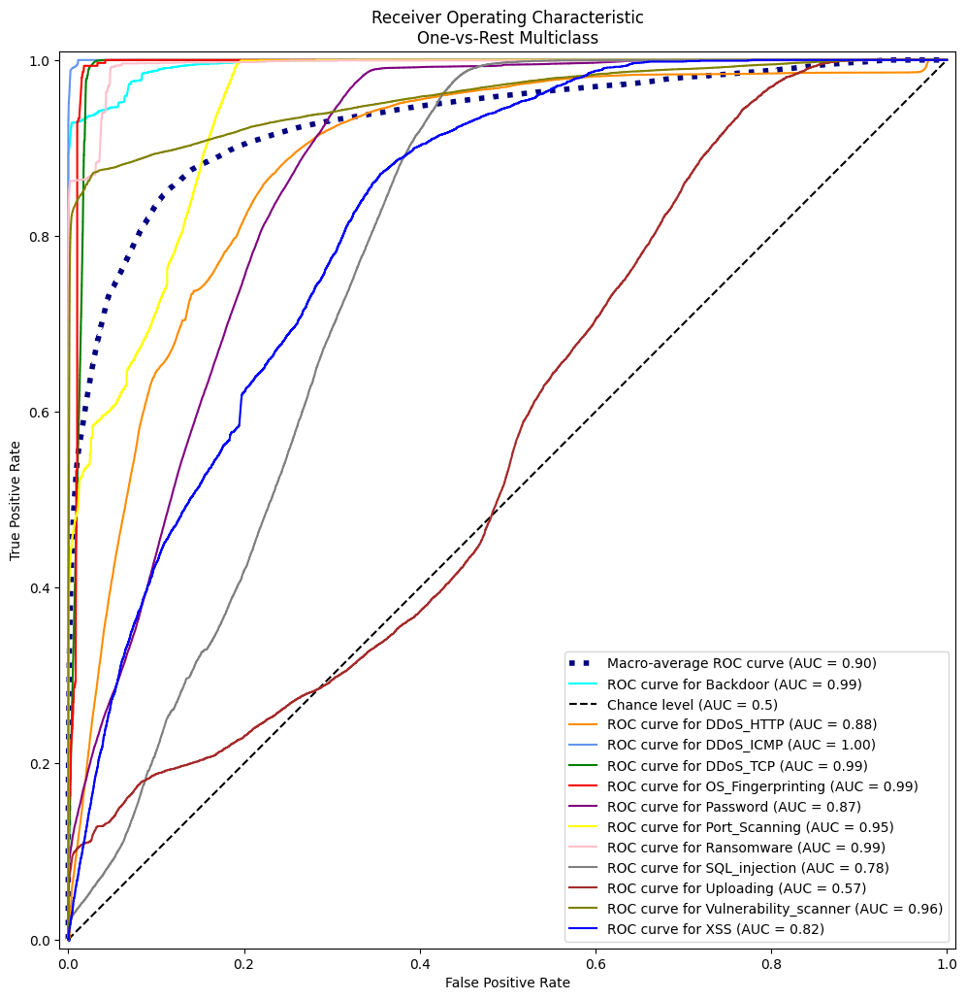

Processing interval: 2s
SMOTE used: SMOTEENN(random_state=4266)
Number of rows after aggregation:  27337


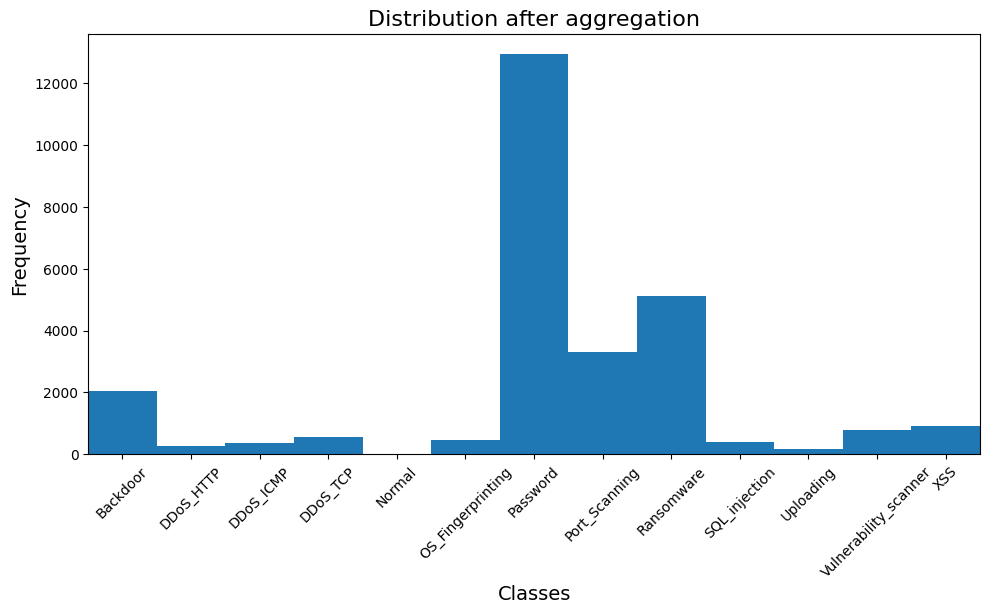

Resampled dataset size: ((131870, 95), (131870,))


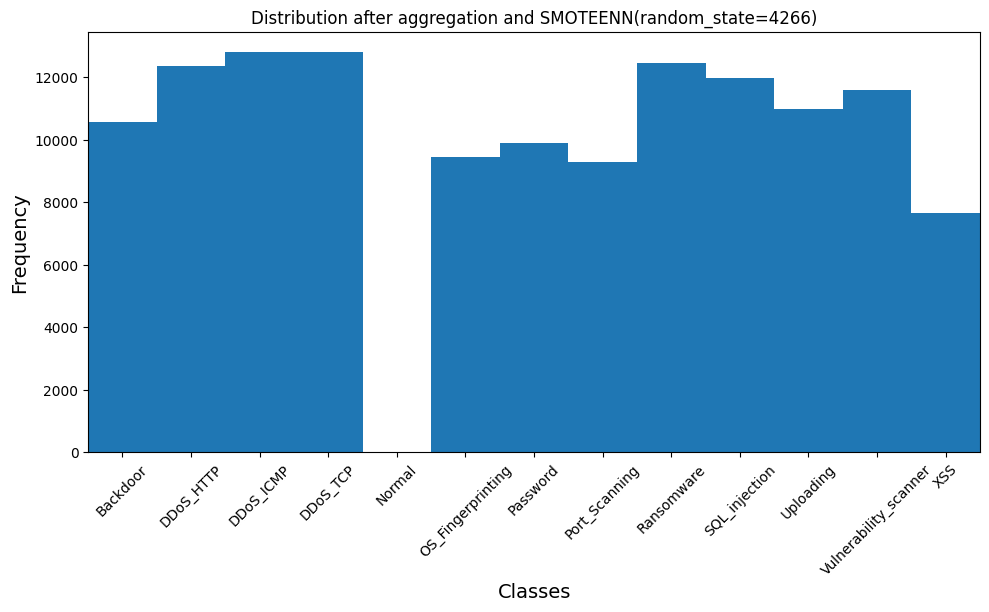

Fold 1
Epoch 1/100
825/825 ━━━━━━━━━━━━━━━━━━━━ 8s 8ms/step - accuracy: 0.6168 - loss: 1.8106 - val_accuracy: 0.8719 - val_loss: 0.7477
Epoch 2/100
825/825 ━━━━━━━━━━━━━━━━━━━━ 9s 7ms/step - accuracy: 0.8285 - loss: 0.8851 - val_accuracy: 0.8797 - val_loss: 0.6665
Epoch 3/100
825/825 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - accuracy: 0.8467 - loss: 0.7901 - val_accuracy: 0.9003 - val_loss: 0.6070
Epoch 4/100
825/825 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - accuracy: 0.8561 - loss: 0.7435 - val_accuracy: 0.9075 - val_loss: 0.5698
Epoch 5/100
825/825 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - accuracy: 0.8632 - loss: 0.7002 - val_accuracy: 0.9050 - val_loss: 0.5474
Epoch 6/100
825/825 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - accuracy: 0.8692 - loss: 0.6722 - val_accuracy: 0.9091 - val_loss: 0.5271
Epoch 7/100
825/825 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - accuracy: 0.8736 - loss: 0.6435 - val_accuracy: 0.8947 - val_loss: 0.5345
Epoch 8/100
825/825 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - accuracy: 0.8763 - loss: 0.6272 - 

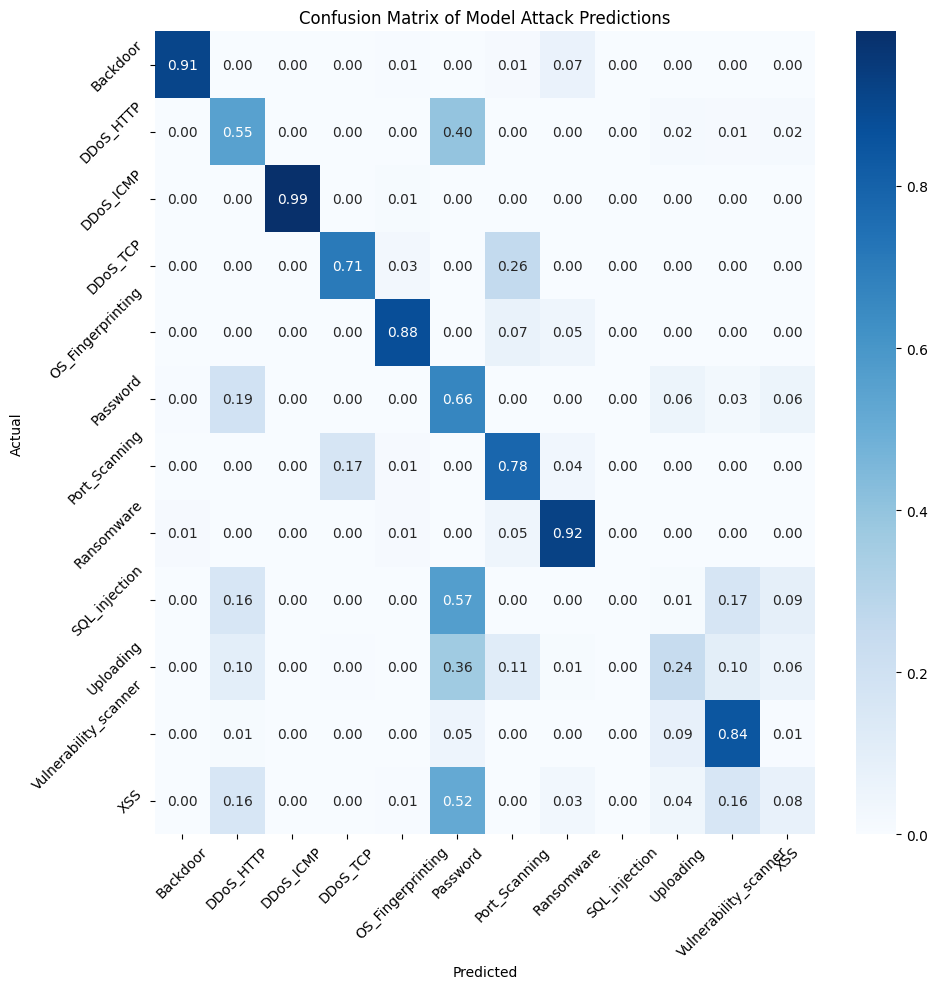

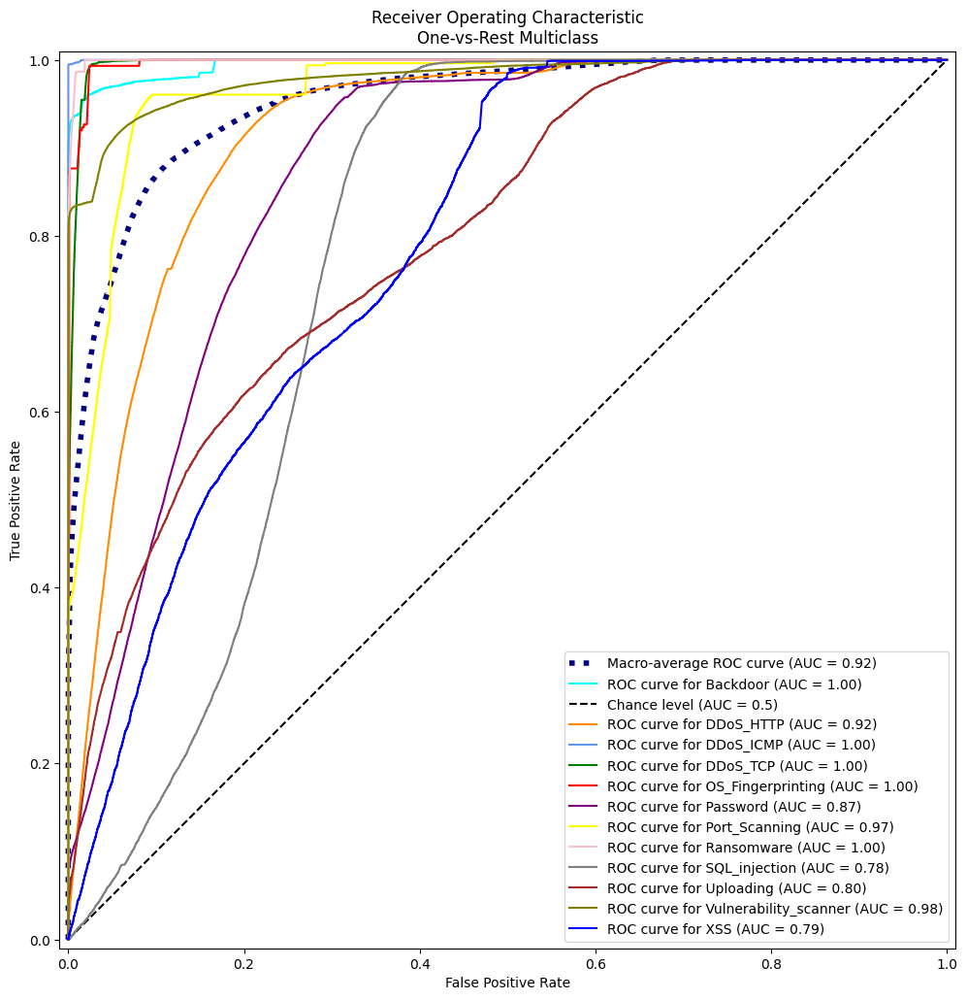

Processing interval: 2s
SMOTE used: SMOTETomek(random_state=4266)
Number of rows after aggregation:  27337


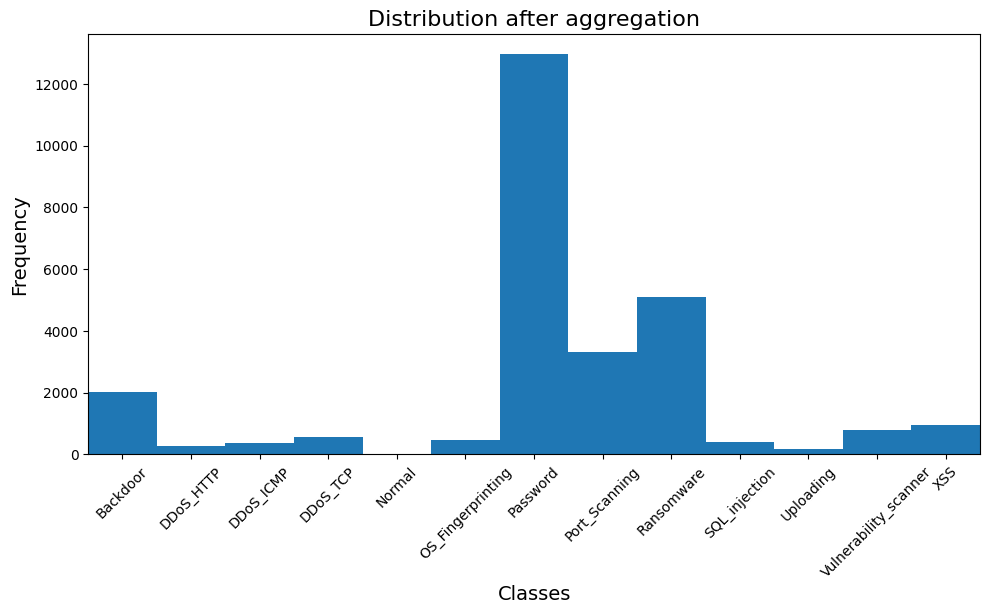

Resampled dataset size: ((154880, 95), (154880,))


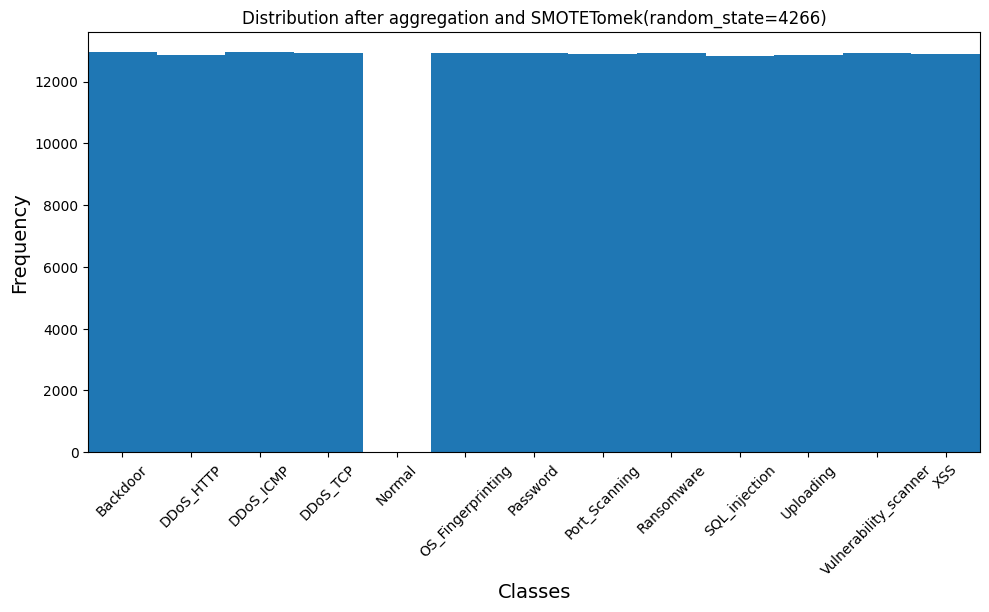

Fold 1
Epoch 1/100
968/968 ━━━━━━━━━━━━━━━━━━━━ 12s 11ms/step - accuracy: 0.5413 - loss: 1.9483 - val_accuracy: 0.7798 - val_loss: 0.9880
Epoch 2/100
968/968 ━━━━━━━━━━━━━━━━━━━━ 11s 12ms/step - accuracy: 0.7370 - loss: 1.1463 - val_accuracy: 0.8062 - val_loss: 0.9016
Epoch 3/100
968/968 ━━━━━━━━━━━━━━━━━━━━ 12s 12ms/step - accuracy: 0.7568 - loss: 1.0632 - val_accuracy: 0.8006 - val_loss: 0.8686
Epoch 4/100
968/968 ━━━━━━━━━━━━━━━━━━━━ 12s 12ms/step - accuracy: 0.7693 - loss: 1.0103 - val_accuracy: 0.8181 - val_loss: 0.8307
Epoch 5/100
968/968 ━━━━━━━━━━━━━━━━━━━━ 11s 12ms/step - accuracy: 0.7760 - loss: 0.9664 - val_accuracy: 0.8201 - val_loss: 0.8002
Epoch 6/100
968/968 ━━━━━━━━━━━━━━━━━━━━ 11s 11ms/step - accuracy: 0.7848 - loss: 0.9380 - val_accuracy: 0.8293 - val_loss: 0.7918
Epoch 7/100
968/968 ━━━━━━━━━━━━━━━━━━━━ 11s 12ms/step - accuracy: 0.7853 - loss: 0.9174 - val_accuracy: 0.8296 - val_loss: 0.7693
Epoch 8/100
968/968 ━━━━━━━━━━━━━━━━━━━━ 12s 13ms/step - accuracy: 0.7901 - 

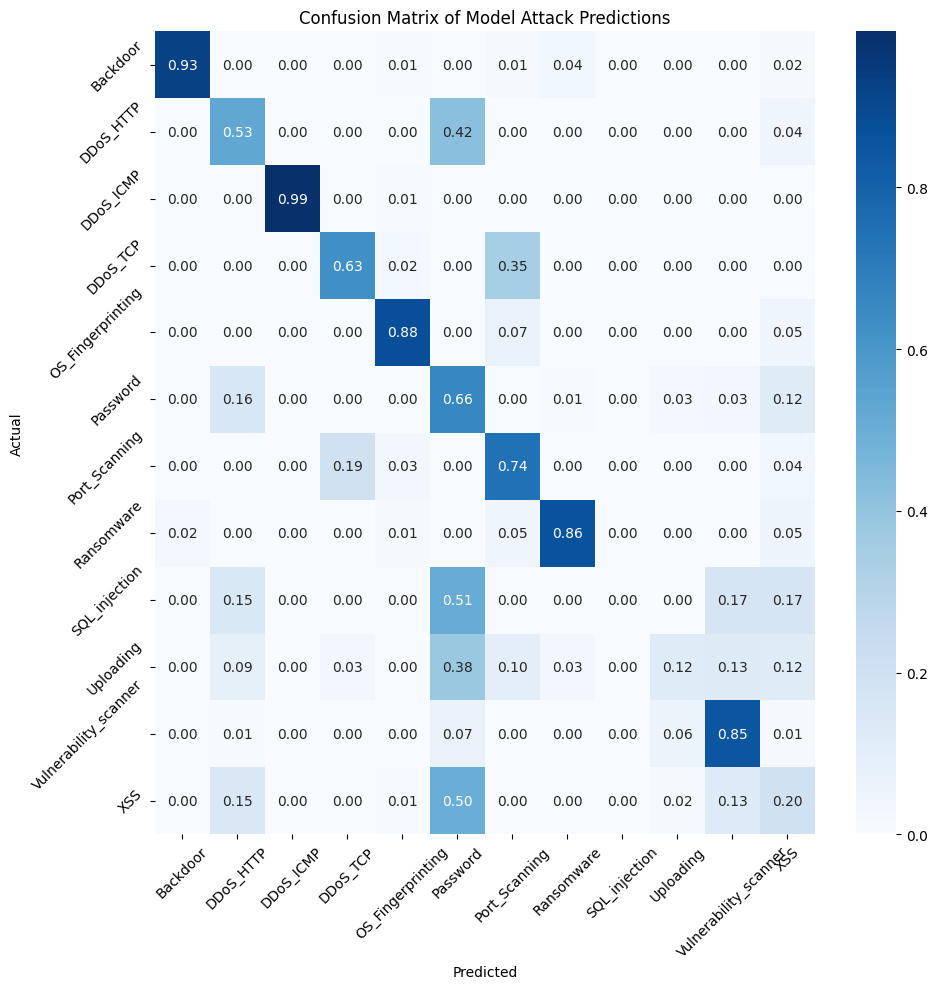

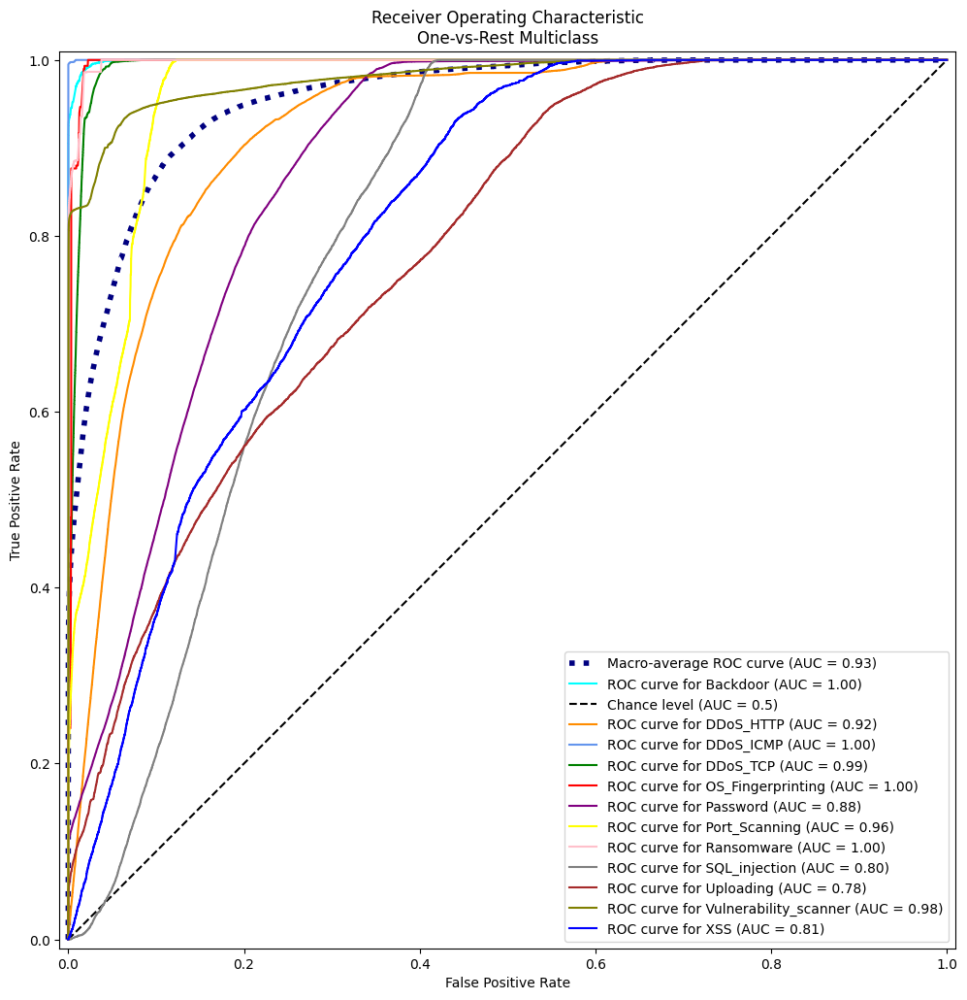

Processing interval: 1s
SMOTE used: BorderlineSMOTE(random_state=4266)
Number of rows after aggregation:  46426


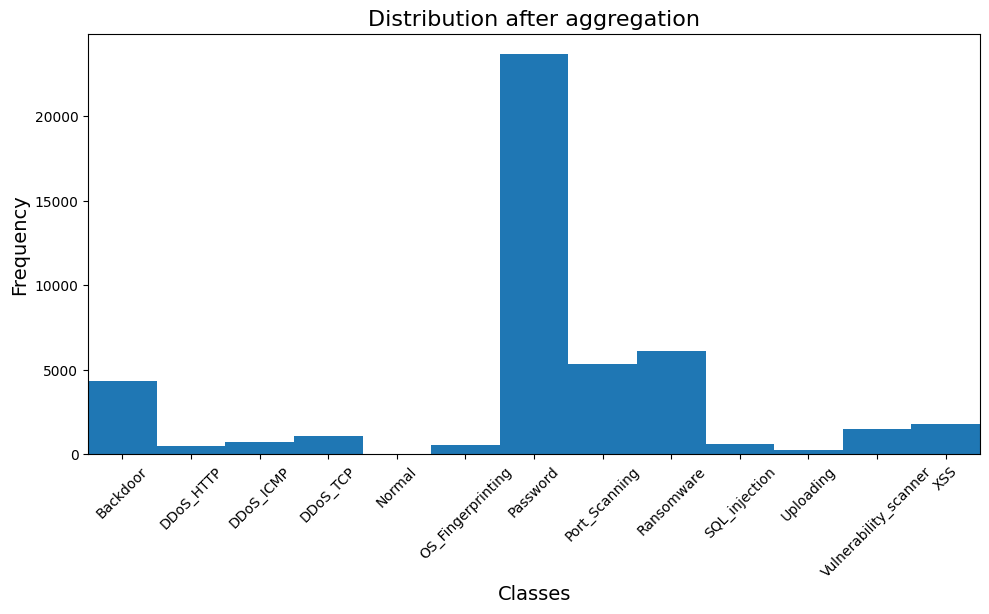

Resampled dataset size: ((284184, 95), (284184,))


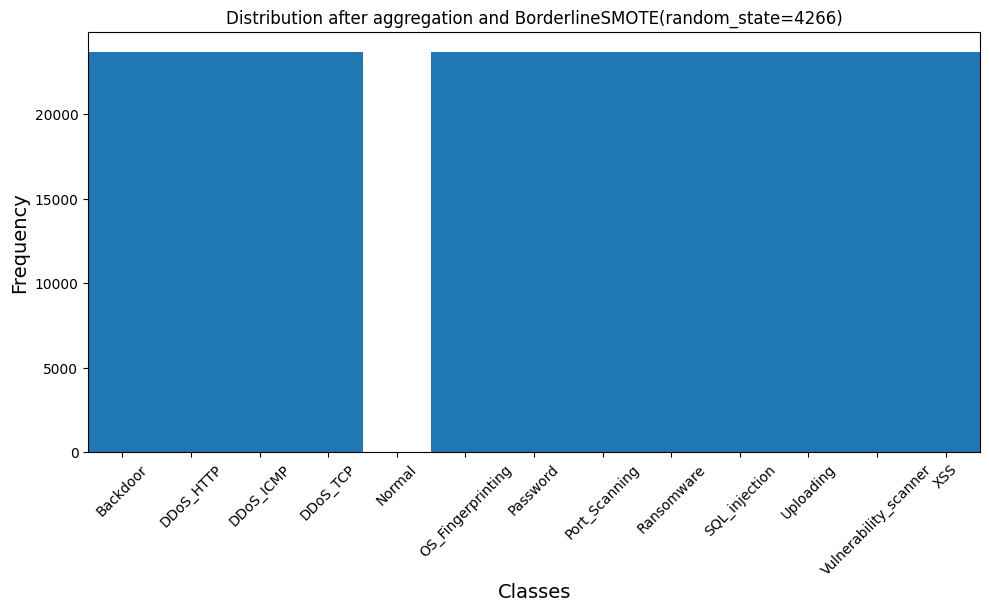

Fold 1
Epoch 1/100
1777/1777 ━━━━━━━━━━━━━━━━━━━━ 21s 11ms/step - accuracy: 0.5077 - loss: 1.8523 - val_accuracy: 0.7344 - val_loss: 1.0584
Epoch 2/100
1777/1777 ━━━━━━━━━━━━━━━━━━━━ 21s 12ms/step - accuracy: 0.6783 - loss: 1.2040 - val_accuracy: 0.7645 - val_loss: 0.9507
Epoch 3/100
1777/1777 ━━━━━━━━━━━━━━━━━━━━ 21s 12ms/step - accuracy: 0.7014 - loss: 1.1201 - val_accuracy: 0.7688 - val_loss: 0.9138
Epoch 4/100
1777/1777 ━━━━━━━━━━━━━━━━━━━━ 21s 12ms/step - accuracy: 0.7192 - loss: 1.0544 - val_accuracy: 0.7794 - val_loss: 0.8593
Epoch 5/100
1777/1777 ━━━━━━━━━━━━━━━━━━━━ 21s 12ms/step - accuracy: 0.7286 - loss: 1.0188 - val_accuracy: 0.7700 - val_loss: 0.8617
Epoch 6/100
1777/1777 ━━━━━━━━━━━━━━━━━━━━ 22s 12ms/step - accuracy: 0.7350 - loss: 0.9934 - val_accuracy: 0.7994 - val_loss: 0.7986
Epoch 7/100
1777/1777 ━━━━━━━━━━━━━━━━━━━━ 21s 12ms/step - accuracy: 0.7432 - loss: 0.9645 - val_accuracy: 0.7979 - val_loss: 0.7904
Epoch 8/100
1777/1777 ━━━━━━━━━━━━━━━━━━━━ 21s 12ms/step - acc

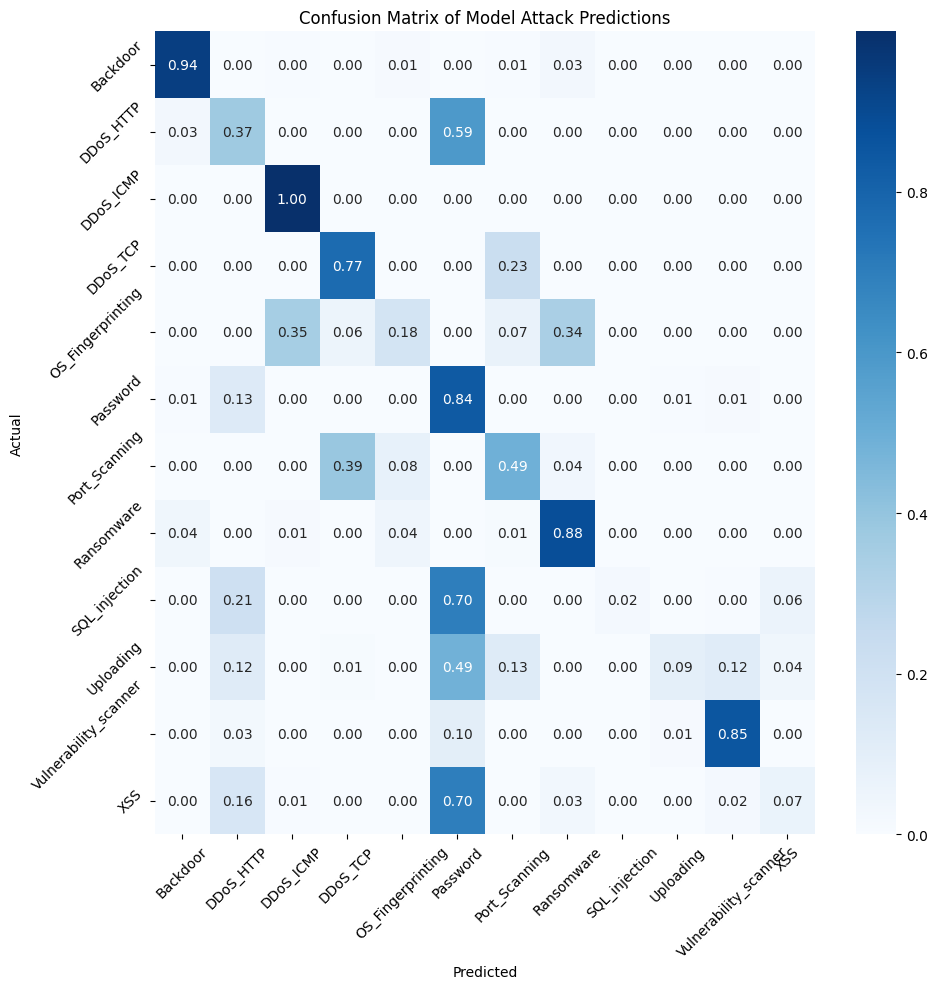

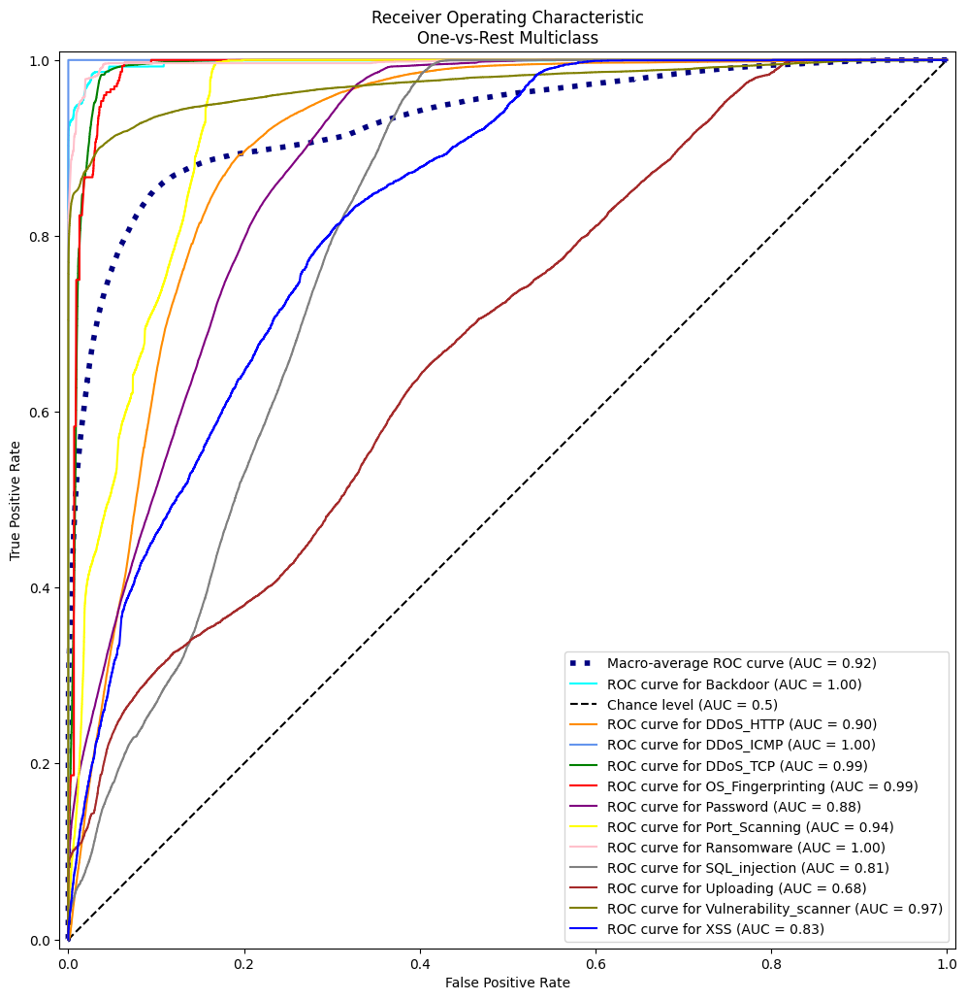

Processing interval: 1s
SMOTE used: SMOTEENN(random_state=4266)
Number of rows after aggregation:  46426


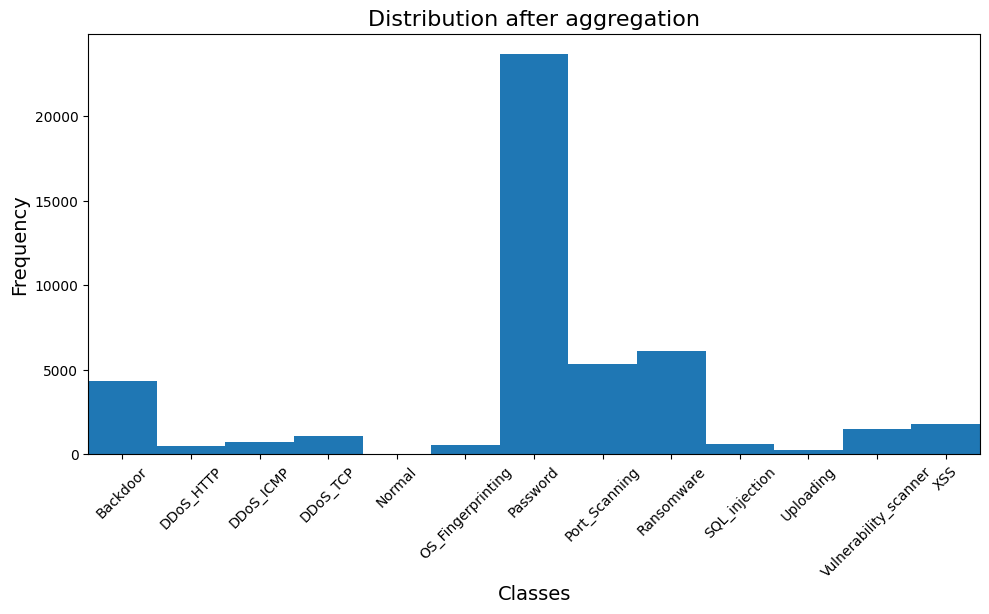

Resampled dataset size: ((251185, 95), (251185,))


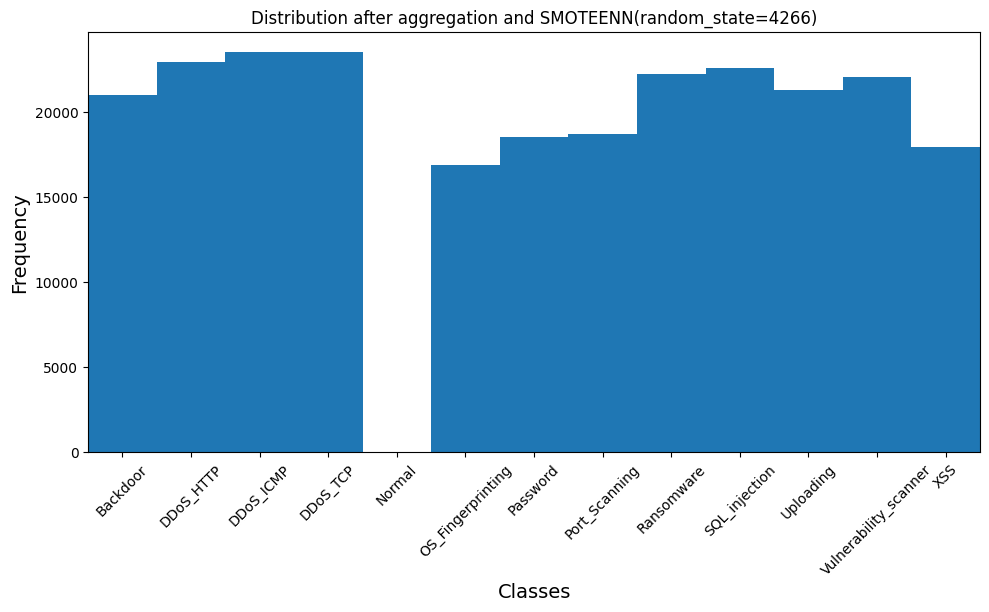

Fold 1
Epoch 1/100
1570/1570 ━━━━━━━━━━━━━━━━━━━━ 18s 10ms/step - accuracy: 0.6590 - loss: 1.5372 - val_accuracy: 0.8701 - val_loss: 0.7125
Epoch 2/100
1570/1570 ━━━━━━━━━━━━━━━━━━━━ 19s 12ms/step - accuracy: 0.8331 - loss: 0.8393 - val_accuracy: 0.8984 - val_loss: 0.6302
Epoch 3/100
1570/1570 ━━━━━━━━━━━━━━━━━━━━ 20s 13ms/step - accuracy: 0.8508 - loss: 0.7476 - val_accuracy: 0.8970 - val_loss: 0.5667
Epoch 4/100
1570/1570 ━━━━━━━━━━━━━━━━━━━━ 20s 13ms/step - accuracy: 0.8636 - loss: 0.6861 - val_accuracy: 0.9064 - val_loss: 0.5237
Epoch 5/100
1570/1570 ━━━━━━━━━━━━━━━━━━━━ 20s 13ms/step - accuracy: 0.8730 - loss: 0.6484 - val_accuracy: 0.9148 - val_loss: 0.4959
Epoch 6/100
1570/1570 ━━━━━━━━━━━━━━━━━━━━ 21s 13ms/step - accuracy: 0.8769 - loss: 0.6230 - val_accuracy: 0.9176 - val_loss: 0.4812
Epoch 7/100
1570/1570 ━━━━━━━━━━━━━━━━━━━━ 24s 15ms/step - accuracy: 0.8796 - loss: 0.6024 - val_accuracy: 0.9169 - val_loss: 0.4632
Epoch 8/100
1570/1570 ━━━━━━━━━━━━━━━━━━━━ 20s 13ms/step - acc

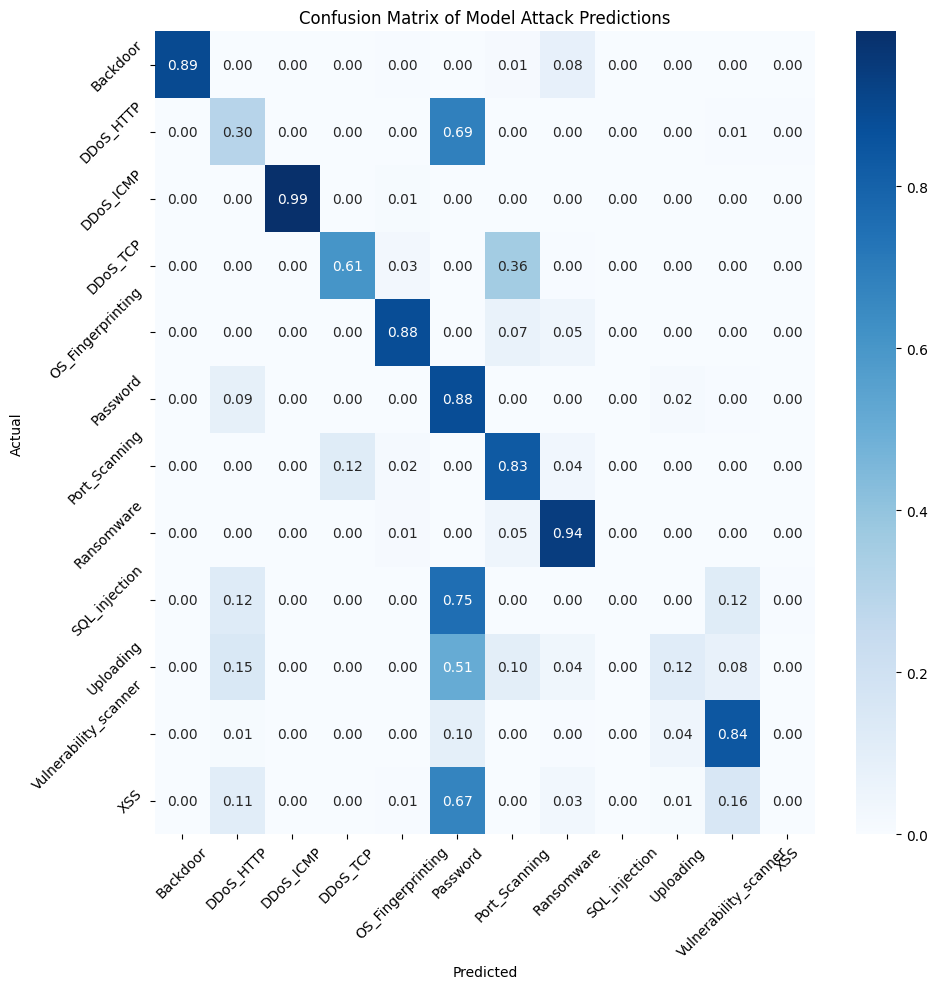

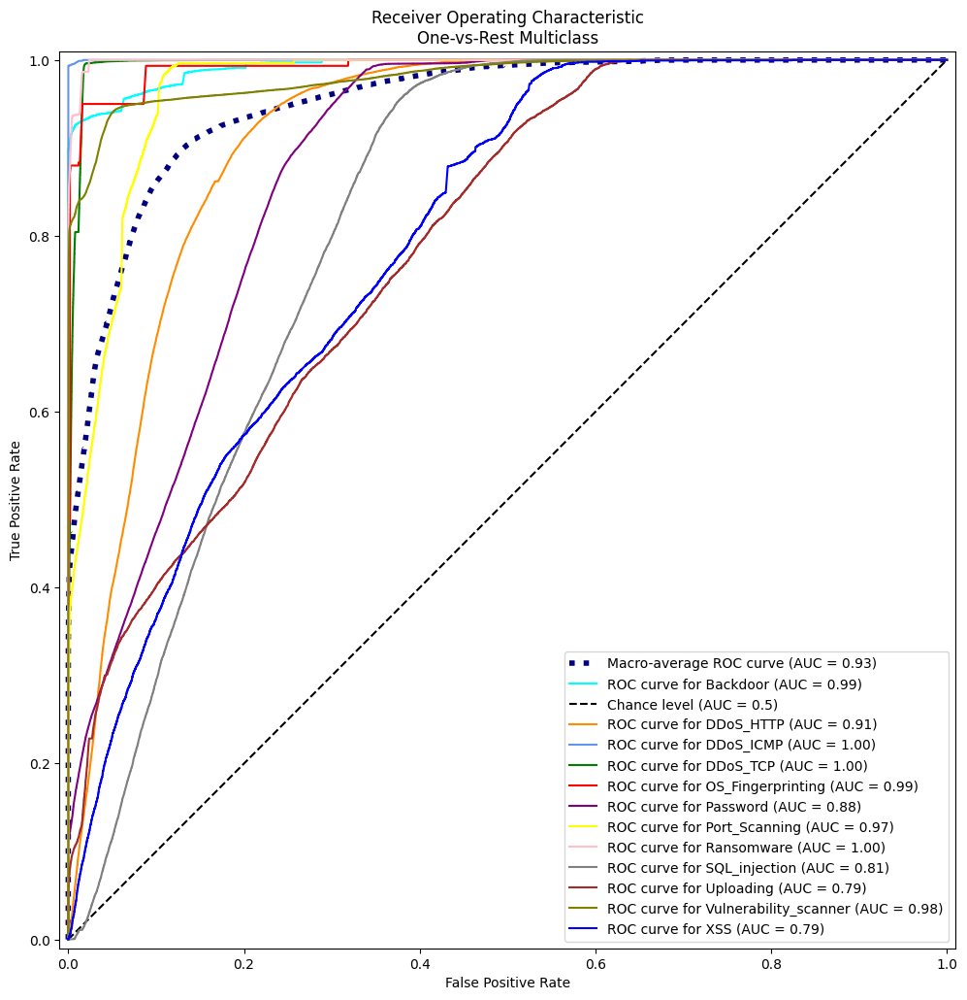

Processing interval: 1s
SMOTE used: SMOTETomek(random_state=4266)
Number of rows after aggregation:  46426


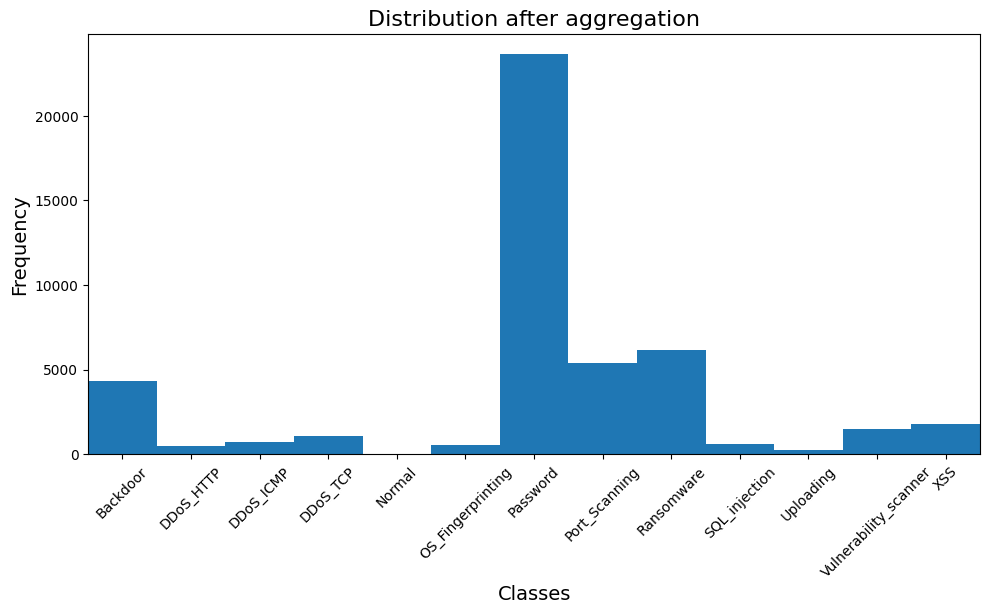

Resampled dataset size: ((282822, 95), (282822,))


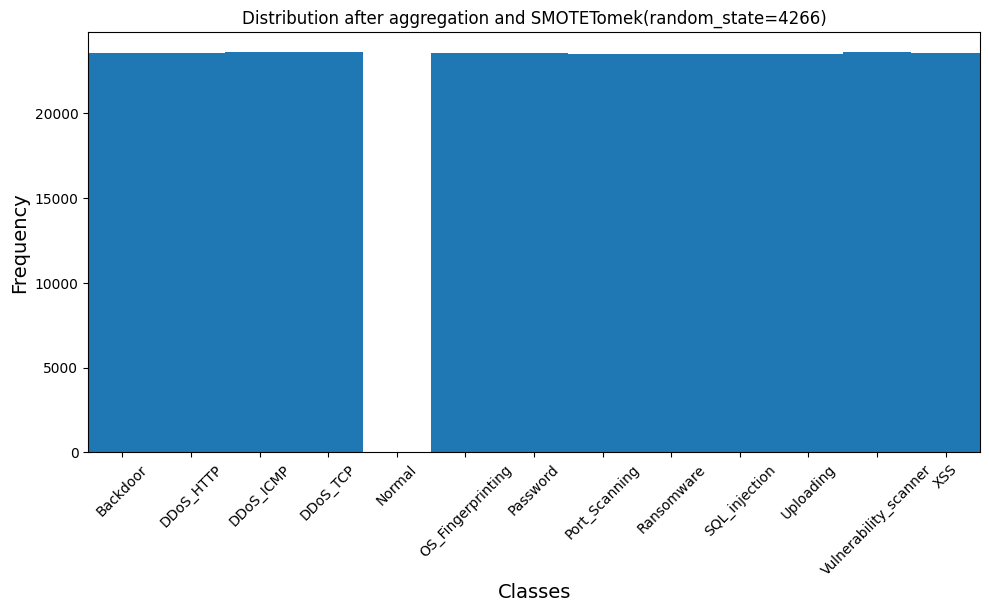

Fold 1
Epoch 1/100
1768/1768 ━━━━━━━━━━━━━━━━━━━━ 29s 15ms/step - accuracy: 0.6180 - loss: 1.6705 - val_accuracy: 0.8103 - val_loss: 0.9000
Epoch 2/100
1768/1768 ━━━━━━━━━━━━━━━━━━━━ 25s 14ms/step - accuracy: 0.7731 - loss: 1.0155 - val_accuracy: 0.8383 - val_loss: 0.7971
Epoch 3/100
1768/1768 ━━━━━━━━━━━━━━━━━━━━ 23s 13ms/step - accuracy: 0.7929 - loss: 0.9254 - val_accuracy: 0.8417 - val_loss: 0.7531
Epoch 4/100
1768/1768 ━━━━━━━━━━━━━━━━━━━━ 24s 13ms/step - accuracy: 0.8005 - loss: 0.8806 - val_accuracy: 0.8548 - val_loss: 0.7065
Epoch 5/100
1768/1768 ━━━━━━━━━━━━━━━━━━━━ 23s 13ms/step - accuracy: 0.8104 - loss: 0.8397 - val_accuracy: 0.8523 - val_loss: 0.6846
Epoch 6/100
1768/1768 ━━━━━━━━━━━━━━━━━━━━ 24s 13ms/step - accuracy: 0.8149 - loss: 0.8120 - val_accuracy: 0.8615 - val_loss: 0.6587
Epoch 7/100
1768/1768 ━━━━━━━━━━━━━━━━━━━━ 24s 13ms/step - accuracy: 0.8178 - loss: 0.7919 - val_accuracy: 0.8653 - val_loss: 0.6465
Epoch 8/100
1768/1768 ━━━━━━━━━━━━━━━━━━━━ 23s 13ms/step - acc

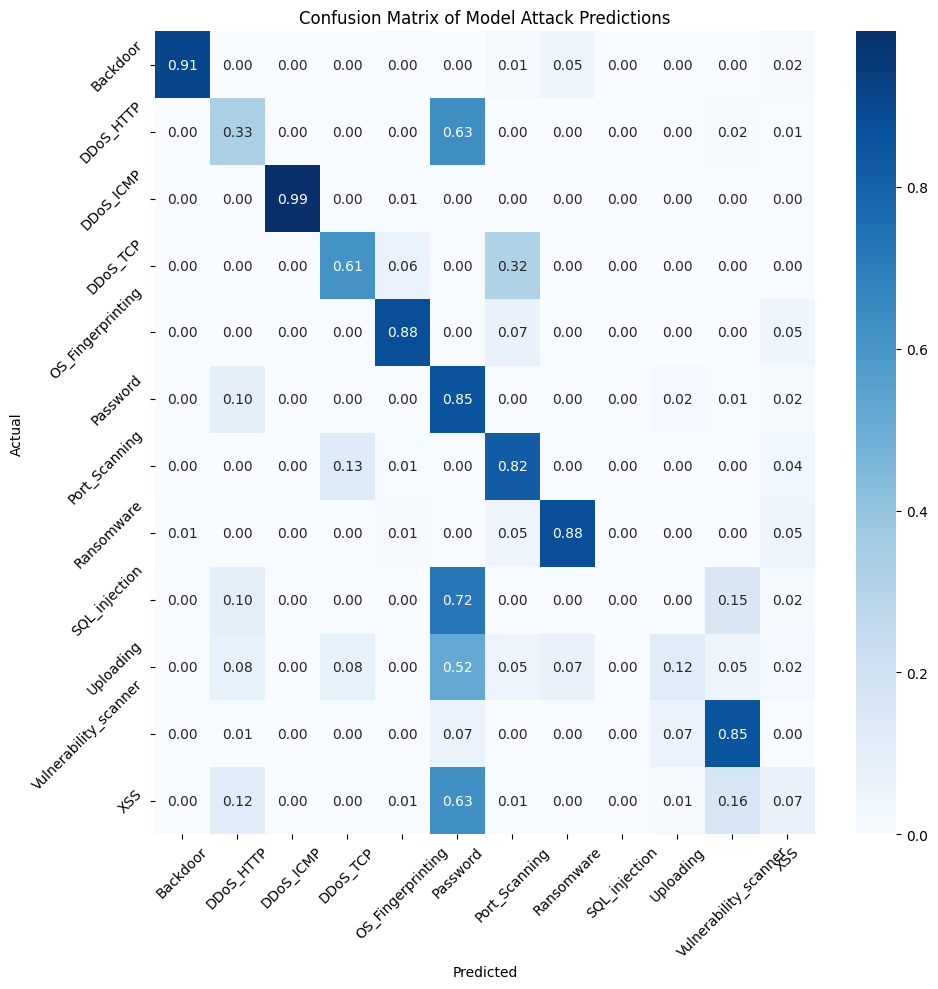

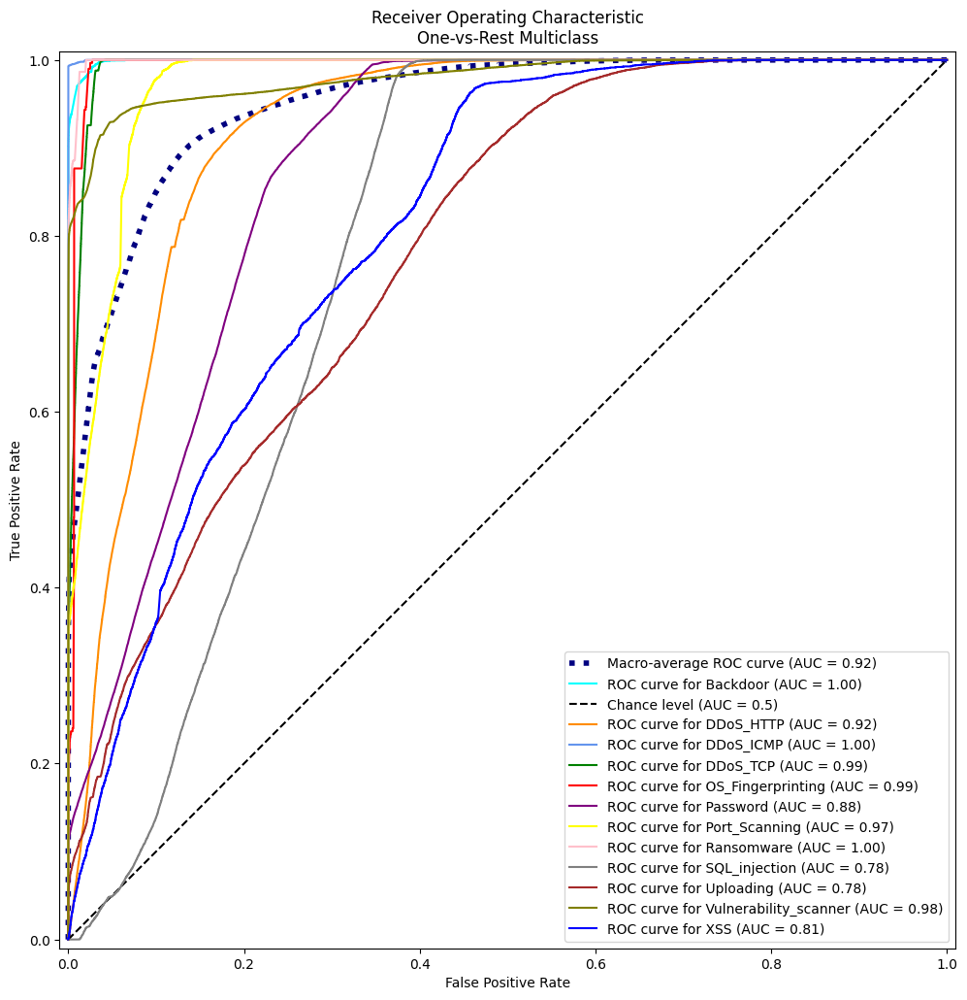

In [78]:
# Training with different time buckets
intervals = [10,5,3,2,1]  # in seconds
# Standard SMOTE
smote = SMOTE(random_state=4266)
# Borderline-SMOTE
borderline_smote = BorderlineSMOTE(random_state=4266)
# SMOTE-Tomek
smote_tomek = SMOTETomek(random_state=4266)
# SMOTE-ENN
smote_enn = SMOTEENN(random_state=4266)
sms = [borderline_smote, smote_enn, smote_tomek]

checkpoint_dir = './checkpoints_diff_sm/'

for interval in intervals:
    for sm in sms: 
        print(f"Processing interval: {interval}s")
        print(f"SMOTE used: {sm}")
        os.makedirs(f"{checkpoint_dir}/{interval}s/", exist_ok=True)
        
        # Load and discretize data
        X_train, y_train = discretize_by_time_buckets(combined_df.copy(), interval)

        # Check distribution after aggregation
        hist(y_train)
        plt.title('Distribution after aggregation', fontsize=16)
        plt.show()

        # handle class imbalance for training set
        X_train, y_train = sm.fit_resample(X_train, y_train)
        print(f"Resampled dataset size: {X_train.shape, y_train.shape}")
        
        X_cnn = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))

        # Check distribution after aggregation and SMOTE
        hist(y_train)
        plt.title(f"Distribution after aggregation and {sm}")
        plt.show()
        
        # 5-Fold Cross-Validation
        kf = KFold(n_splits=5, shuffle=True, random_state=42)
        input_shape = (X_cnn.shape[1], 1)
        all_scores = []
        
        for fold, (train_index, val_index) in enumerate(kf.split(X_cnn)):
            print(f"Fold {fold+1}")
            
            X_train_fold, X_val_fold = X_cnn[train_index], X_cnn[val_index]
            y_train_fold, y_val_fold = y_train[train_index], y_train[val_index]
            
            # Create a new model for each fold
            model = create_model(input_shape)
            
            # Model checkpointing for each fold
            checkpoint_filepath = f"{checkpoint_dir}/{interval}s/{sm}/fold_{fold+1}_checkpoint.model.keras"
            checkpoint = ModelCheckpoint(
                filepath=checkpoint_filepath,
                monitor='val_accuracy',
                mode='max',
                save_best_only=True
            )
            
            # Early stopping
            early_stopping = EarlyStopping(patience=5, restore_best_weights=True)
            
            # Train the model
            model.fit(X_train_fold, y_train_fold, epochs=100, batch_size=128,
                    validation_data=(X_val_fold, y_val_fold), callbacks=[checkpoint, early_stopping])
            
            # Evaluate the model on the validation set
            score = model.evaluate(X_val_fold, y_val_fold, verbose=0)
            all_scores.append(score)

        # Print cross-validation results
        mean_score = np.mean(all_scores, axis=0)
        std_score = np.std(all_scores, axis=0)
        print(f'Interval {interval}s, with {sm} - Mean Validation Loss: {mean_score[0]:.4f}, Mean Validation Accuracy: {mean_score[1]:.4f}')
        print(f'Interval {interval}s, with {sm} - Std Dev Loss: {std_score[0]:.4f}, Std Dev Accuracy: {std_score[1]:.4f}')

        # classification report
        y_pred = model.predict(X_test_cnn)
        y_pred_classes = np.argmax(y_pred, axis=1)

        print(classification_report(y_test, y_pred_classes))

        conf_matrix(y_pred_classes)

        auc_roc_curve(y_pred)